In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 MSC CRUISES JAPANESE GRAND PRIX 2024
The Japanese Grand Prix (Japanese: 日本グランプリ) is a motor racing event in the calendar of the Formula One World Championship. Historically, Japan has been one of the last races of the season, and as such the Japanese Grand Prix has been the venue for many title-deciding races, with 13 World Drivers' Champions being crowned over the 36 World Championship Japanese Grands Prix that have been hosted. Japan was the only Asian nation to host a Formula One race (including the Pacific Grand Prix) until Malaysia joined the calendar in 1999. Source: Wikipedia
Analyzed by Franccy del Piero Sambrano Ganoza

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2024,country_acronym='JPN')

,session_key,session_name,date_start,date_end,gmt_offset,session_type,meeting_key,location,country_key,country_code,country_name,circuit_key,circuit_short_name,year
0,9489,Practice 1,2024-04-05T02:30:00+00:00,2024-04-05T03:30:00+00:00,09:00:00,Practice,1232,Suzuka,4,JPN,Japan,46,Suzuka,2024
1,9490,Practice 2,2024-04-05T06:00:00+00:00,2024-04-05T07:00:00+00:00,09:00:00,Practice,1232,Suzuka,4,JPN,Japan,46,Suzuka,2024
2,9491,Practice 3,2024-04-06T02:30:00+00:00,2024-04-06T03:30:00+00:00,09:00:00,Practice,1232,Suzuka,4,JPN,Japan,46,Suzuka,2024
3,9492,Qualifying,2024-04-06T06:00:00+00:00,2024-04-06T07:00:00+00:00,09:00:00,Qualifying,1232,Suzuka,4,JPN,Japan,46,Suzuka,2024
4,9496,Race,2024-04-07T05:00:00+00:00,2024-04-07T07:00:00+00:00,09:00:00,Race,1232,Suzuka,4,JPN,Japan,46,Suzuka,2024


## Free Practice 1
### Obtain setup

In [3]:
practice = libraryDataF1.obtain_information('laps',session_key=9489)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9489)
drivers = libraryDataF1.obtain_information('drivers',session_key=9489)

In [4]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

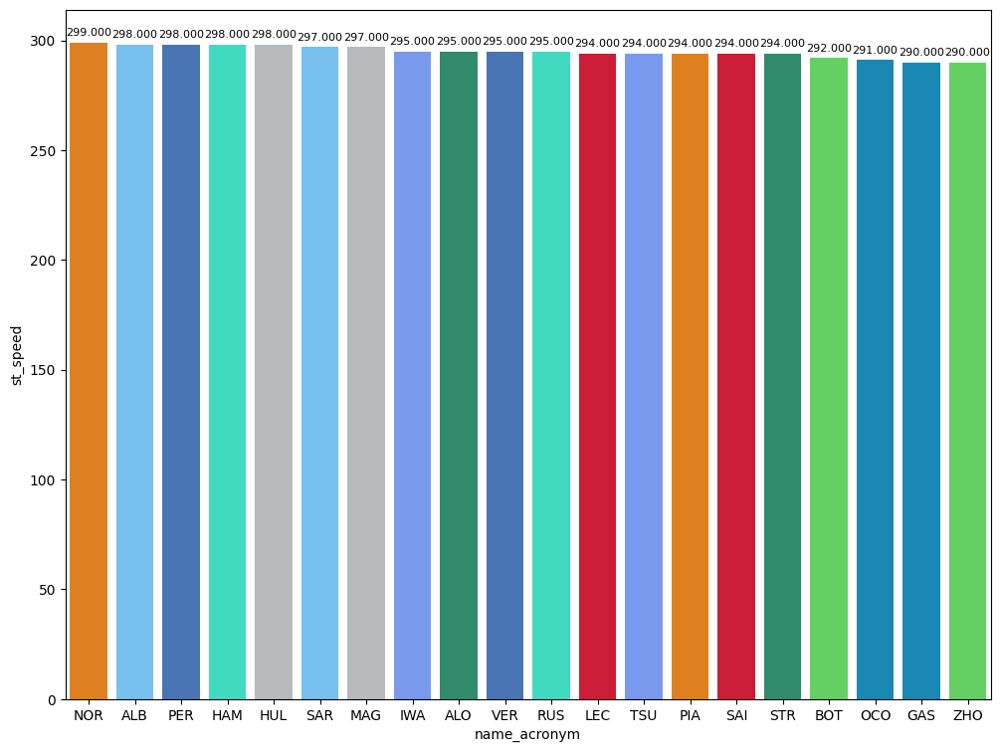

In [5]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

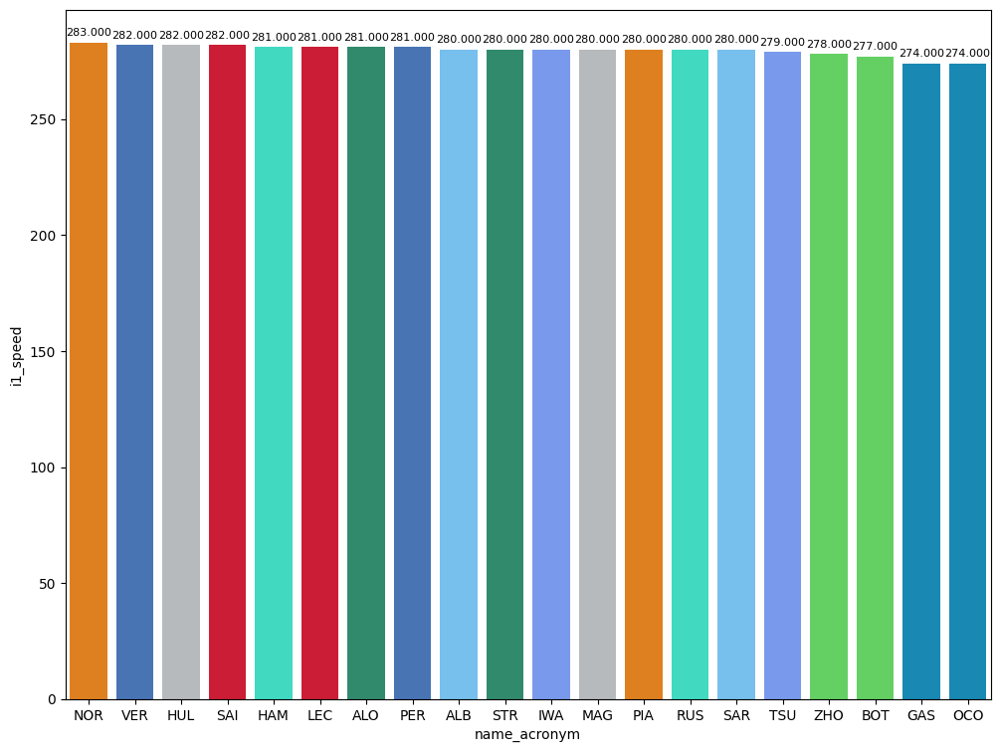

In [6]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

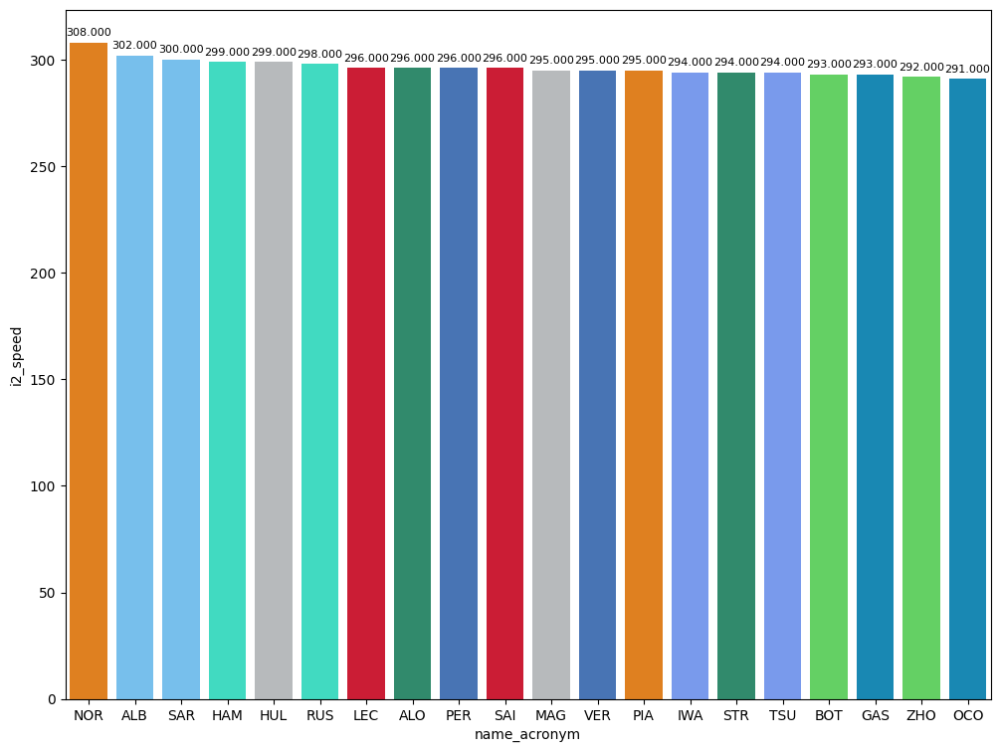

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [8]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
146,Max VERSTAPPEN,HARD,32.166,41.363,17.934,91.463
53,Lando NORRIS,MEDIUM,32.117,41.298,18.366,91.781
197,Max VERSTAPPEN,SOFT,31.603,40.617,17.836,90.056


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [9]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


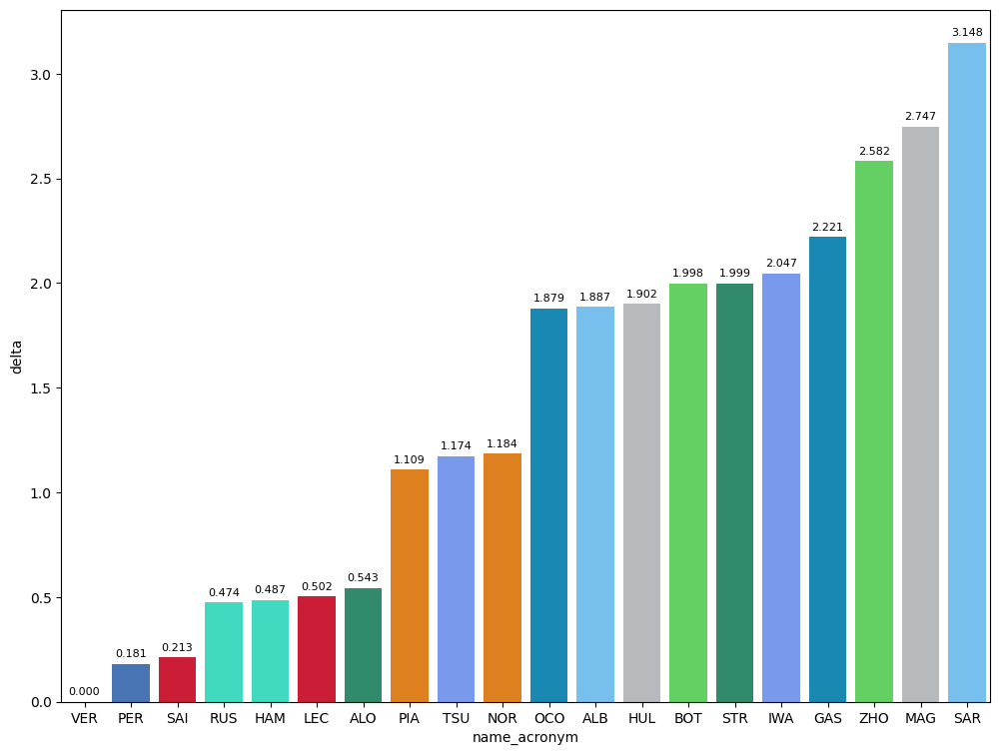

In [10]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

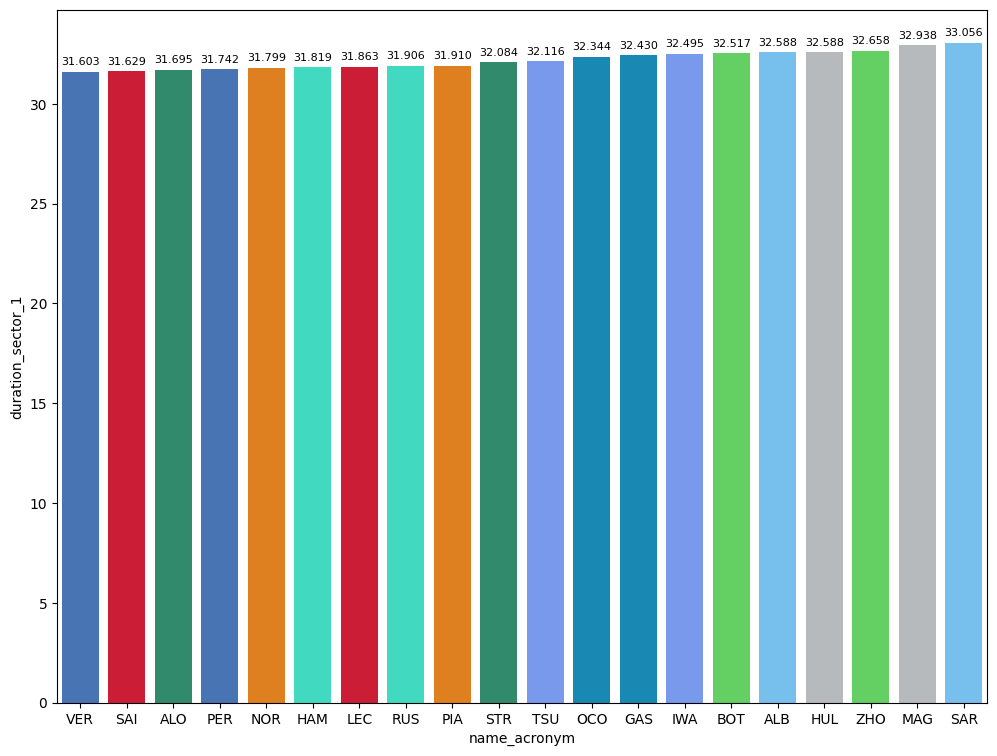

In [11]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

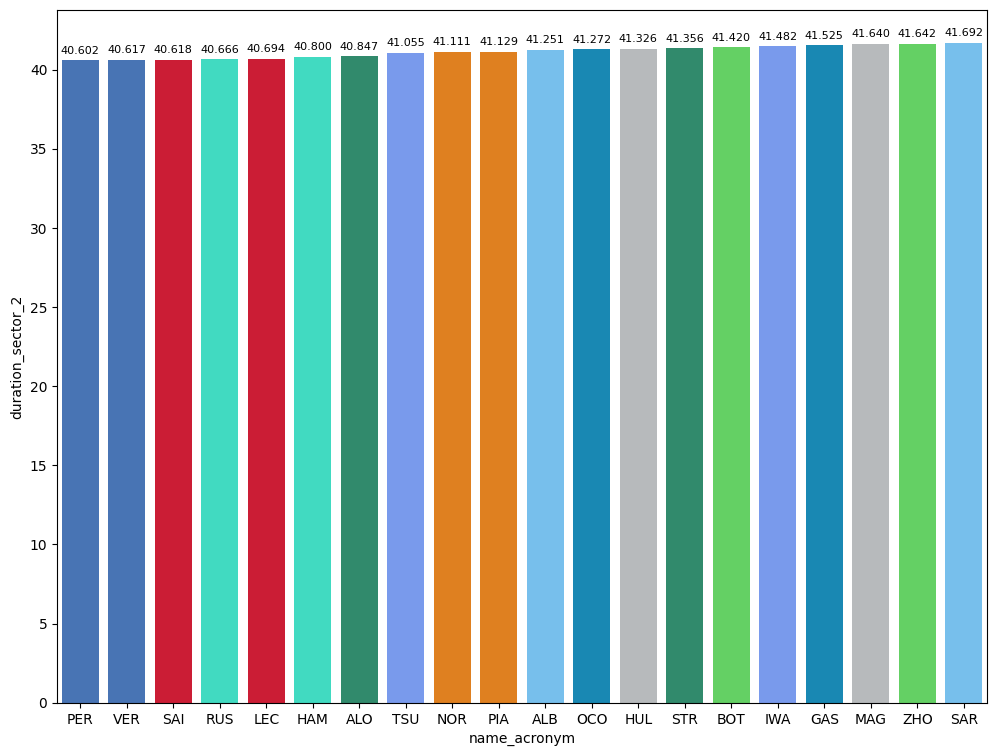

In [12]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

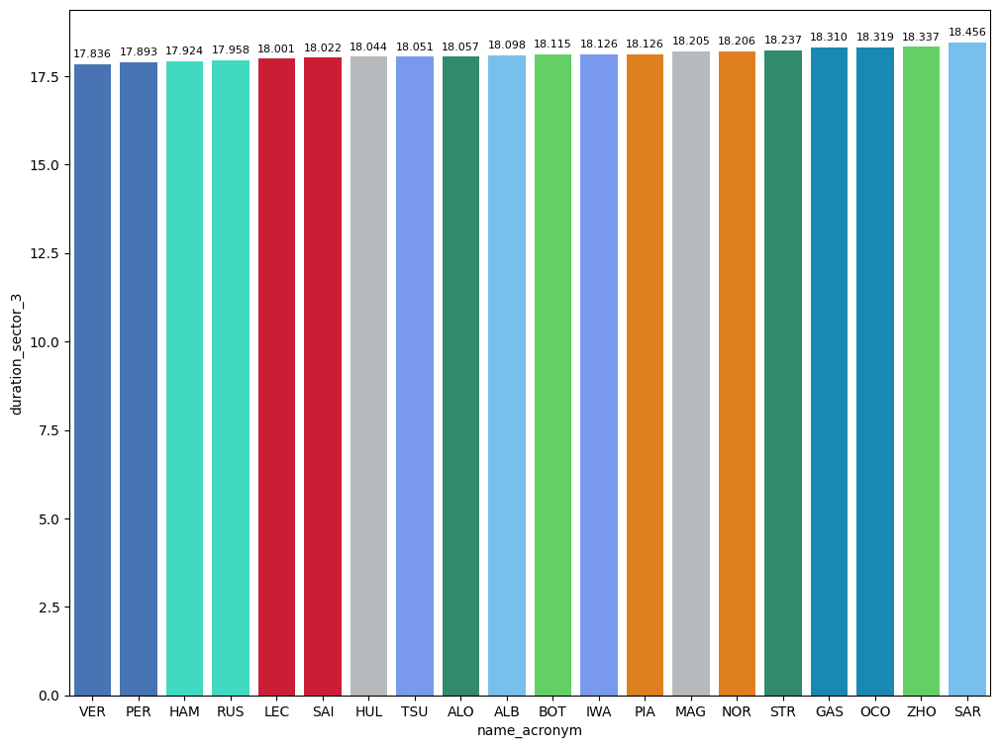

In [13]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [14]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 100").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,93.606955
HARD,93.929120
SOFT,94.226729


## Free Practice 2
### Obtain setup

In [15]:
practice = libraryDataF1.obtain_information('laps',session_key=9490)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9490)
drivers = libraryDataF1.obtain_information('drivers',session_key=9490)

In [16]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

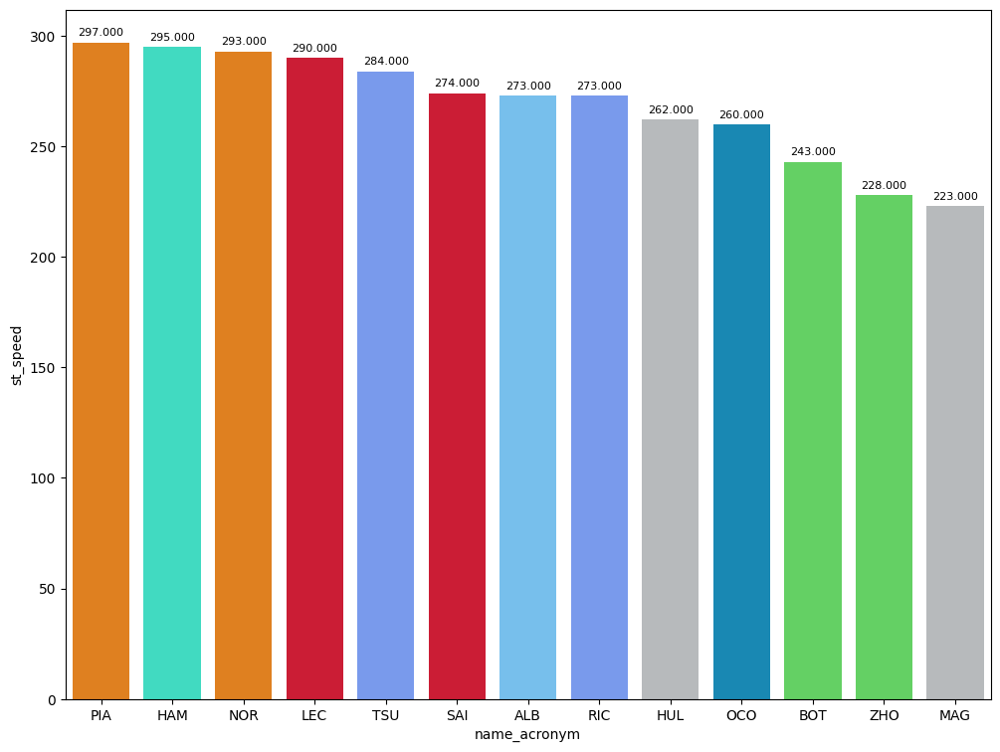

In [17]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

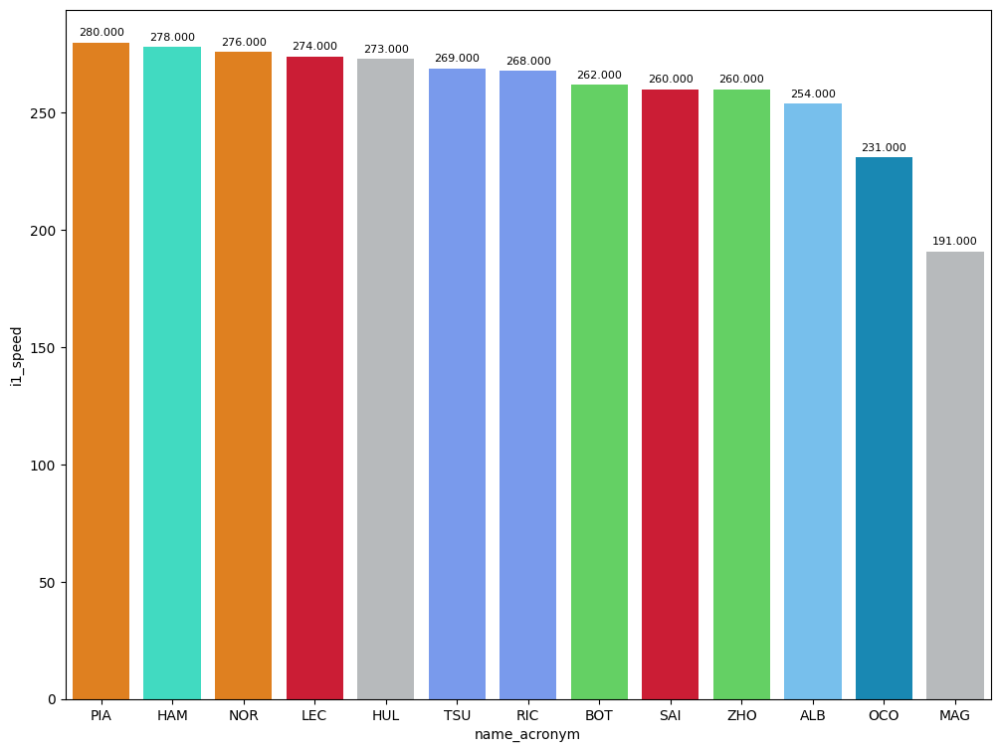

In [18]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

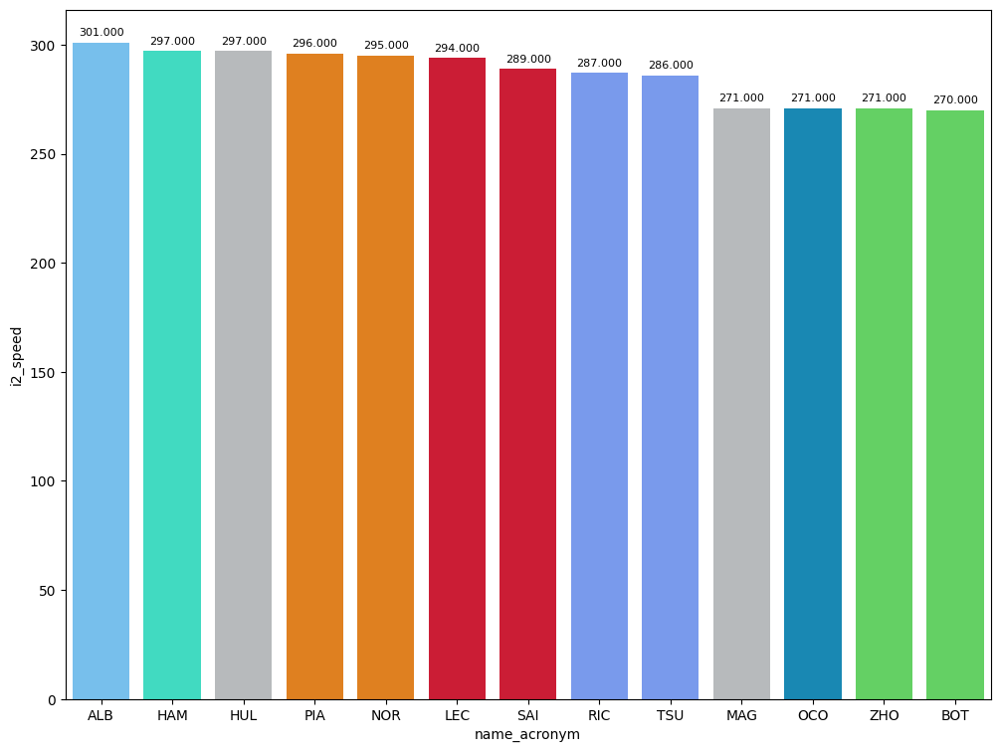

In [19]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [20]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
42,Yuki TSUNODA,INTERMEDIATE,35.839,45.384,19.723,100.946
22,Lewis HAMILTON,MEDIUM,36.494,51.965,26.484,114.943
56,Oscar PIASTRI,SOFT,34.616,41.883,18.226,94.725


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [21]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


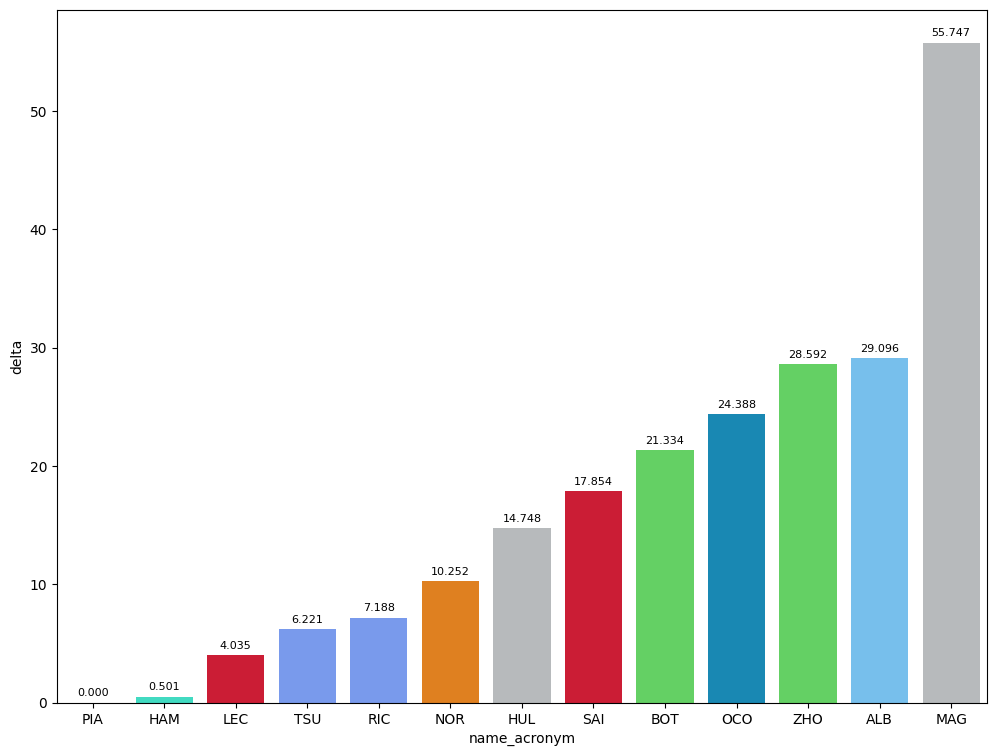

In [22]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

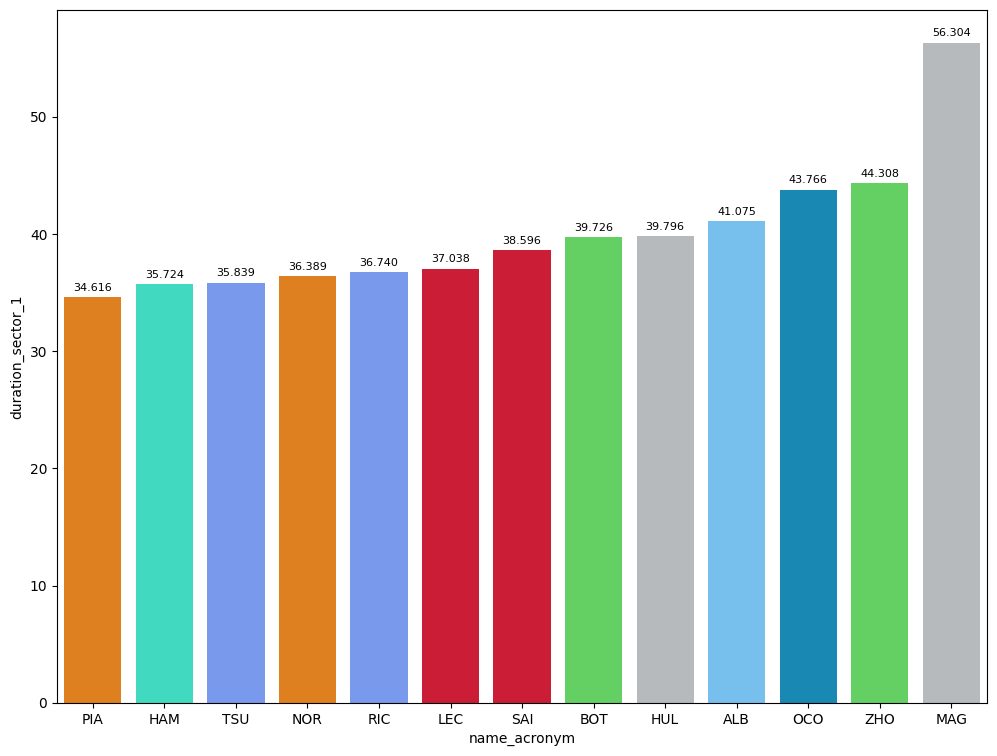

In [23]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

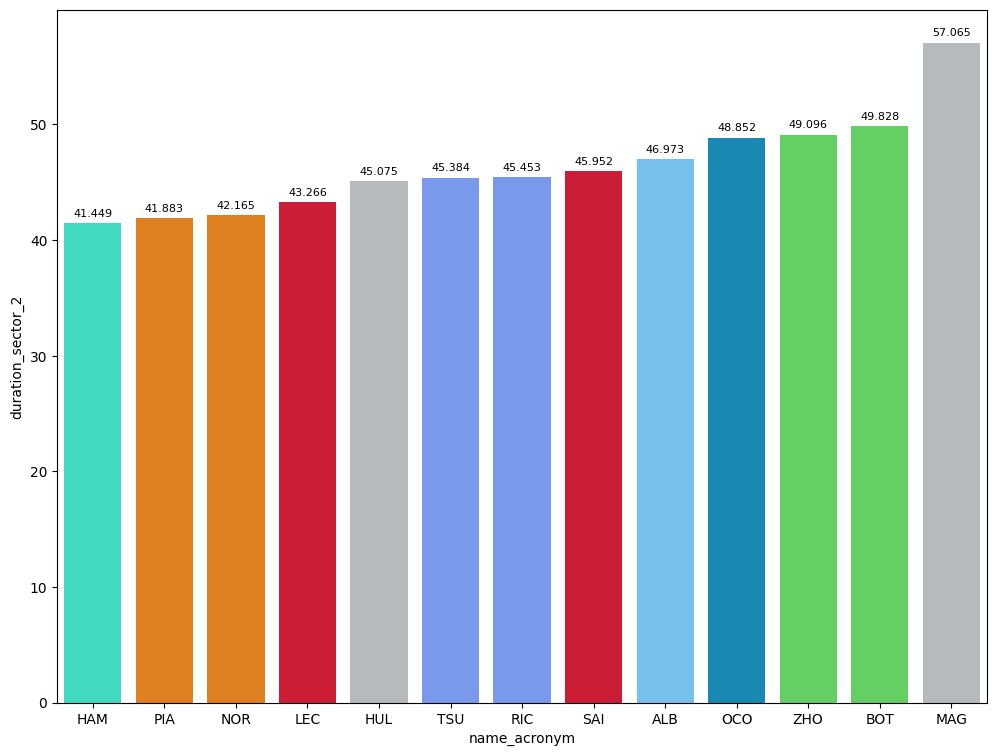

In [24]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

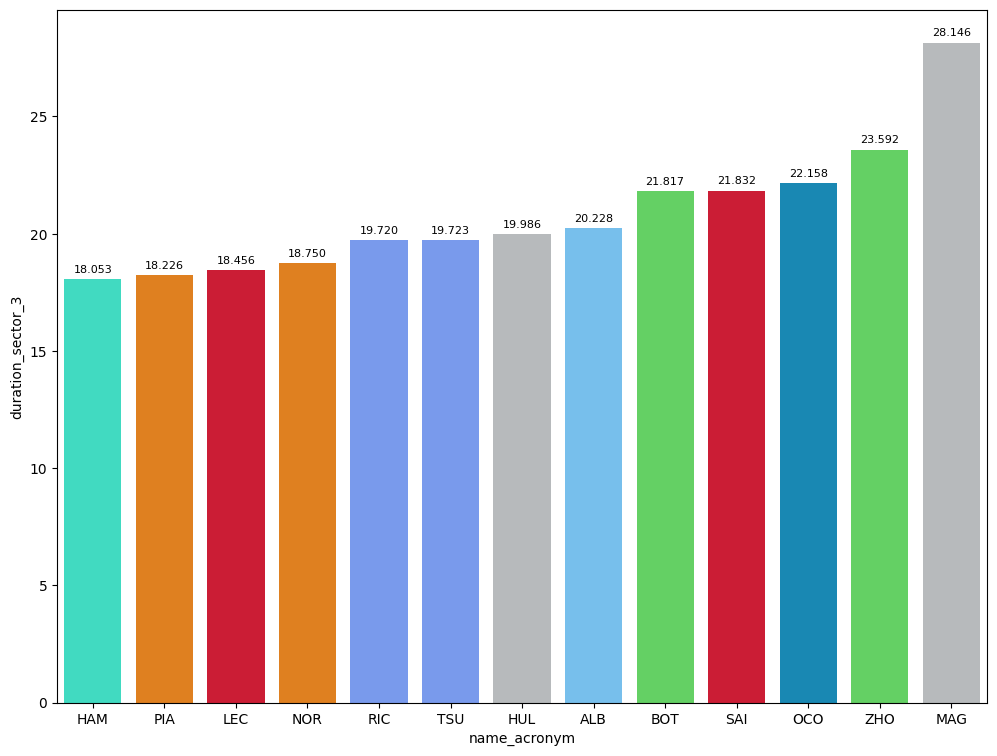

In [25]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [26]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 110").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,99.875429
INTERMEDIATE,102.906000


### Long runs

In [27]:
MINIMUN_SECONDS = 76
MAXIMUM_SECONDS = 93

#### Red Bull Racing

In [28]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1232,9490,1,1,1,1,None,NaN
3,1232,9490,1,11,1,1,None,NaN


In [29]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [30]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [31]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [32]:
data = libraryDataF1.getinfolongruns(jointables2,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [33]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [34]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [35]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
17,1232,9490,1,55,1,4,SOFT,0.0
18,1232,9490,1,16,1,5,SOFT,0.0


In [36]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [37]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [38]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [39]:
data = libraryDataF1.getinfolongruns(jointables2,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [40]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [41]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [42]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1232,9490,1,63,1,1,None,NaN
14,1232,9490,1,44,1,3,MEDIUM,0.0
30,1232,9490,2,44,4,7,SOFT,0.0


In [43]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [44]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [45]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [46]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [47]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [48]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [49]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1232,9490,1,81,1,2,INTERMEDIATE,0.0
15,1232,9490,1,4,1,4,SOFT,0.0
25,1232,9490,2,81,3,8,SOFT,0.0


In [50]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [51]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [52]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [53]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [54]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [55]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [56]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1232,9490,1,14,1,1,None,NaN
5,1232,9490,1,18,1,1,None,NaN


In [57]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [58]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [59]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [60]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [61]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [62]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [63]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1232,9490,1,3,1,2,MEDIUM,0.0
19,1232,9490,1,22,1,6,INTERMEDIATE,0.0
24,1232,9490,2,3,3,7,INTERMEDIATE,0.0
35,1232,9490,2,22,7,9,INTERMEDIATE,5.0
36,1232,9490,3,3,8,10,INTERMEDIATE,5.0


In [64]:
data = libraryDataF1.getinfolongruns(jointables2,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [65]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [66]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [67]:
data = libraryDataF1.getinfolongruns(jointables2,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [68]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [69]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [70]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1232,9490,1,20,1,2,SOFT,0.0
13,1232,9490,1,27,1,3,SOFT,0.0
23,1232,9490,2,20,3,5,INTERMEDIATE,0.0
29,1232,9490,2,27,4,6,SOFT,2.0


In [71]:
data = libraryDataF1.getinfolongruns(jointables2,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [72]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [73]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [74]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [75]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [76]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [77]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1232,9490,1,10,1,1,None,NaN
16,1232,9490,1,31,1,4,SOFT,0.0


In [78]:
data =libraryDataF1.getinfolongruns(jointables2,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [79]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [80]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [81]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [82]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [83]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [84]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1232,9490,1,2,1,1,None,NaN
9,1232,9490,1,23,1,2,INTERMEDIATE,0.0
20,1232,9490,2,23,3,3,INTERMEDIATE,0.0
28,1232,9490,3,23,4,6,INTERMEDIATE,0.0


In [85]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [86]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [87]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [88]:
data= libraryDataF1.getinfolongruns(jointables2,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [89]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [90]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [91]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1232,9490,1,24,1,2,INTERMEDIATE,0.0
11,1232,9490,1,77,1,2,INTERMEDIATE,0.0
21,1232,9490,2,24,3,3,INTERMEDIATE,1.0
22,1232,9490,2,77,3,3,INTERMEDIATE,1.0
26,1232,9490,3,24,4,4,INTERMEDIATE,2.0
27,1232,9490,3,77,4,4,INTERMEDIATE,2.0
31,1232,9490,4,24,5,5,INTERMEDIATE,3.0
32,1232,9490,4,77,5,5,INTERMEDIATE,3.0
33,1232,9490,5,24,6,8,SOFT,0.0
34,1232,9490,5,77,6,8,SOFT,0.0


In [92]:
data = libraryDataF1.getinfolongruns(jointables2,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [93]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [94]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [95]:
data = libraryDataF1.getinfolongruns(jointables2,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [96]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [97]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [98]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [99]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [100]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3


##### Sorted by sector 1

In [101]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1


##### Sorted by sector 2

In [102]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2


##### Sorted by sector 3

In [103]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3


#### Long runs mean

In [104]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [111]:
#libraryDataF1.showDataLongRuns(longruns_summary,"INTERMEDIATE","mean_lap_time",['driver','mean_lap_time'])

In [109]:
#libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

In [110]:
#libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

## Free Practice 3
### Obtain setup

In [112]:
practice = libraryDataF1.obtain_information('laps',session_key=9491)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9491)
drivers = libraryDataF1.obtain_information('drivers',session_key=9491)

In [113]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [114]:
session = ff1.get_session(2024, 4, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (1.53 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Japanese Grand Prix - Practice 3 [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loading data...
_api           INFO 	Fetchin

### Speed trap

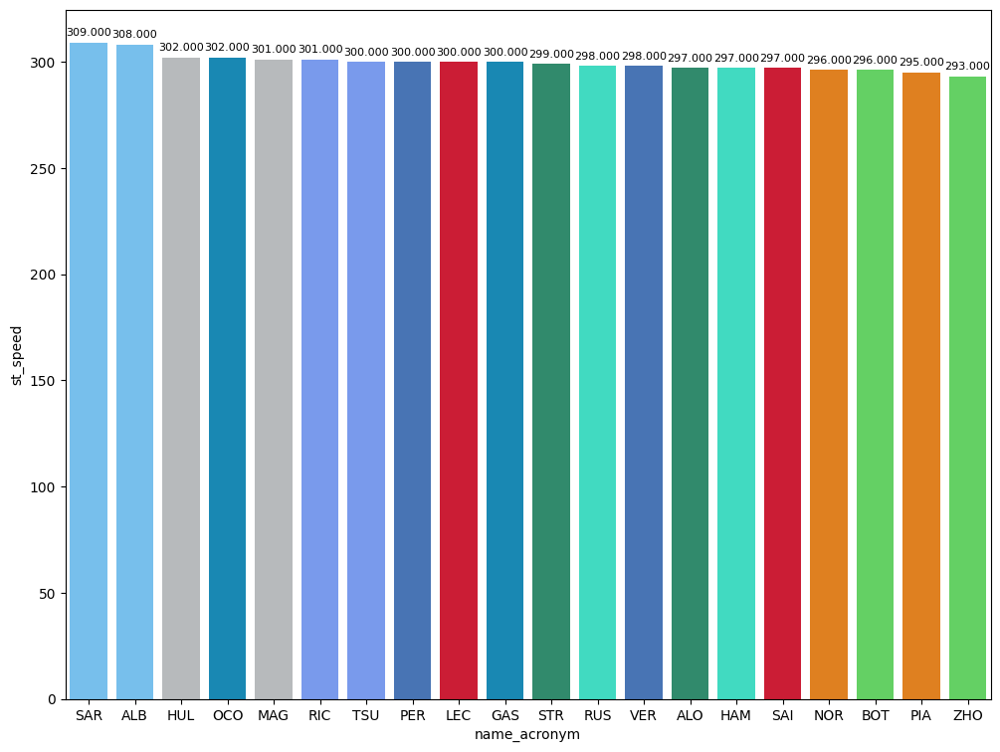

In [115]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

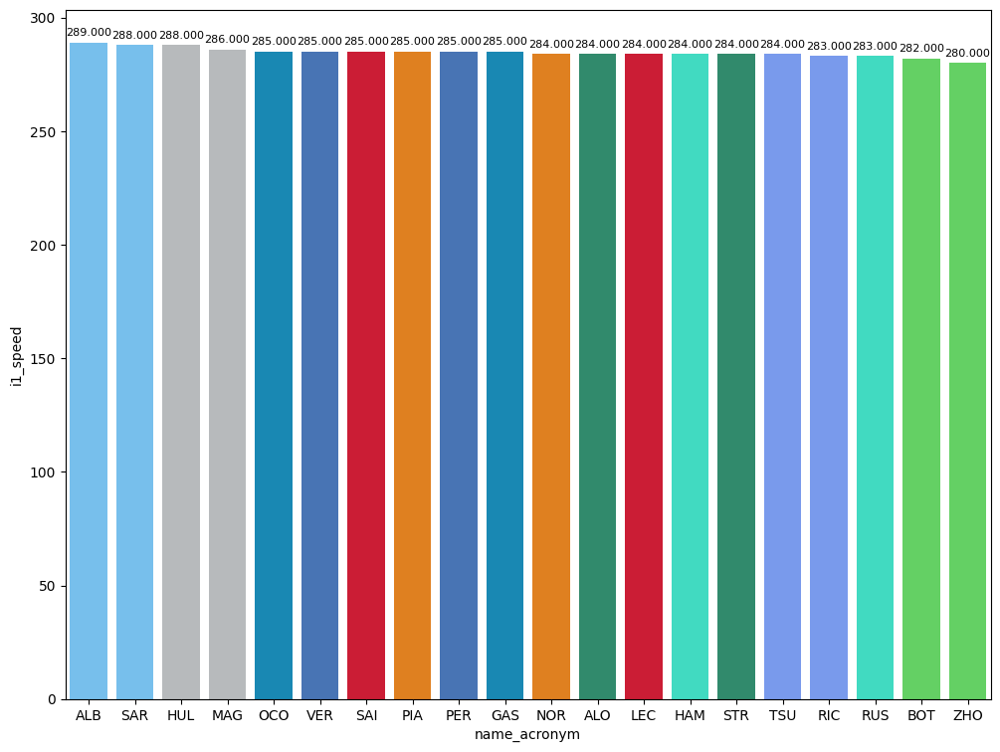

In [116]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

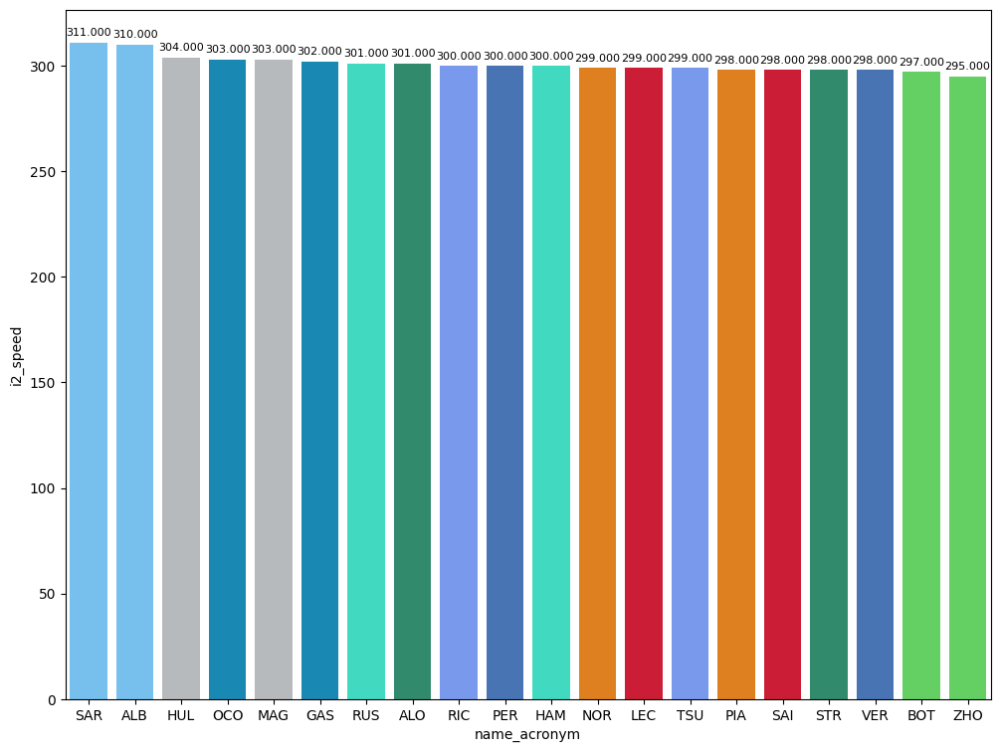

In [117]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [118]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
94,Fernando ALONSO,HARD,31.925,40.965,17.921,90.811
34,Max VERSTAPPEN,MEDIUM,31.727,40.639,17.827,90.193
316,Max VERSTAPPEN,SOFT,31.458,40.438,17.667,89.563


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [119]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


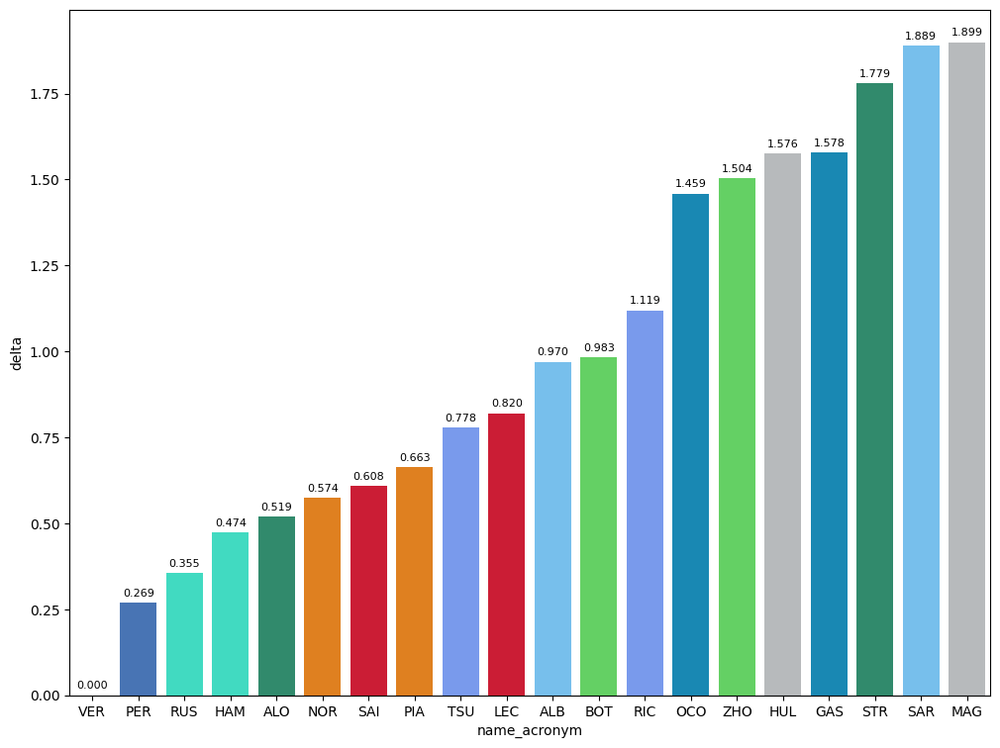

In [120]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

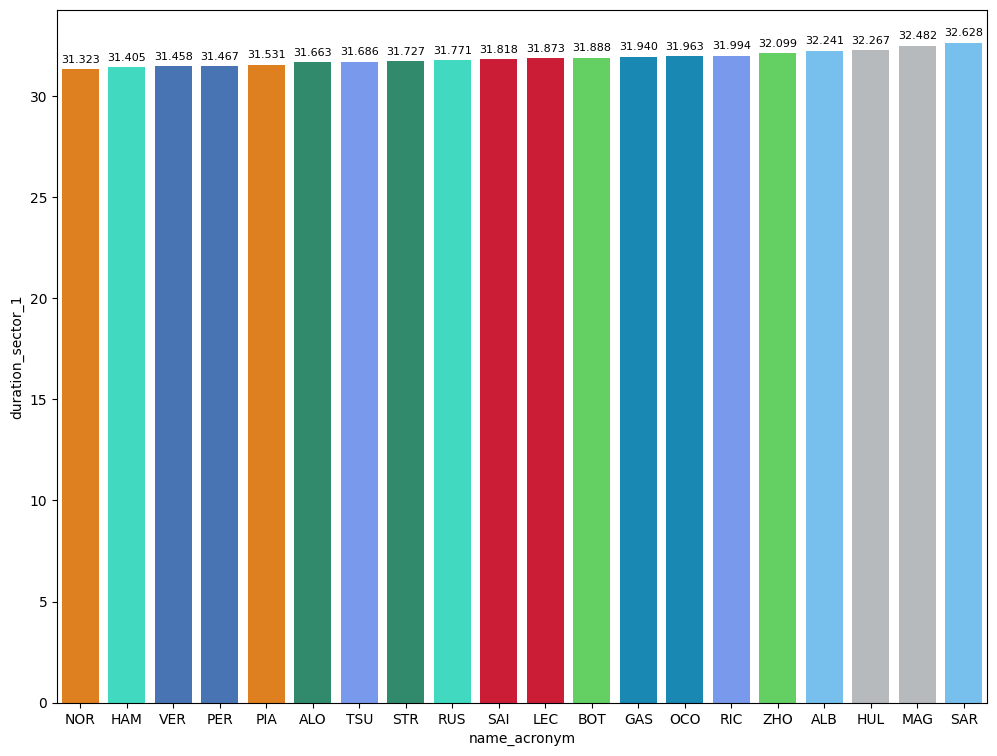

In [121]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

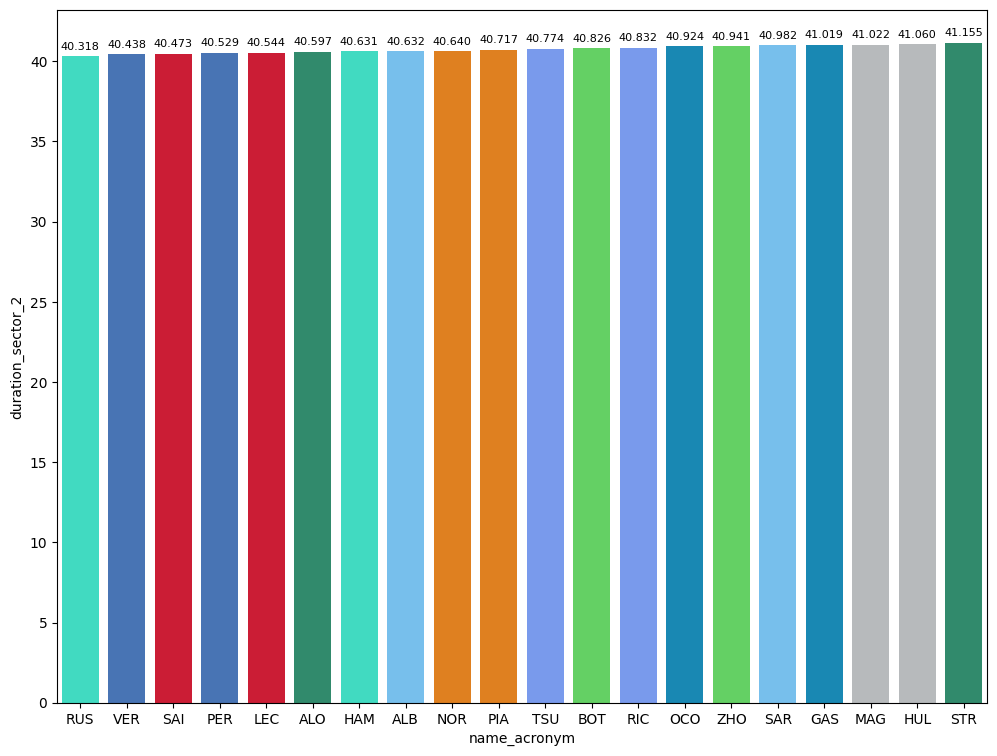

In [122]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

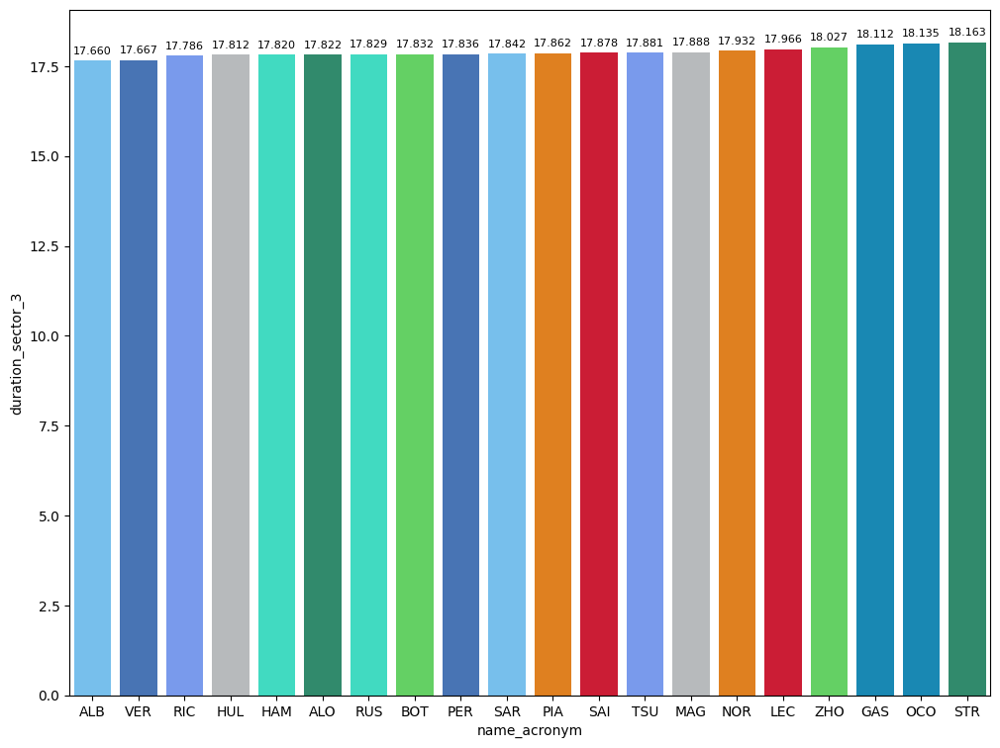

In [123]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [124]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 103").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,94.403311
HARD,95.457826
MEDIUM,96.047980


### Comparaison between the poleman and the second

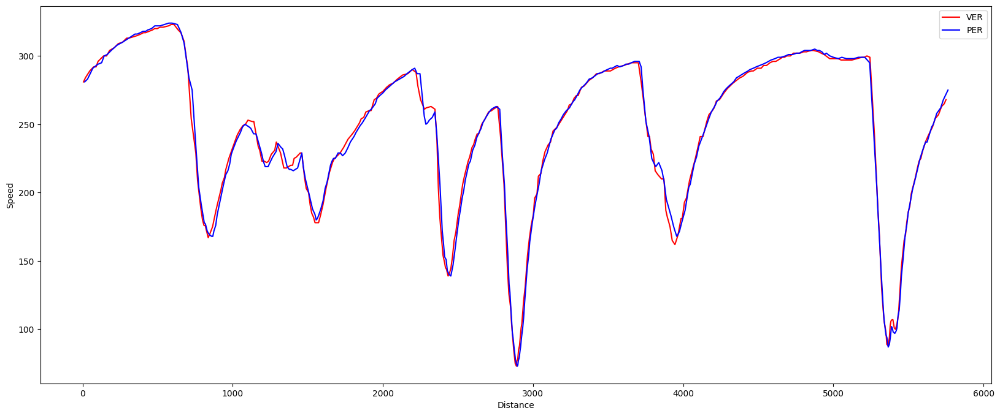

In [125]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

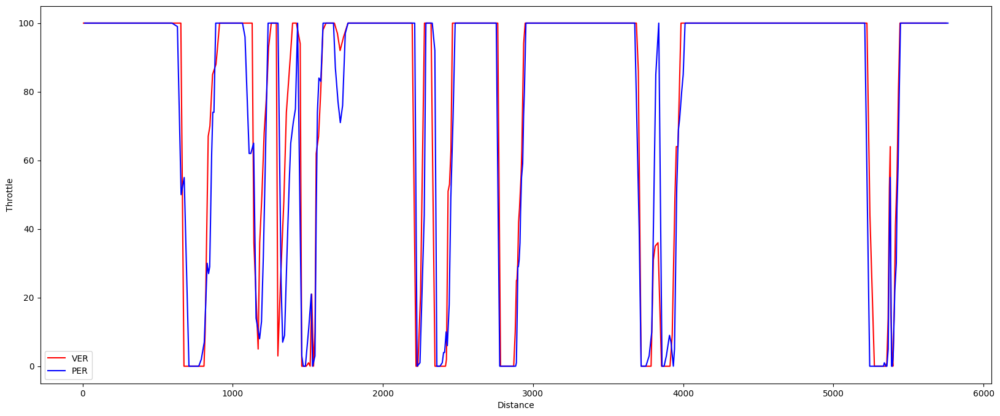

In [126]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

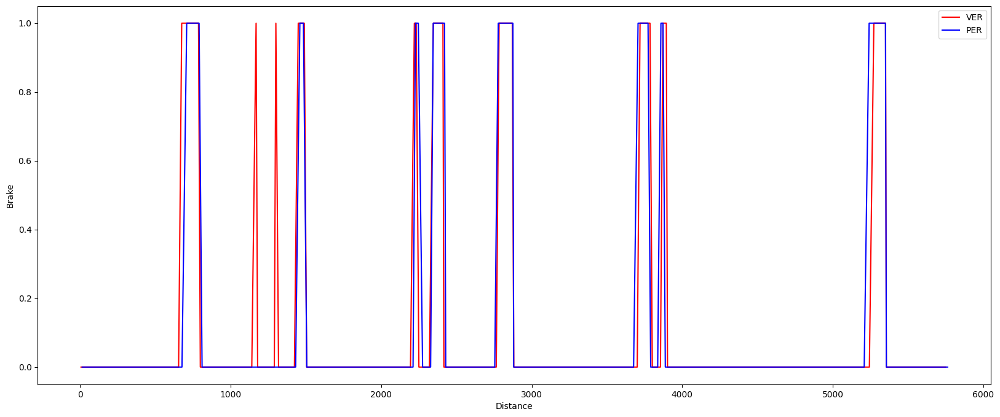

In [127]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

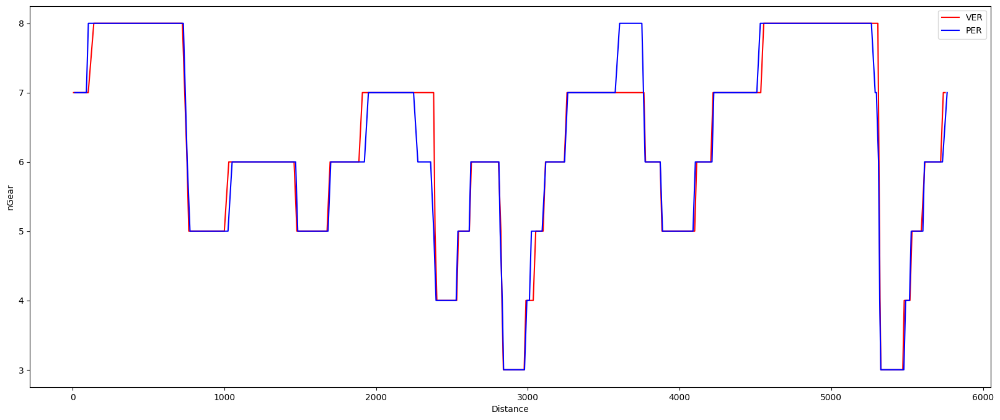

In [128]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [129]:
libraryDataF1.obtain_information('race_control',session_key=9492)

,session_key,meeting_key,date,category,flag,lap_number,message,driver_number,scope,sector
0,9492,1232,2024-04-06T06:00:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,None
1,9492,1232,2024-04-06T06:05:52+00:00,Other,None,None,INCIDENT INVOLVING CARS 63 (RUS) AND 81 (PIA) ...,None,None,None
2,9492,1232,2024-04-06T06:06:01+00:00,Other,None,None,FIA STEWARDS: INCIDENT INVOLVING CARS 63 (RUS)...,None,None,None
3,9492,1232,2024-04-06T06:18:00+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,None,Track,None
4,9492,1232,2024-04-06T06:18:16+00:00,Other,None,None,FIRST CAR TO TAKE THE FLAG - CAR 20 (MAG),None,None,None
5,9492,1232,2024-04-06T06:21:22+00:00,Other,None,None,FIA STEWARDS: Q1 INCIDENT INVOLVING CARS 23 (A...,None,None,None
6,9492,1232,2024-04-06T06:21:35+00:00,Other,None,None,FIA STEWARDS: Q1 INCIDENT INVOLVING CARS 23 (A...,None,None,None
7,9492,1232,2024-04-06T06:25:00+00:00,Flag,GREEN,None,GREEN LIGHT - PIT EXIT OPEN,None,Track,None
8,9492,1232,2024-04-06T06:32:16+00:00,Other,None,None,CAR 27 (HUL) TIME 1:30.658 DELETED - TRACK LIM...,None,None,None
9,9492,1232,2024-04-06T06:40:00+00:00,Flag,CHEQUERED,None,CHEQUERED FLAG,None,Track,None


### Obtain setup

In [130]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9492)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9492)
drivers = libraryDataF1.obtain_information('drivers',session_key=9492)
libraryDataF1.obtain_drivers_colours(drivers)

In [131]:
session = ff1.get_session(2024, 4, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Japanese Grand Prix - Qualifying [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '4', '55', '14', '81', '44', '16', '63', '22', '3', '27', '77', '23', '31', '18', '10', '20', '2', '24']


To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [132]:
qualyfing = qualyfing.drop(116)

In [133]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,duration_sector_2,duration_sector_3,segments_sector_1,segments_sector_2,segments_sector_3,lap_number
206,1232,9492,1,285,297,295,2024-04-06T06:58:14.889000+00:00,88.197,False,30.777,39.85,17.57,"[2048, 2048, 2049, 2049, 2048, 2048, 2049, 204...","[2049, 2049, 2049, 2048, 2048, 2049, 2048, 204...","[2048, 2048, 2048, 2064, 2064]",11


In this case, the fastest lap is 88.197 seconds (1.28.197= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (94.370 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [134]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 95.406")

In [135]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole. In this case, this happened with Leclerc taking the best time but not taking the pole because his cest time in Q3 was not the best time of the session.

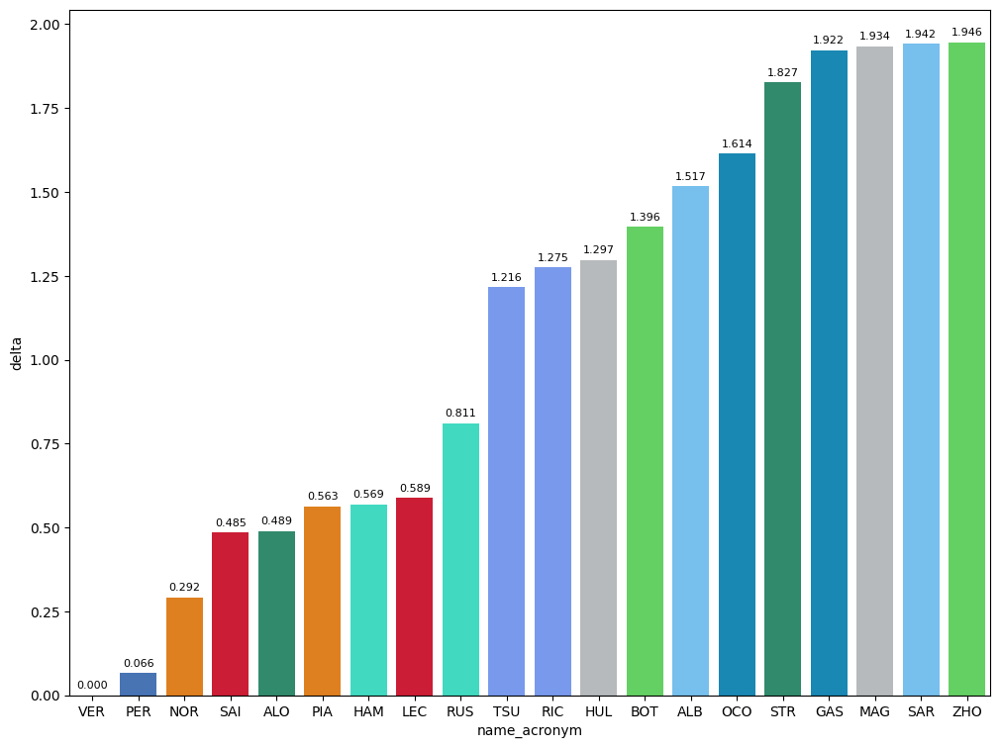

In [136]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

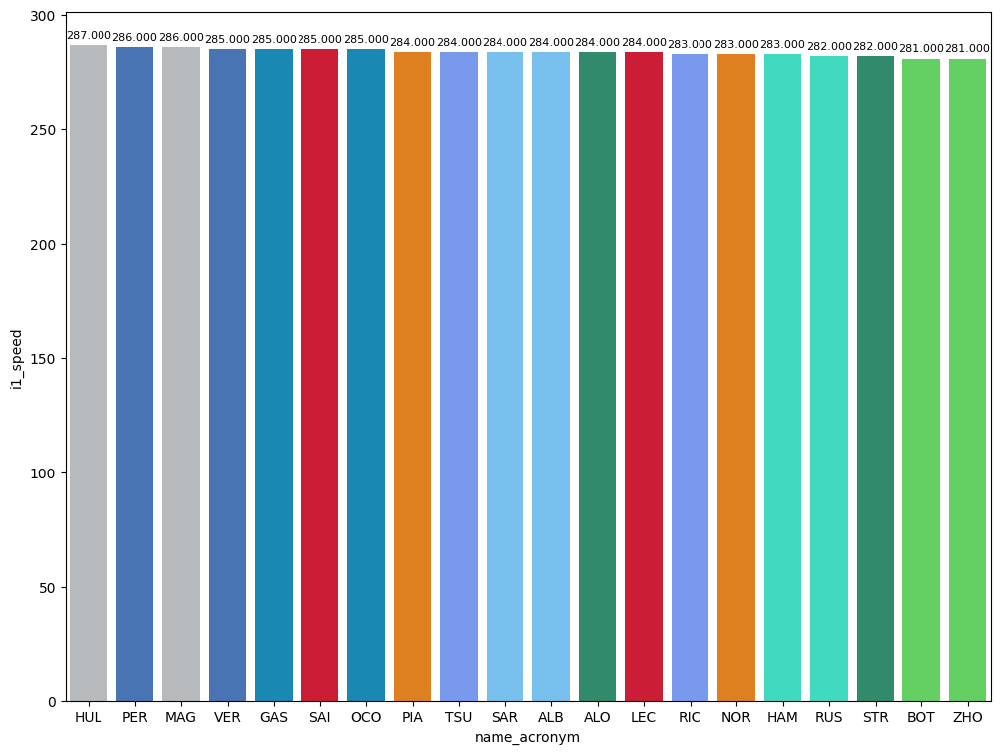

In [137]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

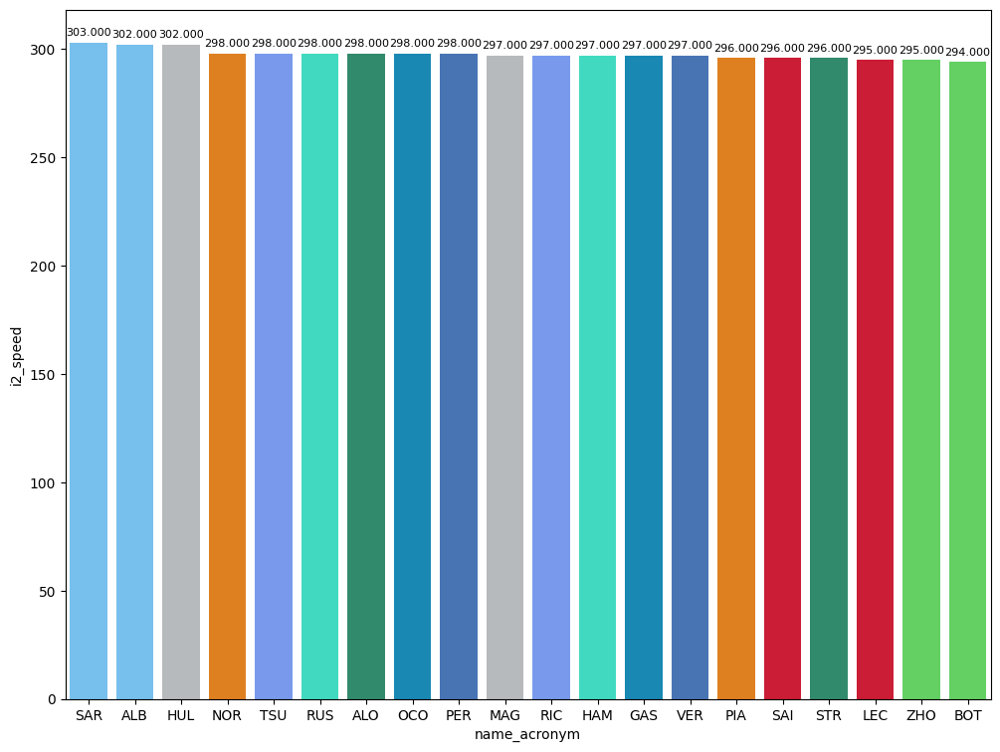

In [138]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

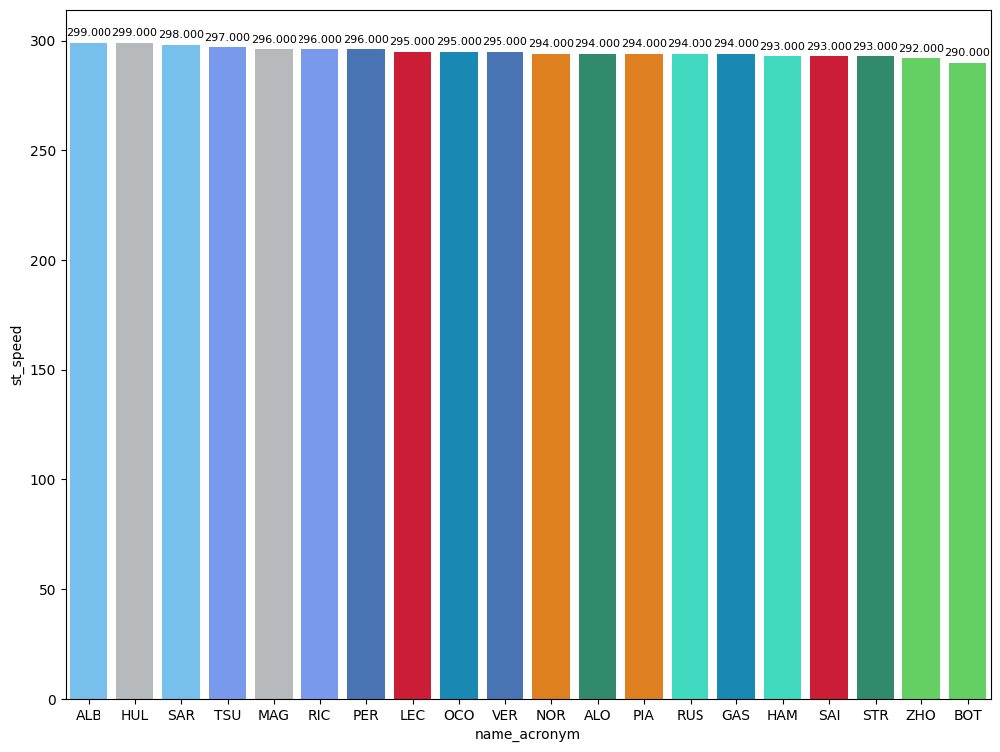

In [139]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

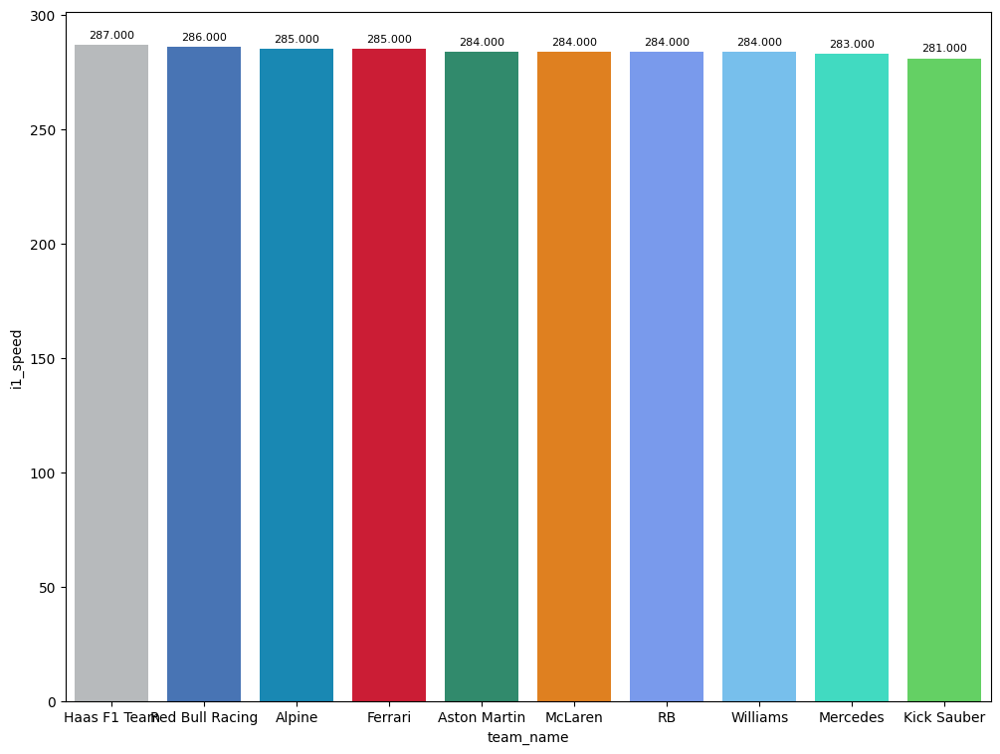

In [140]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

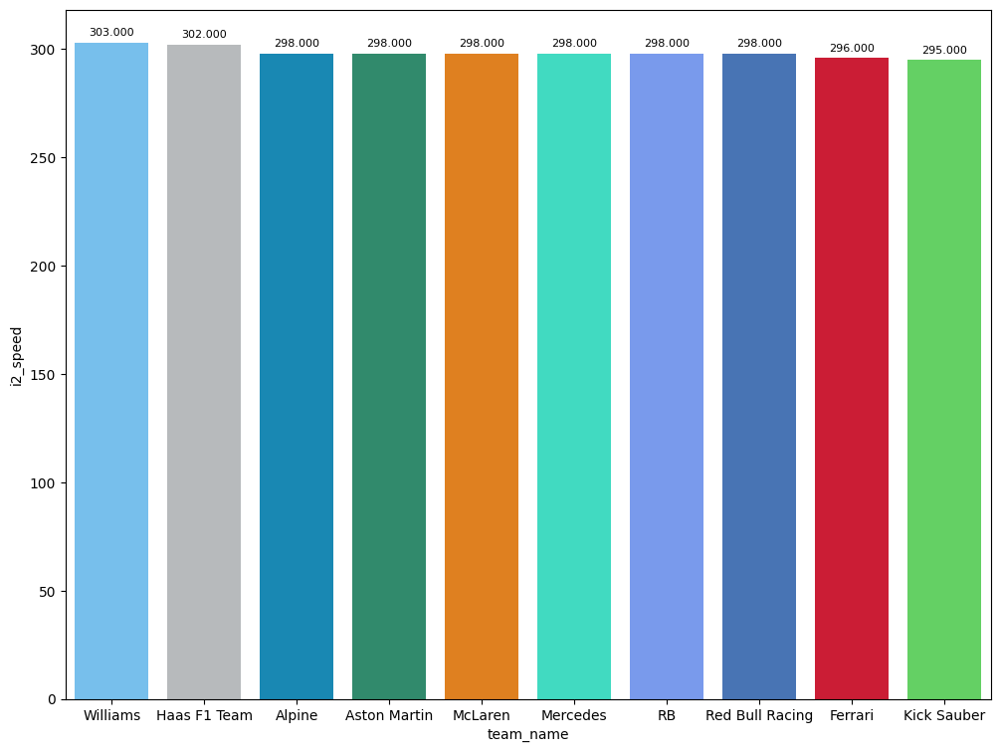

In [141]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

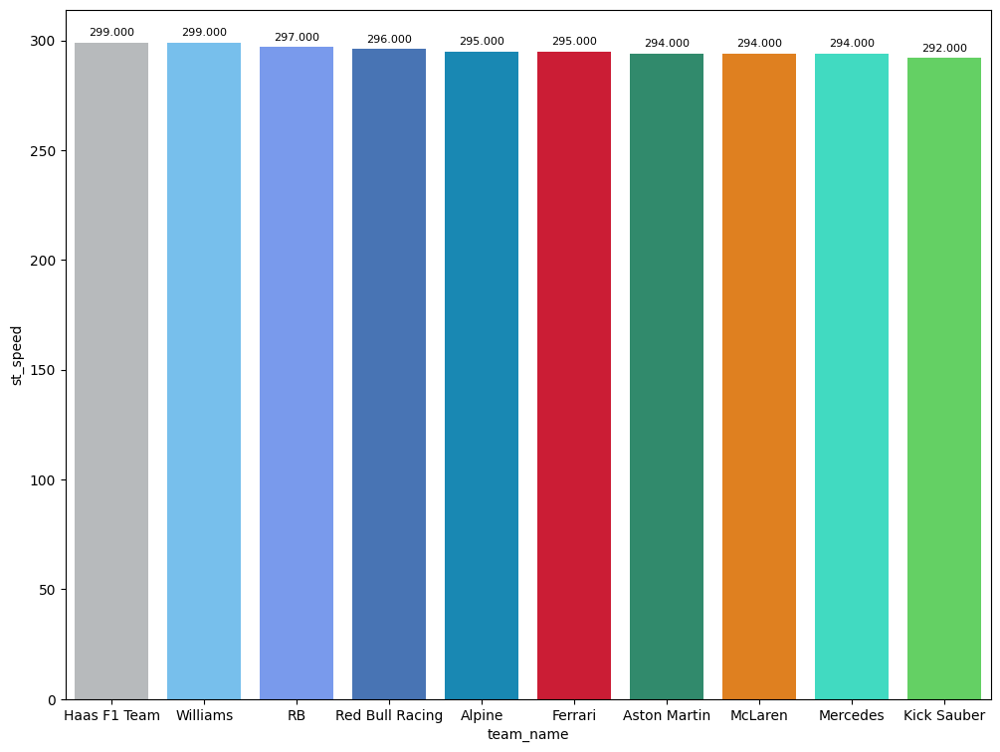

In [142]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [143]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [144]:
maximumDateQ1 = "date_start <'2024-04-06T06:25:00'"
maximumDateQ2 = "date_start <'2024-04-06T06:48:00' and date_start >'2024-04-06T06:25:00'"
maximumDateQ3 = "date_start >'2024-04-06T06:48:00'"

### Qualyfing 1
In this session the surprise came from Aston Martin with Stroll that knocked-out in Q1. The rest of the drivers were expected to be knocked-out

In [145]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [146]:
#Reference
P15 = q1Data[14:15]

In [147]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Alexander ALBON Sector 1:  31.584 Sector 2:  40.602 Sector 3:  17.777


In [148]:
q1Data[15::]

,meeting_key_x,session_key_x,driver_number,i1_speed,i2_speed,st_speed,date_start,lap_duration,is_pit_out_lap,duration_sector_1,...,broadcast_name,country_code,first_name,full_name,headshot_url,last_name,team_colour,team_name,name_acronym,isFastestLap
42,1232,9492,18,282,297,295,2024-04-06T06:07:26.800000+00:00,90.024,False,31.498,...,L STROLL,CAN,Lance,Lance STROLL,https://media.formula1.com/d_driver_fallback_i...,Stroll,229971,Aston Martin,STR,True
53,1232,9492,10,285,297,294,2024-04-06T06:16:19.488000+00:00,90.119,False,31.468,...,P GASLY,FRA,Pierre,Pierre GASLY,https://media.formula1.com/d_driver_fallback_i...,Gasly,0093CC,Alpine,GAS,True
2,1232,9492,20,287,302,298,2024-04-06T06:16:32.968000+00:00,90.131,False,31.786,...,K MAGNUSSEN,DEN,Kevin,Kevin MAGNUSSEN,https://media.formula1.com/d_driver_fallback_i...,Magnussen,B6BABD,Haas F1 Team,MAG,True
4,1232,9492,2,284,303,298,2024-04-06T06:13:39.130000+00:00,90.139,False,31.744,...,L SARGEANT,USA,Logan,Logan SARGEANT,https://media.formula1.com/d_driver_fallback_i...,Sargeant,64C4FF,Williams,SAR,True
68,1232,9492,24,282,295,293,2024-04-06T06:17:34.222000+00:00,90.143,False,31.685,...,G ZHOU,CHN,Guanyu,ZHOU Guanyu,https://media.formula1.com/d_driver_fallback_i...,Zhou,52E252,Kick Sauber,ZHO,True


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
It was a close battle to pass to Q2 with less of 2 tenths among the driver at risk and the last driver. Until the third sector, Stroll and Gasly had the chance to pass to Q2.

In [149]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,18,0.061,-0.086,-0.056,0.203,STR
1,10,0.156,-0.116,0.060,0.212,GAS
2,20,0.168,0.202,-0.120,0.086,MAG
3,2,0.176,0.160,-0.060,0.076,SAR
4,24,0.180,0.101,-0.115,0.194,ZHO


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_ti

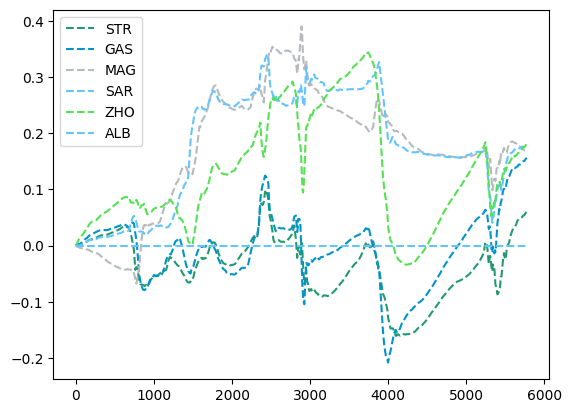

In [150]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Albon was able to pass Hulkenberg, but, unfortunately, his second sector was bad.

In [151]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-1.097,-0.493,-0.502,-0.102,VER
1,14,-0.709,-0.448,-0.330,0.069,ALO
2,11,-0.660,-0.329,-0.384,0.053,PER
3,16,-0.625,-0.132,-0.518,0.025,LEC
4,81,-0.538,-0.331,-0.235,0.028,PIA
5,55,-0.450,-0.215,-0.310,0.075,SAI
6,4,-0.427,-0.350,-0.085,0.008,NOR
7,77,-0.361,-0.075,-0.243,-0.043,BOT
8,44,-0.302,-0.176,-0.175,0.049,HAM
9,3,-0.236,-0.194,-0.084,0.042,RIC


#### Best sector per driver
In this section we can see the best sector of the session

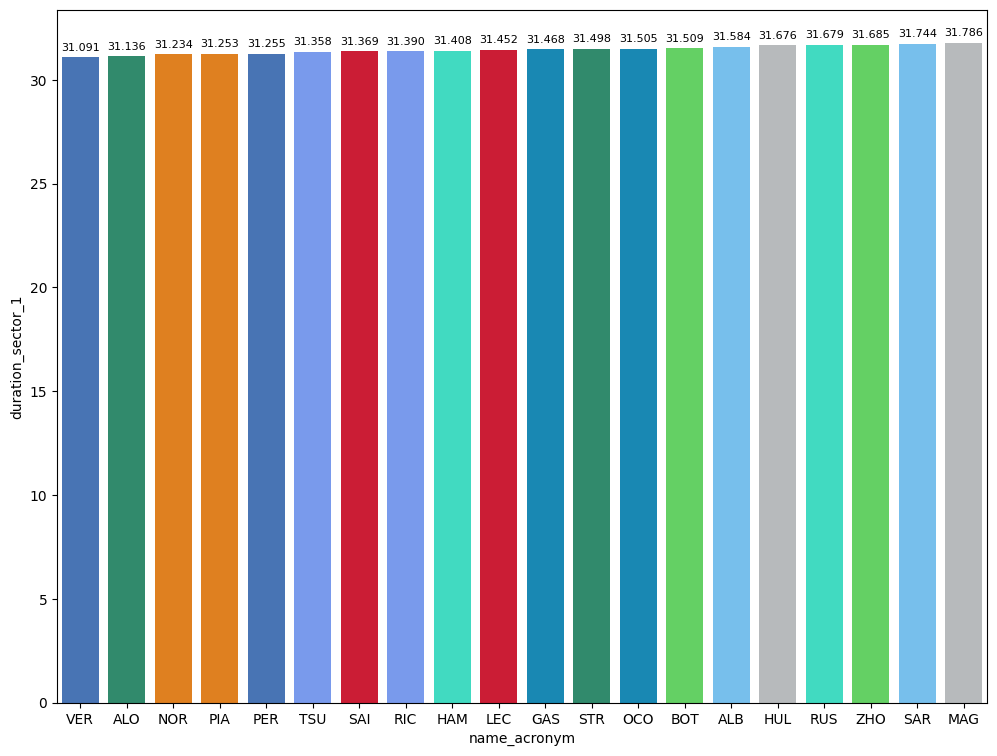

In [152]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

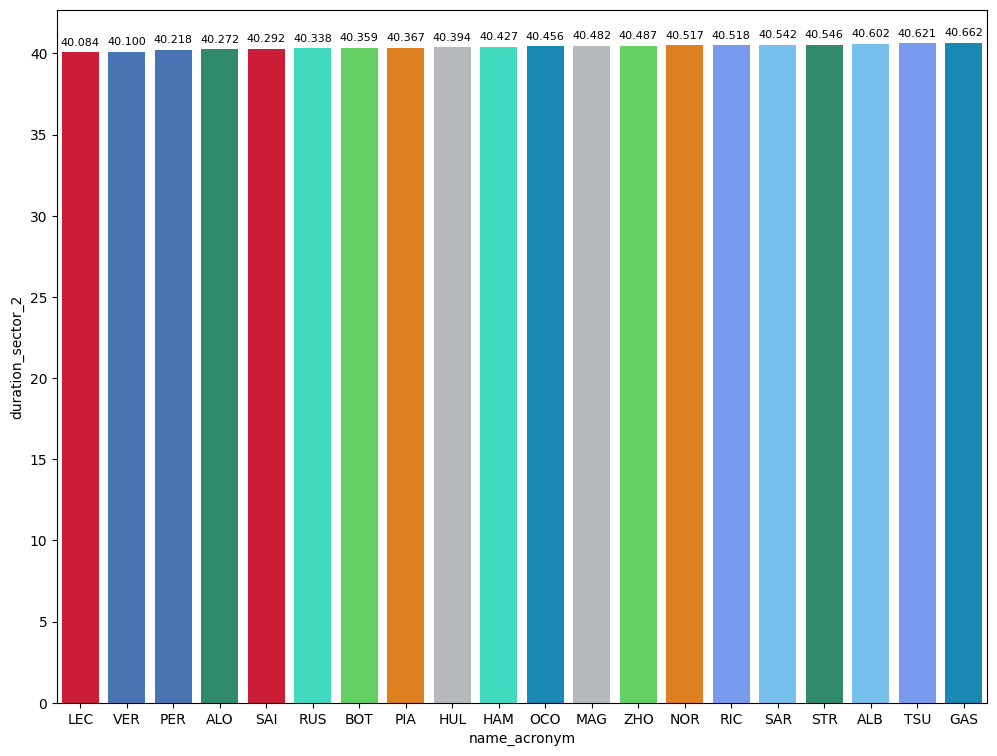

In [153]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

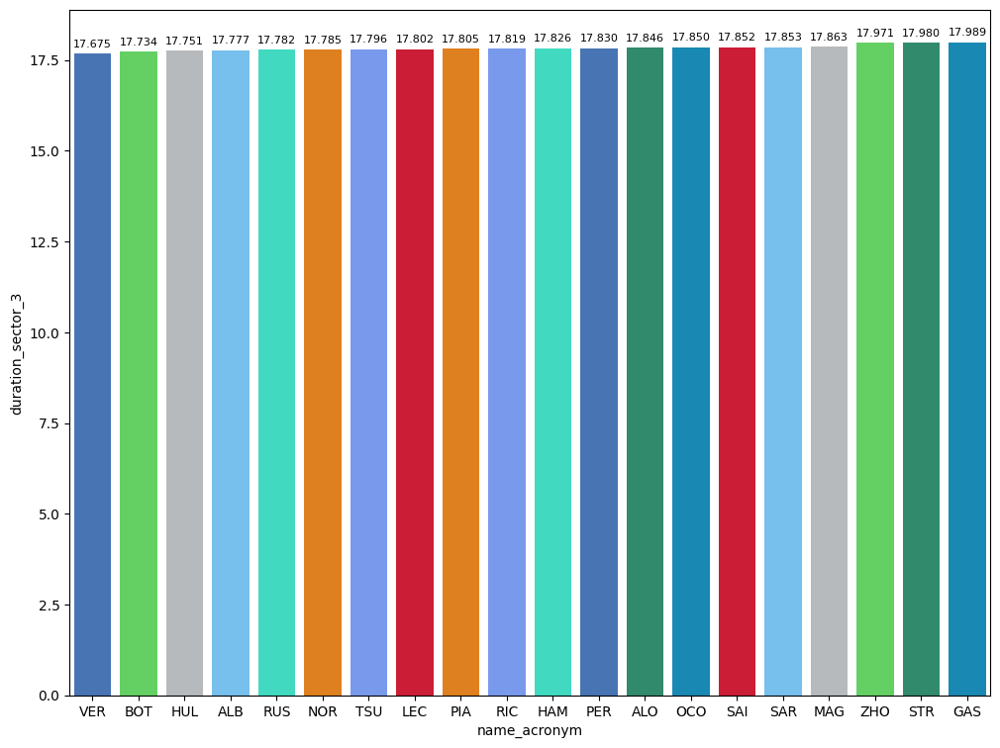

In [154]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
In this session, there were not surprises

In [155]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [156]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Yuki TSUNODA Sector 1:  31.283 Sector 2:  40.423 Sector 3:  17.711


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
RB had a good pace, as we can see in the standings. Tsunoda made it through Q2 and Ricciardo finished P11.

In [157]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,3,0.055,0.069,-0.021,0.007,RIC
1,27,0.077,0.275,-0.185,-0.013,HUL
2,77,0.176,0.074,0.055,0.047,BOT
3,23,0.297,0.334,-0.042,0.005,ALB
4,31,0.399,0.191,0.058,0.150,OCO


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_ti

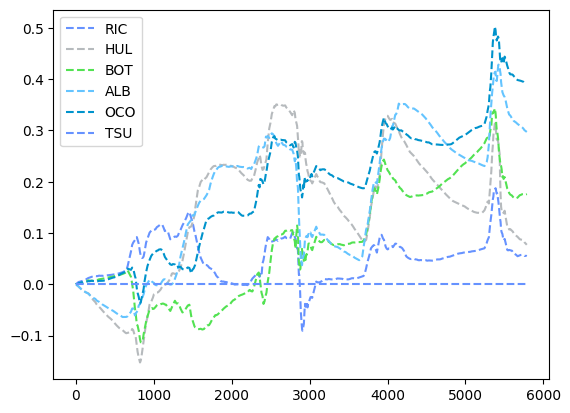

In [158]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
RB had a good pace but it was not enough to fight with the drivers that finished better than their drivers.

In [159]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.677,-0.220,-0.367,-0.090,VER
1,11,-0.665,-0.236,-0.415,-0.014,PER
2,44,-0.530,-0.173,-0.373,0.016,HAM
3,4,-0.477,-0.287,-0.193,0.003,NOR
4,14,-0.335,-0.141,-0.244,0.050,ALO
5,55,-0.318,-0.080,-0.249,0.011,SAI
6,63,-0.277,0.047,-0.331,0.007,RUS
7,81,-0.269,-0.263,-0.152,0.146,PIA
8,16,-0.221,-0.037,-0.330,0.146,LEC


#### Best sector per driver
In this section we can see the best sector of the session

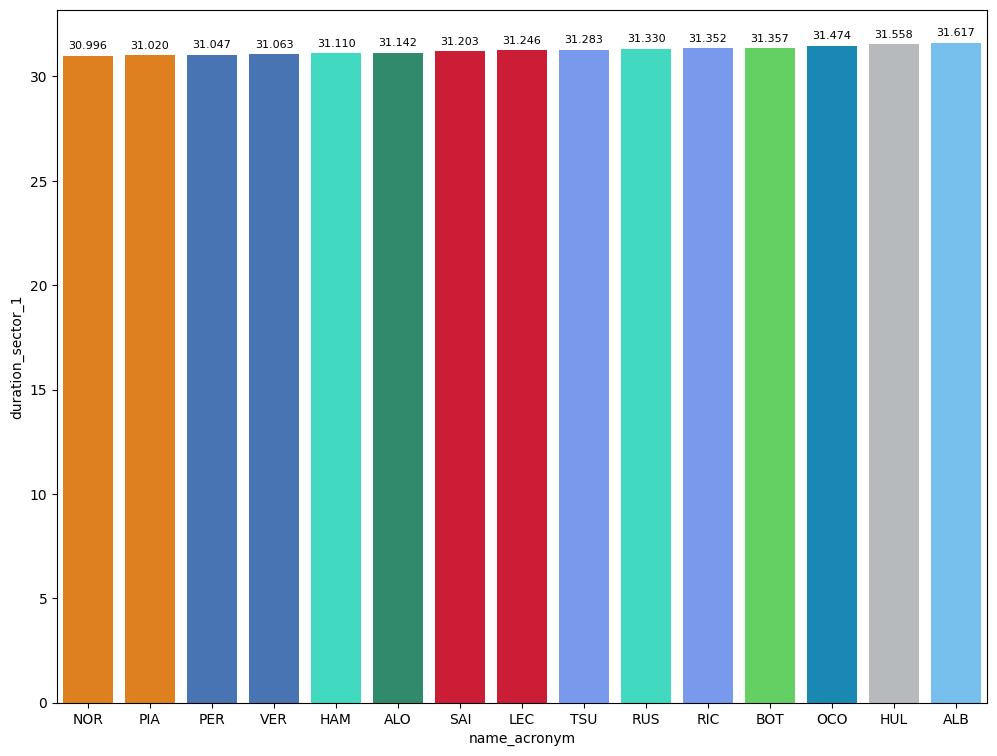

In [160]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

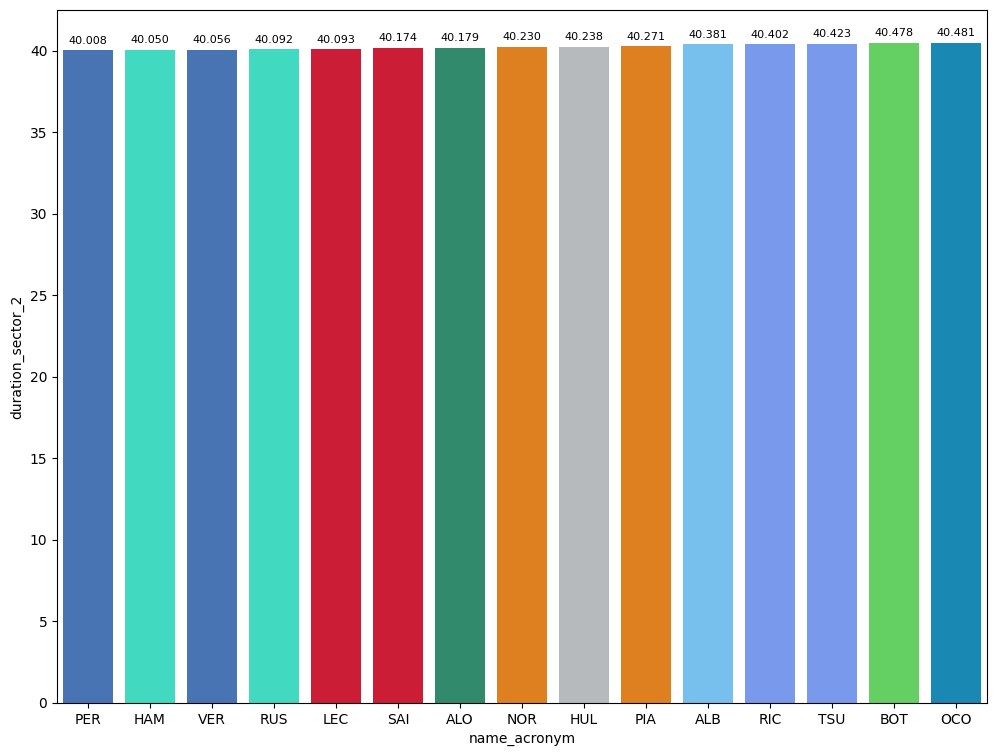

In [161]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

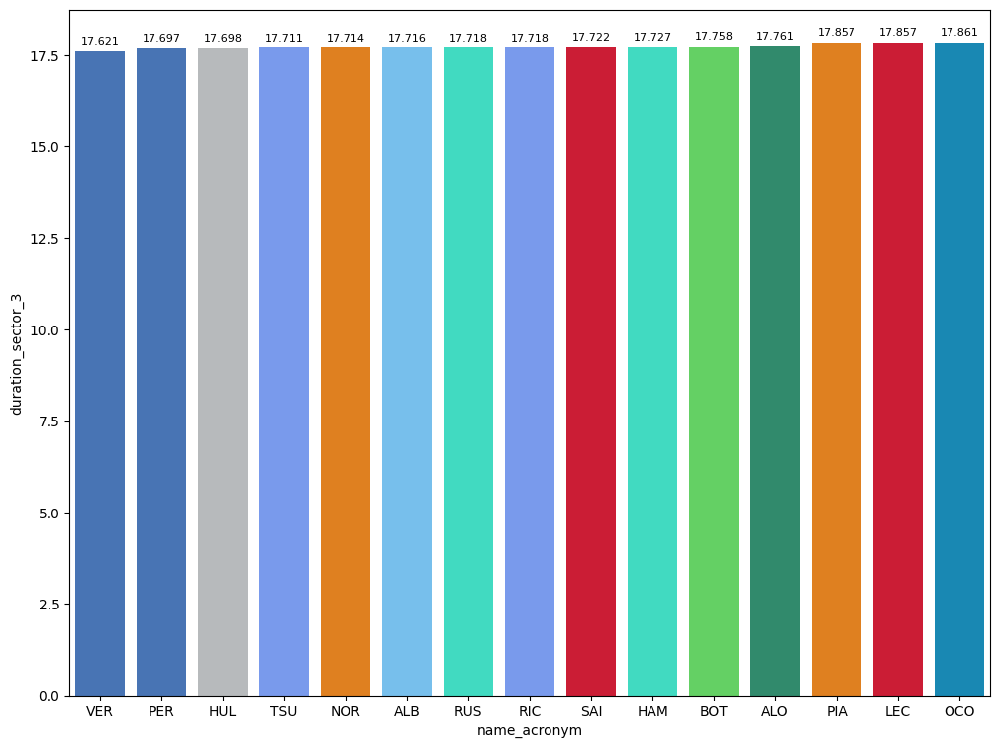

In [162]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [163]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [164]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  30.777 Sector 2:  39.85 Sector 3:  17.57


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Red Bull was dominant in Japan as we can see in qualyfing. After finishing the second sector, Perez had a better laptime than Verstappen but a better sector from the Dutch driver afford to him to take the pole.

In [165]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,11,0.066,0.069,-0.087,0.084,PER
1,4,0.292,0.023,0.189,0.080,NOR
2,55,0.485,0.191,0.139,0.155,SAI
3,14,0.489,0.187,0.177,0.125,ALO
4,81,0.563,0.060,0.377,0.126,PIA
5,44,0.569,0.138,0.306,0.125,HAM
6,16,0.589,0.332,0.016,0.241,LEC
7,63,0.811,0.404,0.273,0.134,RUS
8,22,1.216,0.541,0.398,0.277,TSU


#### Best sector per driver
In this section we can see the best sector of the session

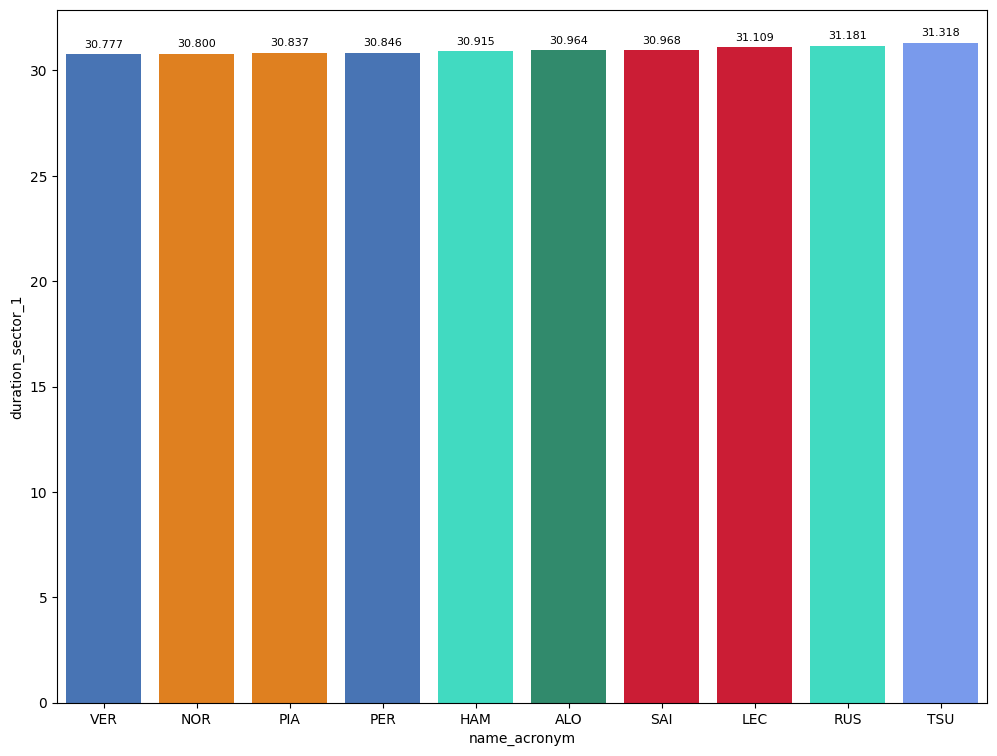

In [166]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

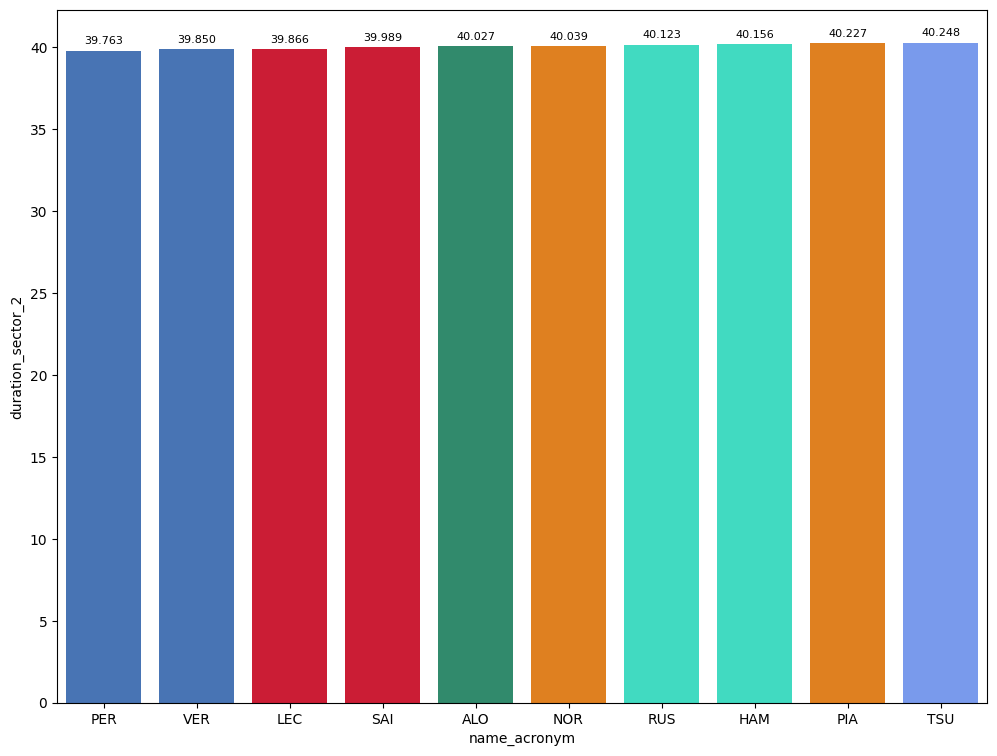

In [167]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

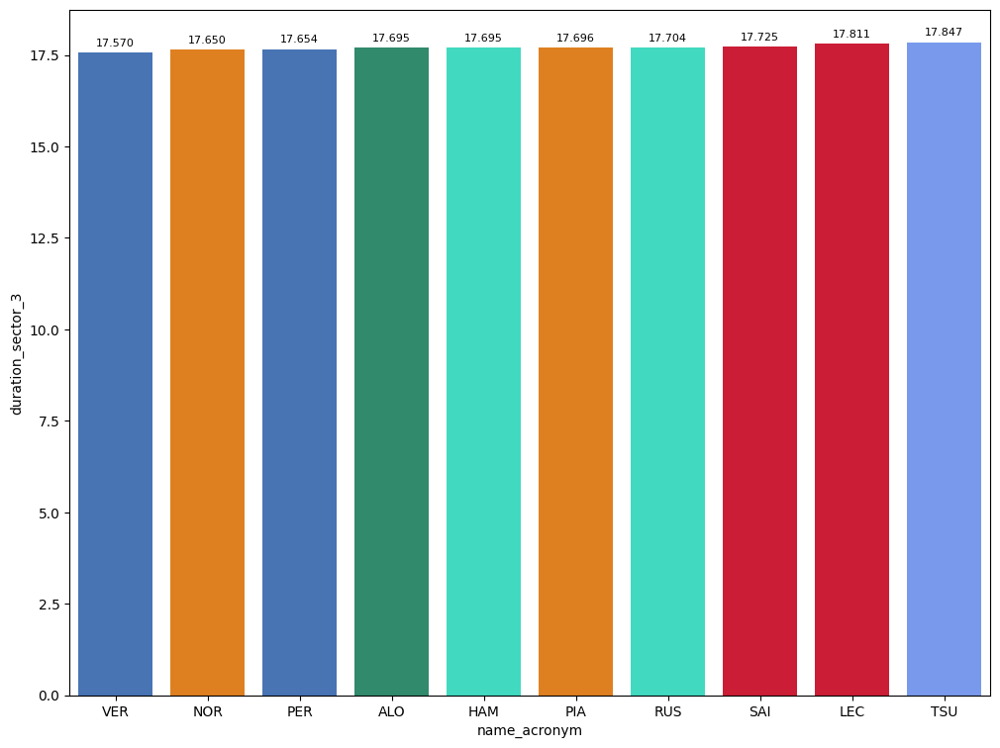

In [168]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

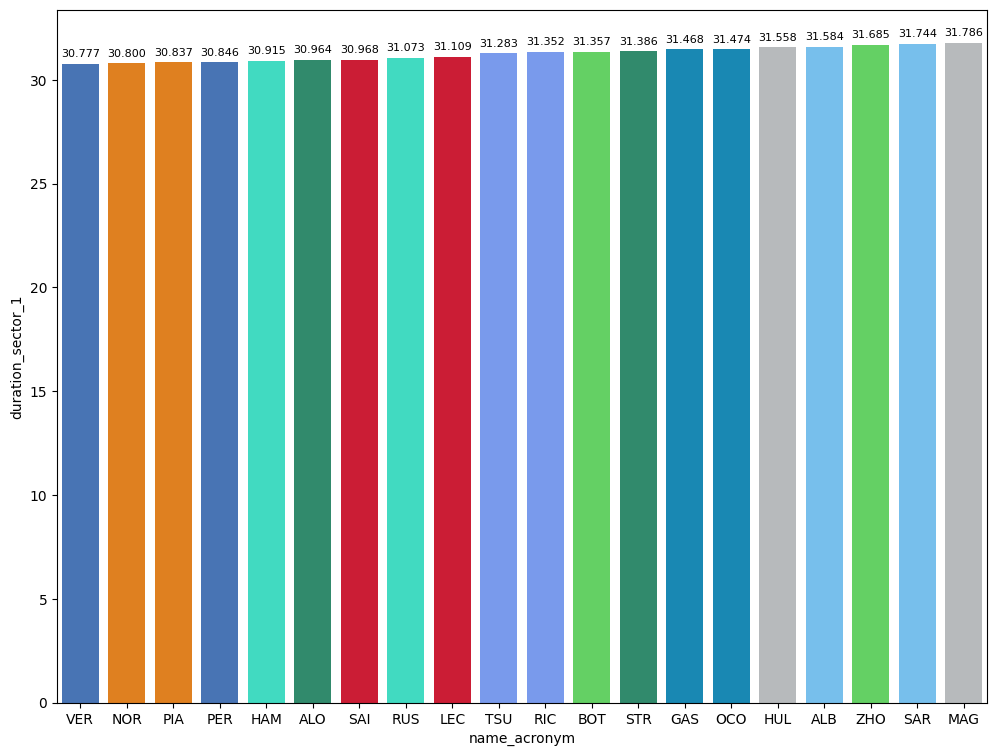

In [169]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

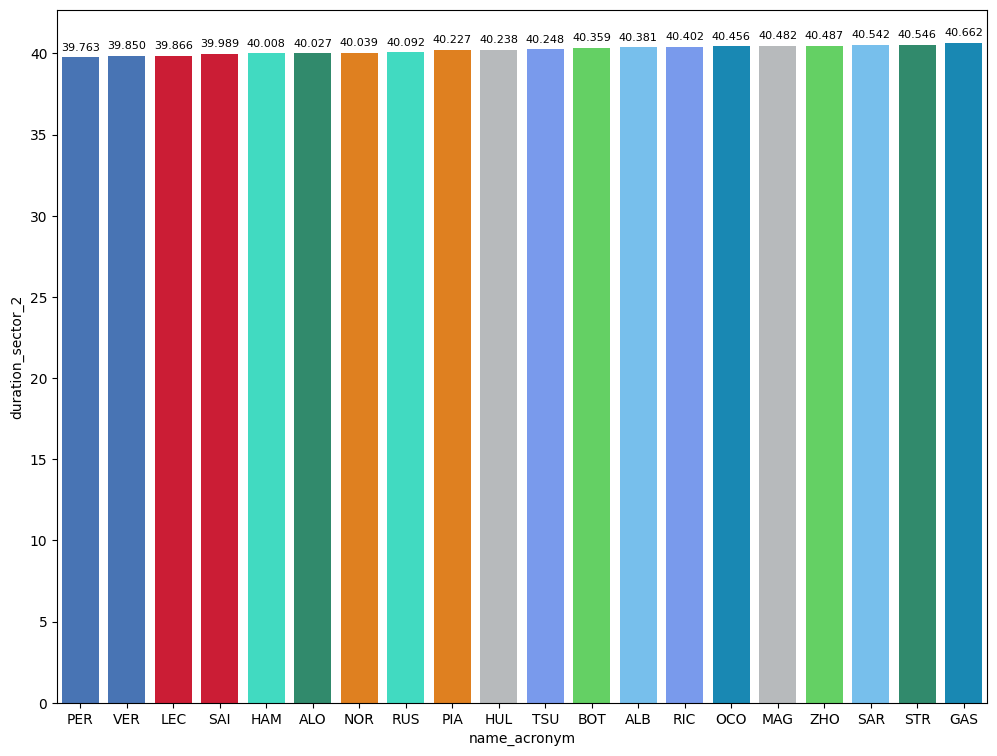

In [170]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

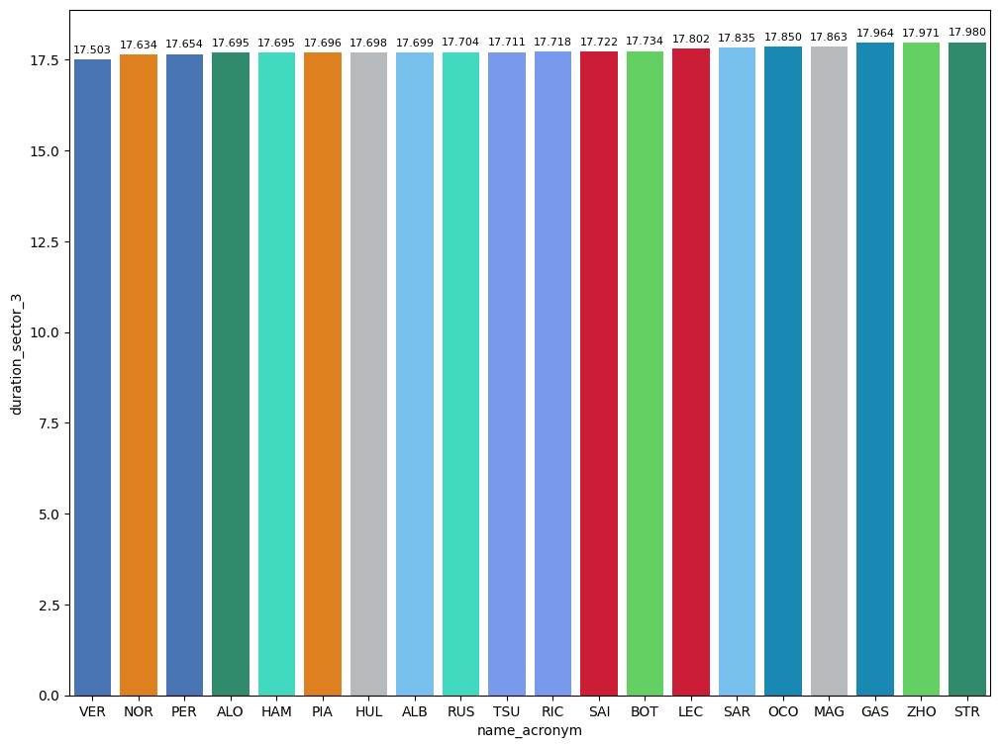

In [171]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

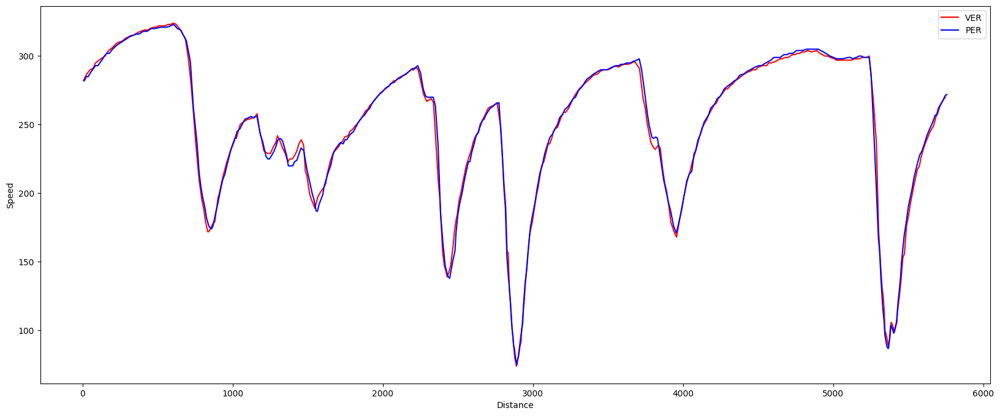

In [172]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

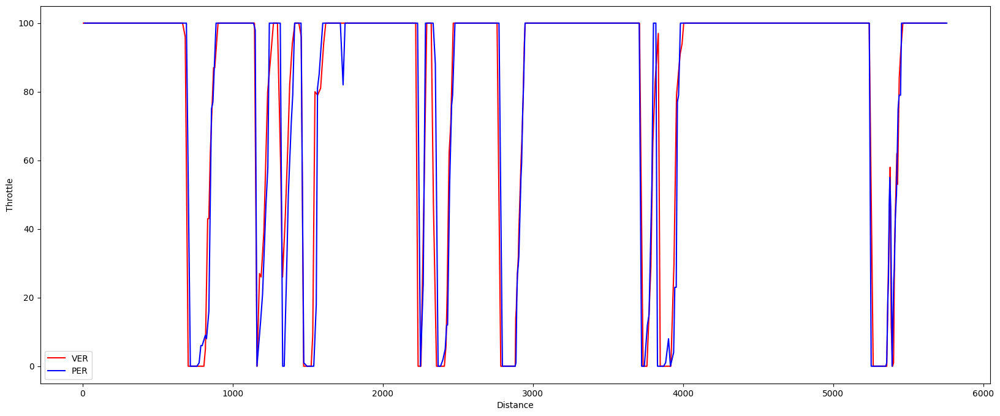

In [173]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

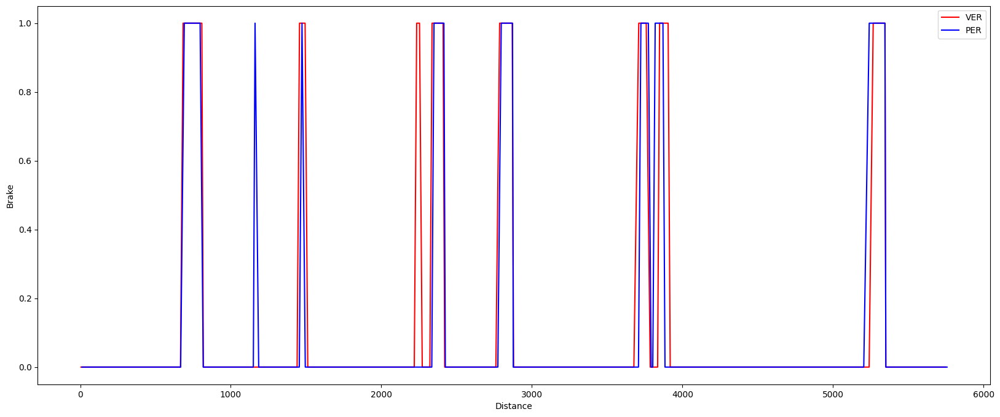

In [174]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

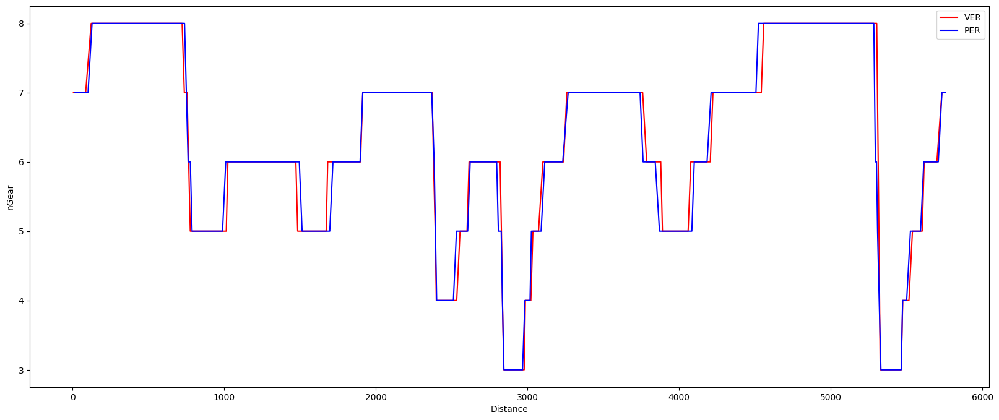

In [175]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [176]:
race = libraryDataF1.obtain_information('laps',session_key=9496)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9496)
drivers = libraryDataF1.obtain_information('drivers',session_key=9496)
libraryDataF1.obtain_drivers_colours(drivers)

In [177]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [178]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [179]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
HARD,97.499029
MEDIUM,97.619336
SOFT,97.985542


### Speed trap

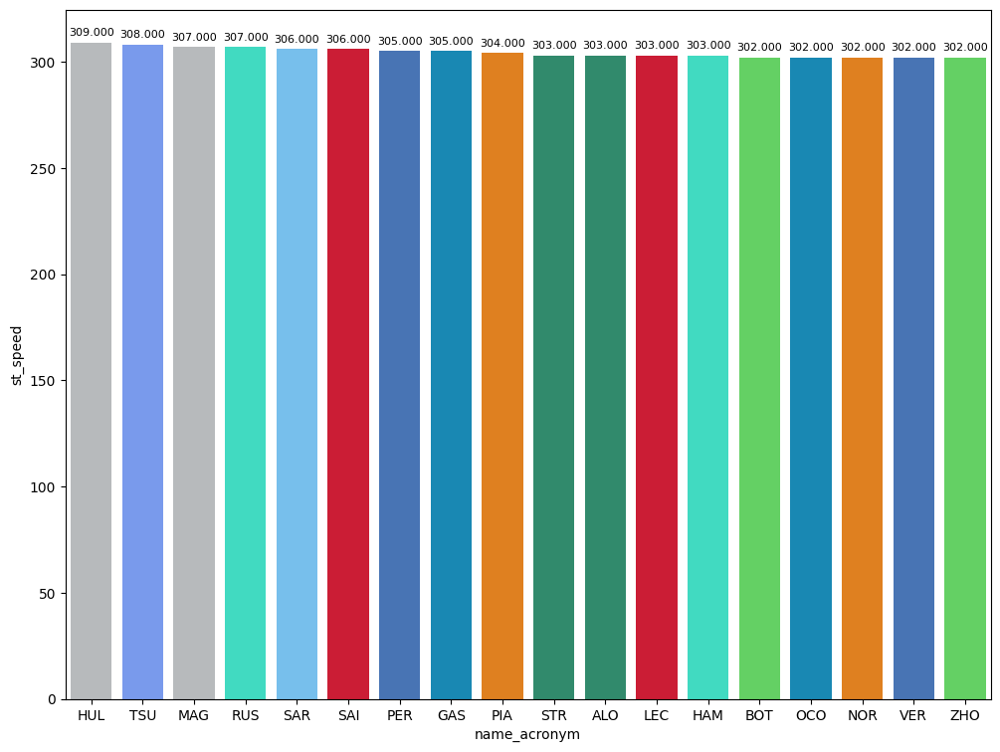

In [180]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

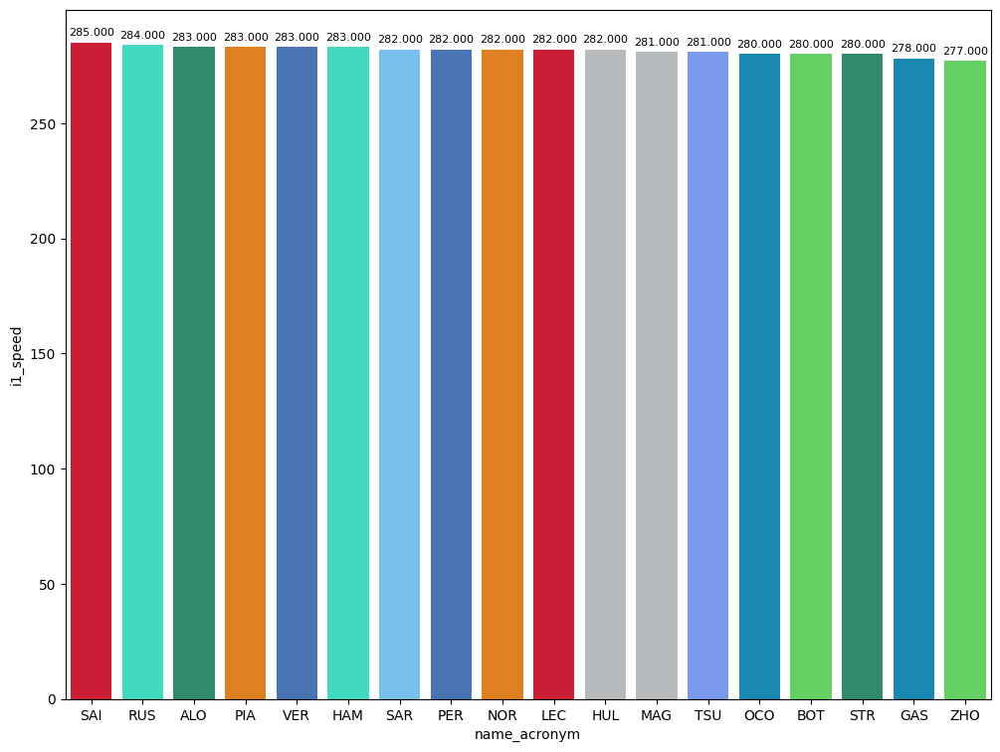

In [181]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

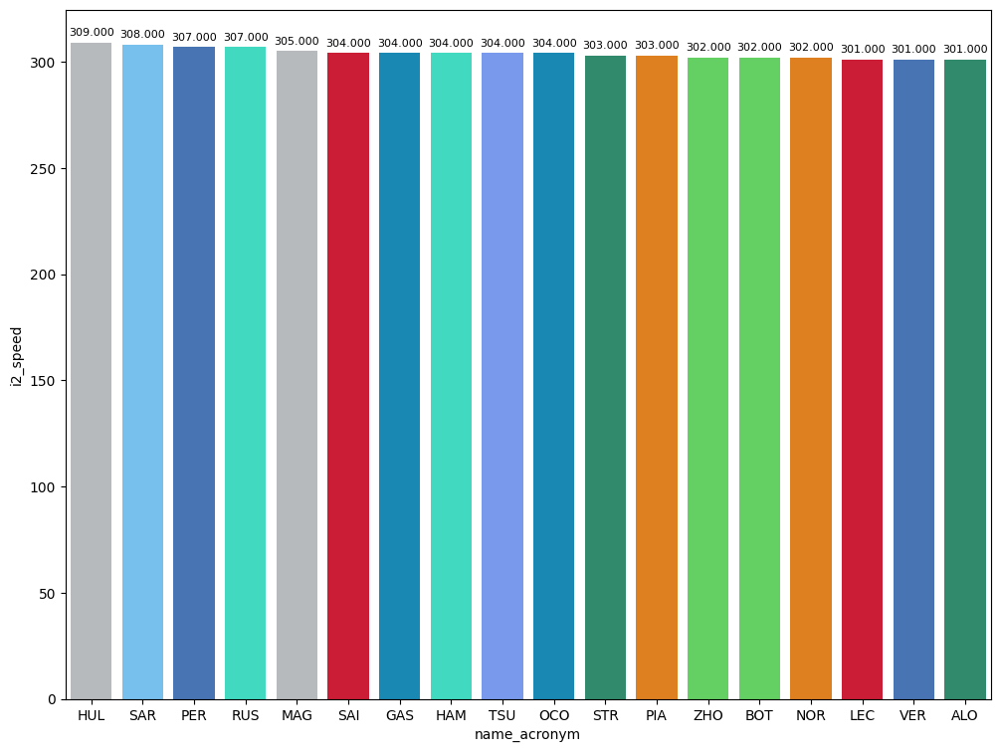

In [182]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [183]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Red Bull Racing,96.361966
Ferrari,96.791663
McLaren,96.849762
Mercedes,97.137127
Aston Martin,97.378122
Williams,98.119500
Haas F1 Team,98.378347
RB,98.442000
Kick Sauber,98.565289


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1
General explanation

In [184]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Red Bull Racing,34.669864
McLaren,34.910889
Ferrari,34.974964
Mercedes,35.072873
Aston Martin,35.192595
Williams,35.446312
Kick Sauber,35.585422
RB,35.643964
Haas F1 Team,35.840907


#### Sector 2
General explanation

In [185]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Red Bull Racing,43.015441
Ferrari,43.150855
McLaren,43.221302
Aston Martin,43.281311
Mercedes,43.299451
Williams,43.708750
Haas F1 Team,43.722107
RB,43.763500
Kick Sauber,43.953844


#### Sector 3
General explanation

In [186]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 110").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
Ferrari,18.665843
Red Bull Racing,18.676661
McLaren,18.717571
Mercedes,18.764803
Haas F1 Team,18.815333
Aston Martin,18.904216
Williams,18.964437
Alpine,19.009138
Kick Sauber,19.026022


### Long runs

In [187]:
MINIMUN_SECONDS = 84
MAXIMUM_SECONDS = 110

#### Red Bull Racing

In [188]:
stintInformation.query('driver_number == 1 or driver_number == 11')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1232,9496,1,1,1,1,MEDIUM,0
5,1232,9496,1,11,1,1,MEDIUM,0
28,1232,9496,2,11,2,15,MEDIUM,1
30,1232,9496,2,1,2,16,MEDIUM,1
47,1232,9496,3,11,16,33,MEDIUM,0
50,1232,9496,3,1,17,34,MEDIUM,0
65,1232,9496,4,11,34,54,HARD,0
69,1232,9496,4,1,35,54,HARD,0


In [189]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
36,Max VERSTAPPEN,MEDIUM,2024-04-07T05:37:17.389000+00:00,4,34.772,43.042,18.658,96.472
54,Max VERSTAPPEN,MEDIUM,2024-04-07T05:38:53.792000+00:00,5,34.690,43.035,18.712,96.437
72,Max VERSTAPPEN,MEDIUM,2024-04-07T05:40:30.215000+00:00,6,34.965,43.196,18.694,96.855
89,Max VERSTAPPEN,MEDIUM,2024-04-07T05:42:07.118000+00:00,7,34.987,43.300,18.683,96.970
106,Max VERSTAPPEN,MEDIUM,2024-04-07T05:43:44.080000+00:00,8,35.112,43.412,18.805,97.329
122,Max VERSTAPPEN,MEDIUM,2024-04-07T05:45:21.406000+00:00,9,35.132,43.298,18.748,97.178
140,Max VERSTAPPEN,MEDIUM,2024-04-07T05:46:58.590000+00:00,10,35.450,43.353,18.787,97.590
158,Max VERSTAPPEN,MEDIUM,2024-04-07T05:48:36.141000+00:00,11,35.320,43.622,18.832,97.774
176,Max VERSTAPPEN,MEDIUM,2024-04-07T05:50:13.928000+00:00,12,35.415,43.468,18.870,97.753
192,Max VERSTAPPEN,MEDIUM,2024-04-07T05:51:51.589000+00:00,13,35.365,43.511,18.851,97.727


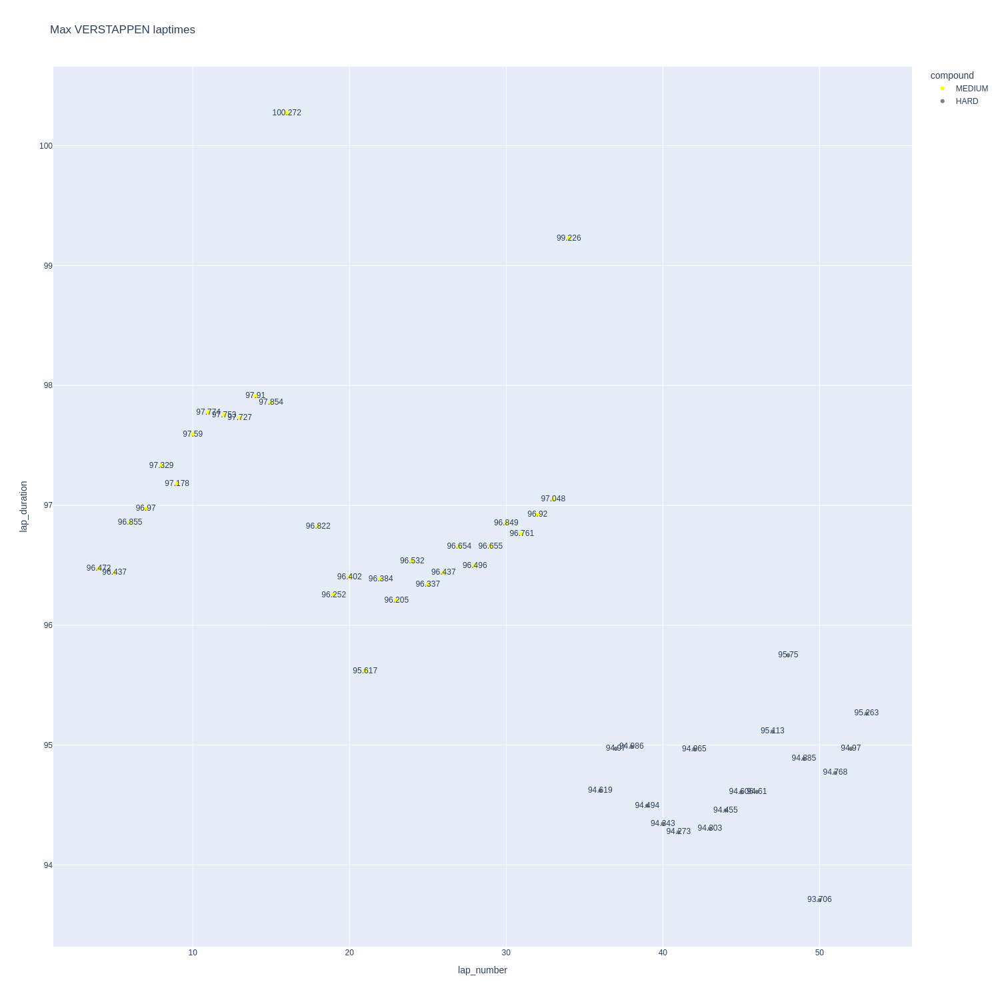

In [190]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

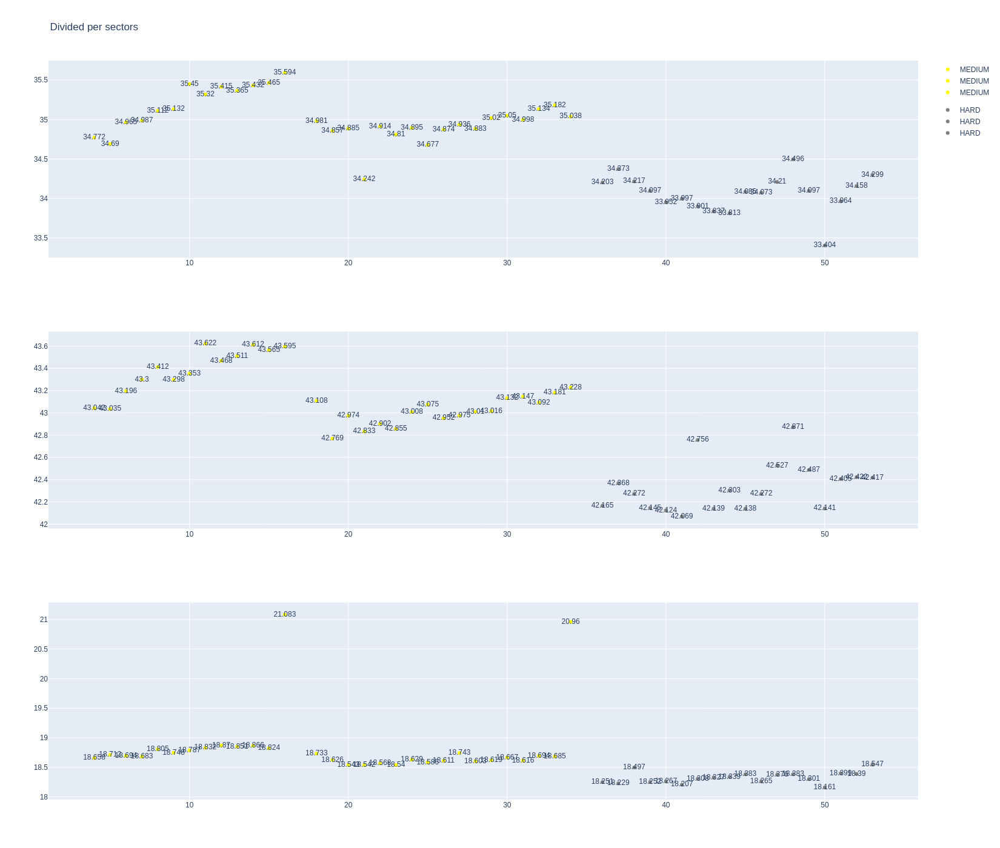

In [191]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [192]:
data = libraryDataF1.getinfolongruns(jointables,11,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
40,Sergio PEREZ,MEDIUM,2024-04-07T05:37:18.352000+00:00,4,34.694,43.203,18.676,96.573
58,Sergio PEREZ,MEDIUM,2024-04-07T05:38:54.878000+00:00,5,34.558,43.311,18.699,96.568
76,Sergio PEREZ,MEDIUM,2024-04-07T05:40:31.368000+00:00,6,35.008,43.981,18.704,97.693
93,Sergio PEREZ,MEDIUM,2024-04-07T05:42:09.146000+00:00,7,35.091,43.396,18.821,97.308
110,Sergio PEREZ,MEDIUM,2024-04-07T05:43:46.373000+00:00,8,35.093,43.381,18.746,97.220
126,Sergio PEREZ,MEDIUM,2024-04-07T05:45:23.666000+00:00,9,35.370,43.600,18.868,97.838
144,Sergio PEREZ,MEDIUM,2024-04-07T05:47:01.438000+00:00,10,35.593,43.554,18.779,97.926
162,Sergio PEREZ,MEDIUM,2024-04-07T05:48:39.380000+00:00,11,35.512,43.802,18.902,98.216
179,Sergio PEREZ,MEDIUM,2024-04-07T05:50:17.644000+00:00,12,35.539,43.770,18.847,98.156
196,Sergio PEREZ,MEDIUM,2024-04-07T05:51:55.786000+00:00,13,35.462,43.857,18.806,98.125


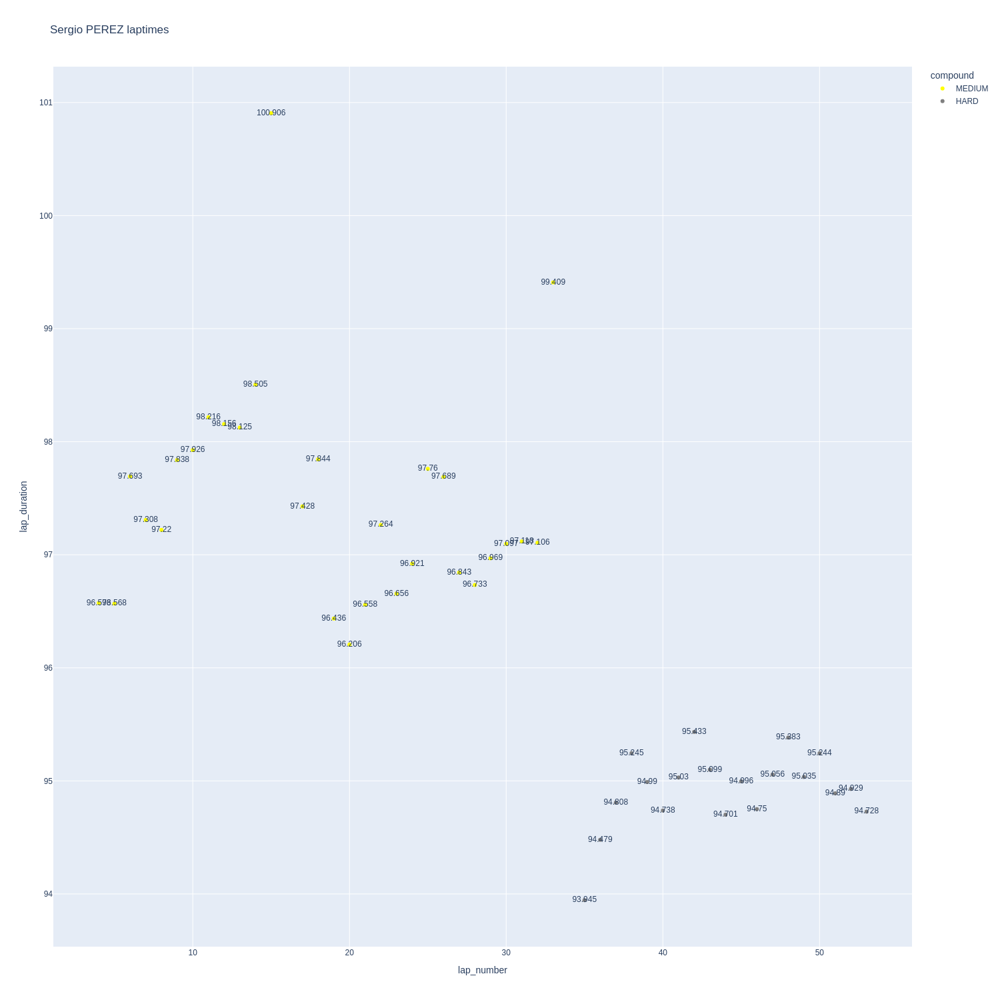

In [193]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

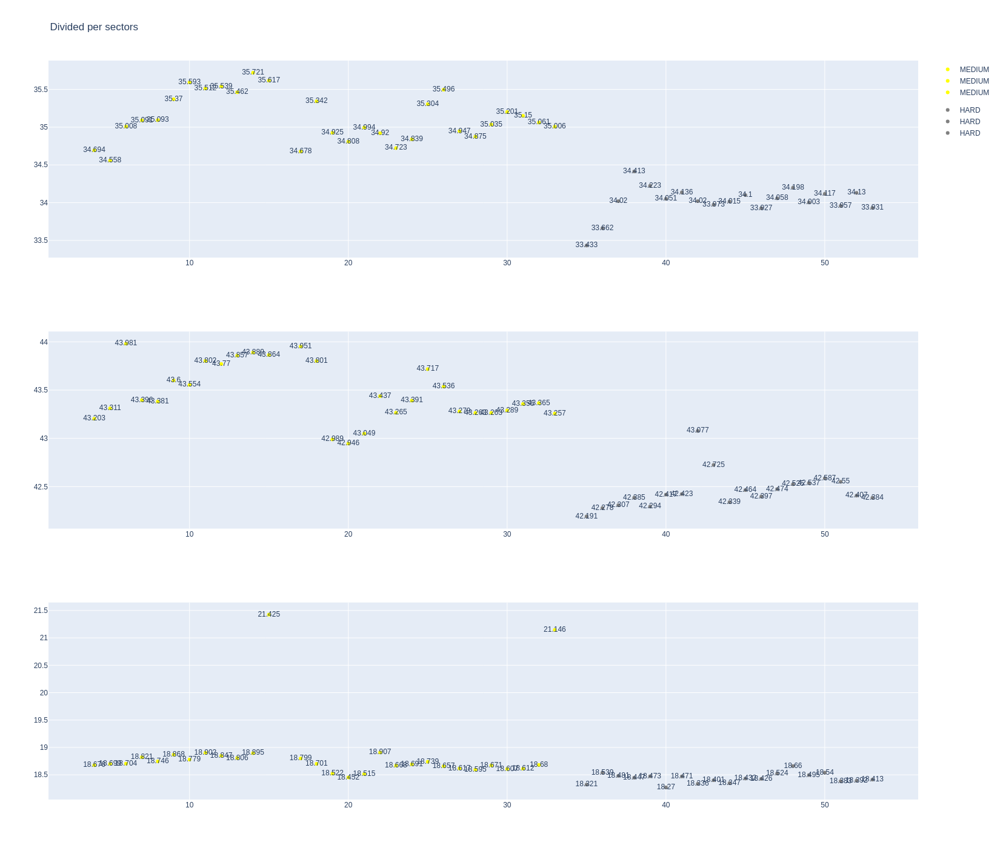

In [194]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [195]:
stintInformation.query('driver_number == 55 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1232,9496,1,16,1,1,MEDIUM,0
16,1232,9496,1,55,1,1,MEDIUM,0
29,1232,9496,2,55,2,15,MEDIUM,0
37,1232,9496,2,16,2,26,MEDIUM,0
48,1232,9496,3,55,16,36,MEDIUM,1
60,1232,9496,3,16,27,54,HARD,0
70,1232,9496,4,55,37,54,HARD,0


In [196]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
42,Charles LECLERC,MEDIUM,2024-04-07T05:37:21.634000+00:00,4,35.805,43.656,18.807,98.268
60,Charles LECLERC,MEDIUM,2024-04-07T05:38:59.995000+00:00,5,35.265,43.755,18.792,97.812
78,Charles LECLERC,MEDIUM,2024-04-07T05:40:37.853000+00:00,6,35.450,43.788,18.783,98.021
95,Charles LECLERC,MEDIUM,2024-04-07T05:42:15.751000+00:00,7,35.725,43.707,18.755,98.187
112,Charles LECLERC,MEDIUM,2024-04-07T05:43:53.991000+00:00,8,35.499,43.706,18.715,97.920
128,Charles LECLERC,MEDIUM,2024-04-07T05:45:31.968000+00:00,9,35.682,43.768,18.763,98.213
146,Charles LECLERC,MEDIUM,2024-04-07T05:47:10.148000+00:00,10,36.074,44.059,18.901,99.034
164,Charles LECLERC,MEDIUM,2024-04-07T05:48:49.230000+00:00,11,36.228,44.179,18.786,99.193
181,Charles LECLERC,MEDIUM,2024-04-07T05:50:28.338000+00:00,12,35.996,43.969,18.918,98.883
198,Charles LECLERC,MEDIUM,2024-04-07T05:52:07.150000+00:00,13,35.607,43.981,18.891,98.479


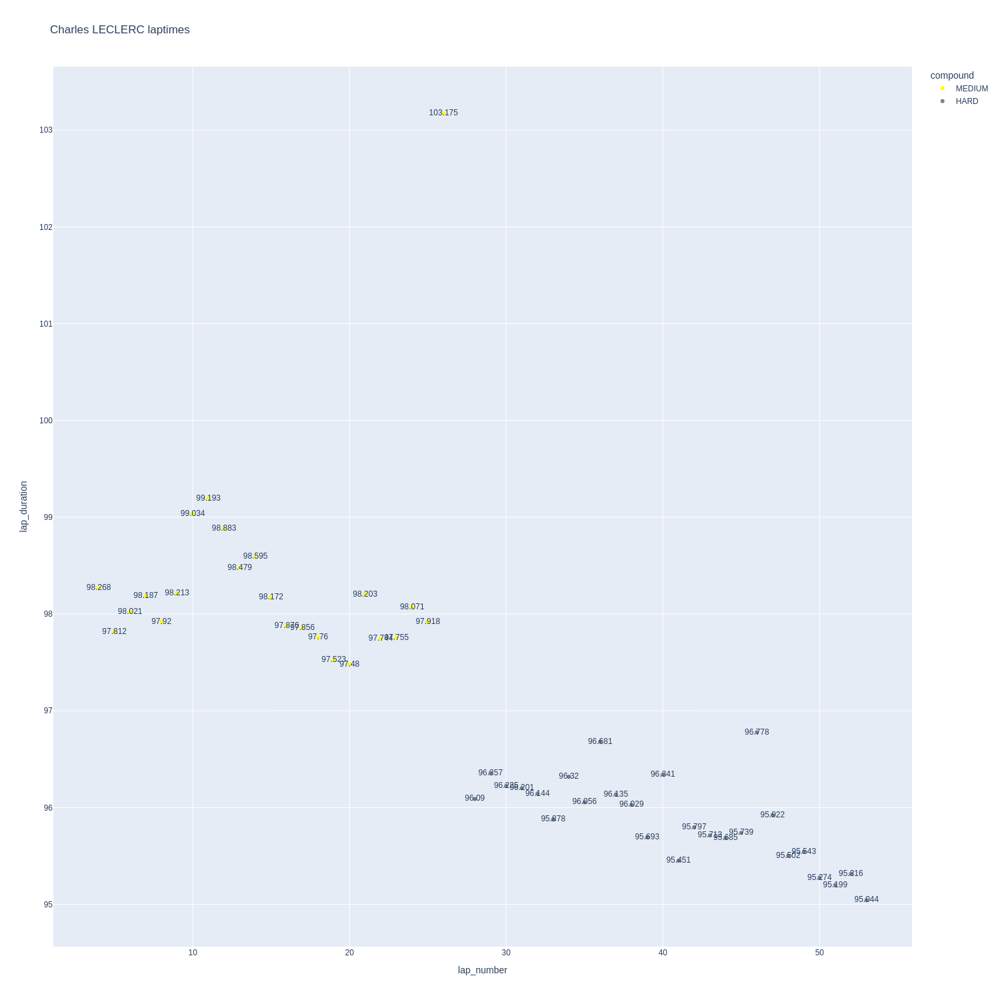

In [197]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

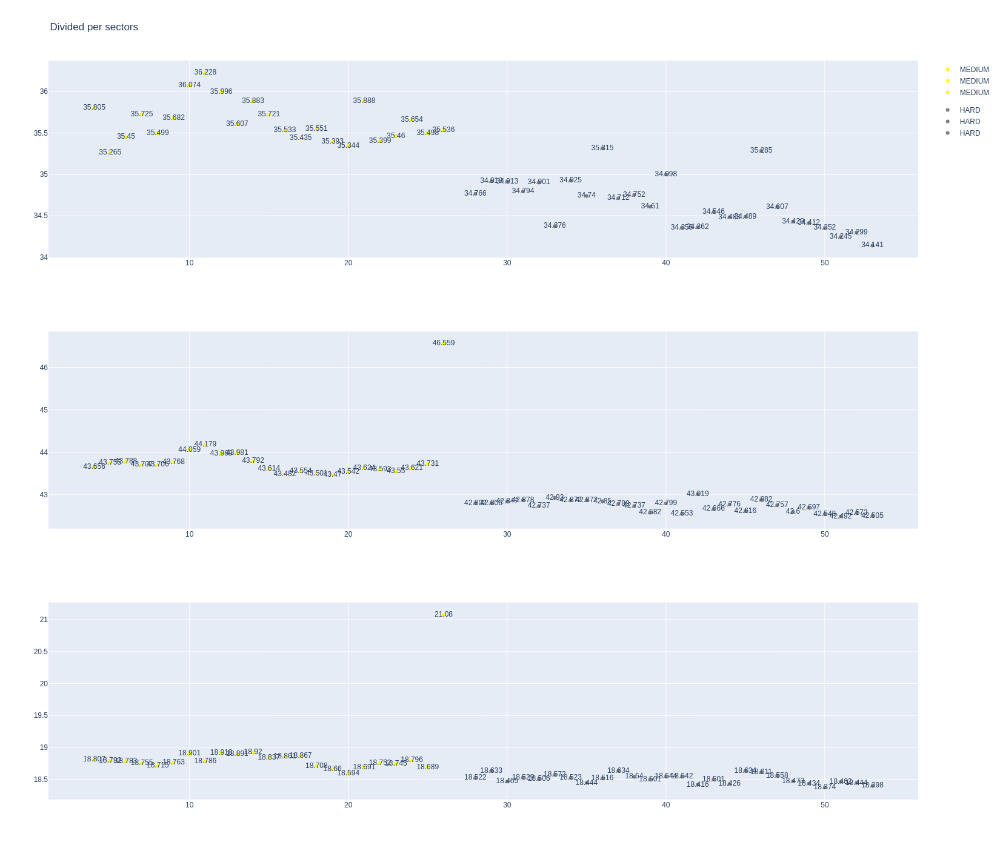

In [198]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [199]:
data = libraryDataF1.getinfolongruns(jointables,55,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
50,Carlos SAINZ,MEDIUM,2024-04-07T05:37:19.728000+00:00,4,35.406,43.259,18.560,97.225
68,Carlos SAINZ,MEDIUM,2024-04-07T05:38:56.881000+00:00,5,35.099,43.533,18.690,97.322
85,Carlos SAINZ,MEDIUM,2024-04-07T05:40:34.198000+00:00,6,35.423,43.562,18.736,97.721
103,Carlos SAINZ,MEDIUM,2024-04-07T05:42:11.947000+00:00,7,35.530,43.673,18.553,97.756
118,Carlos SAINZ,MEDIUM,2024-04-07T05:43:49.734000+00:00,8,35.544,43.610,18.582,97.736
136,Carlos SAINZ,MEDIUM,2024-04-07T05:45:27.406000+00:00,9,35.633,43.626,18.721,97.980
154,Carlos SAINZ,MEDIUM,2024-04-07T05:47:05.503000+00:00,10,35.782,43.746,18.776,98.304
172,Carlos SAINZ,MEDIUM,2024-04-07T05:48:43.773000+00:00,11,35.648,43.930,18.695,98.273
188,Carlos SAINZ,MEDIUM,2024-04-07T05:50:21.944000+00:00,12,35.511,43.617,18.719,97.847
204,Carlos SAINZ,MEDIUM,2024-04-07T05:51:59.789000+00:00,13,35.776,43.833,18.724,98.333


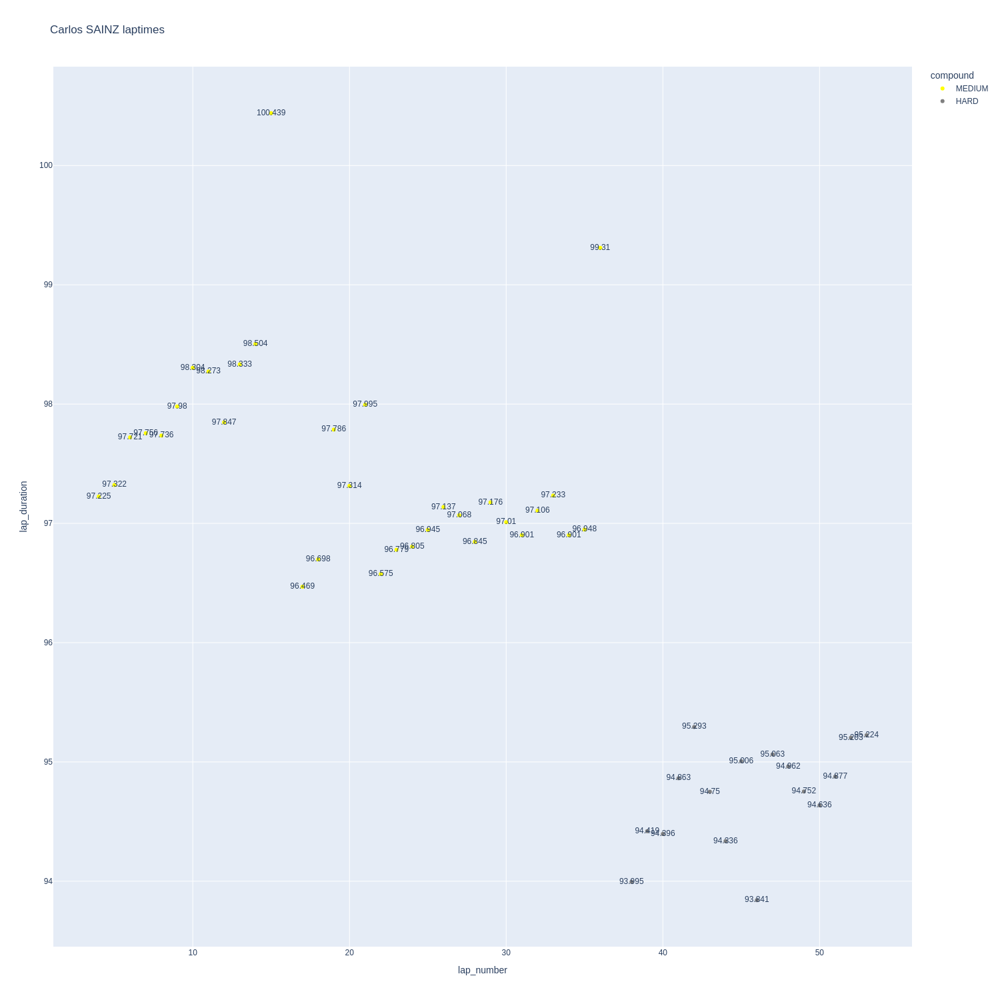

In [200]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

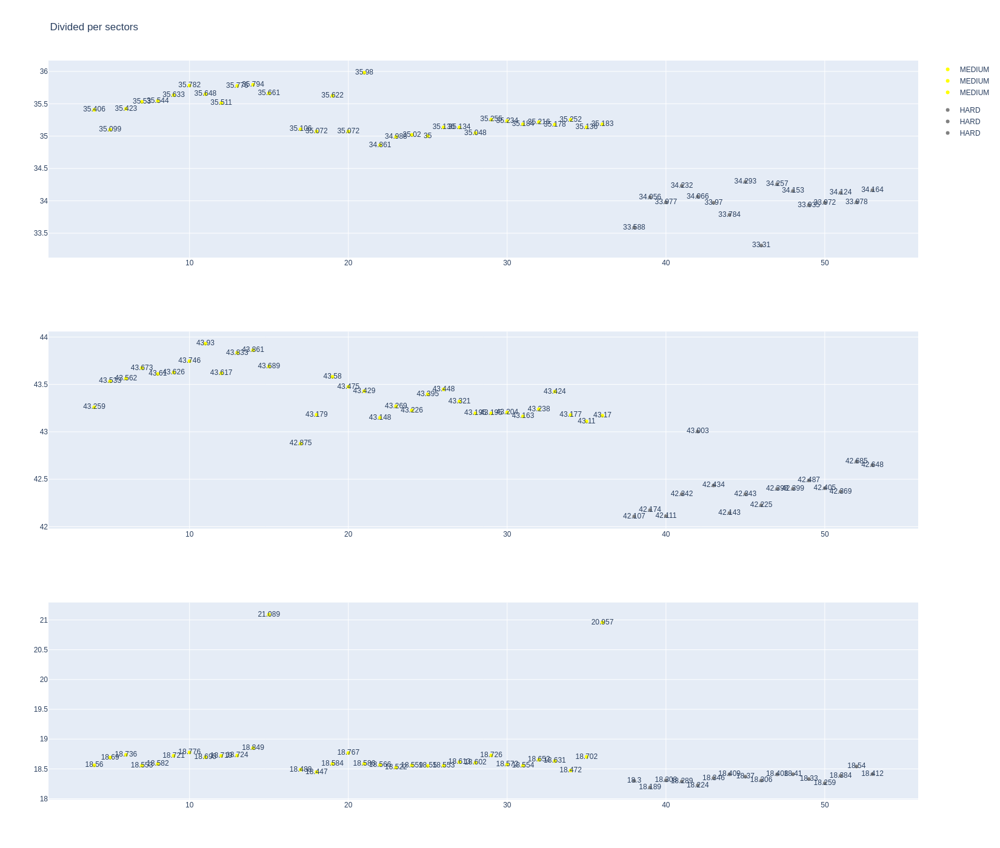

In [201]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [202]:
stintInformation.query('driver_number == 63 or driver_number == 44')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
15,1232,9496,1,44,1,1,MEDIUM,0
17,1232,9496,1,63,1,1,MEDIUM,0
35,1232,9496,2,63,2,22,HARD,0
36,1232,9496,2,44,2,23,HARD,0
54,1232,9496,3,63,23,37,HARD,0
58,1232,9496,3,44,24,39,HARD,0
71,1232,9496,4,63,38,54,MEDIUM,1
72,1232,9496,4,44,40,54,MEDIUM,0


In [203]:
data = libraryDataF1.getinfolongruns(jointables,44,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
49,Lewis HAMILTON,HARD,2024-04-07T05:37:22.282000+00:00,4,35.858,43.823,18.622,98.303
67,Lewis HAMILTON,HARD,2024-04-07T05:39:00.673000+00:00,5,35.536,43.844,18.759,98.139
84,Lewis HAMILTON,HARD,2024-04-07T05:40:38.832000+00:00,6,35.579,43.867,18.744,98.190
102,Lewis HAMILTON,HARD,2024-04-07T05:42:17.025000+00:00,7,35.608,43.999,18.767,98.374
117,Lewis HAMILTON,HARD,2024-04-07T05:43:55.370000+00:00,8,35.574,43.767,18.755,98.096
135,Lewis HAMILTON,HARD,2024-04-07T05:45:33.402000+00:00,9,35.734,43.914,18.885,98.533
153,Lewis HAMILTON,HARD,2024-04-07T05:47:12.064000+00:00,10,35.851,44.070,18.782,98.703
171,Lewis HAMILTON,HARD,2024-04-07T05:48:50.661000+00:00,11,35.838,44.473,18.981,99.292
187,Lewis HAMILTON,HARD,2024-04-07T05:50:29.931000+00:00,12,35.899,44.422,18.881,99.202
203,Lewis HAMILTON,HARD,2024-04-07T05:52:09.127000+00:00,13,35.824,44.247,20.169,100.240


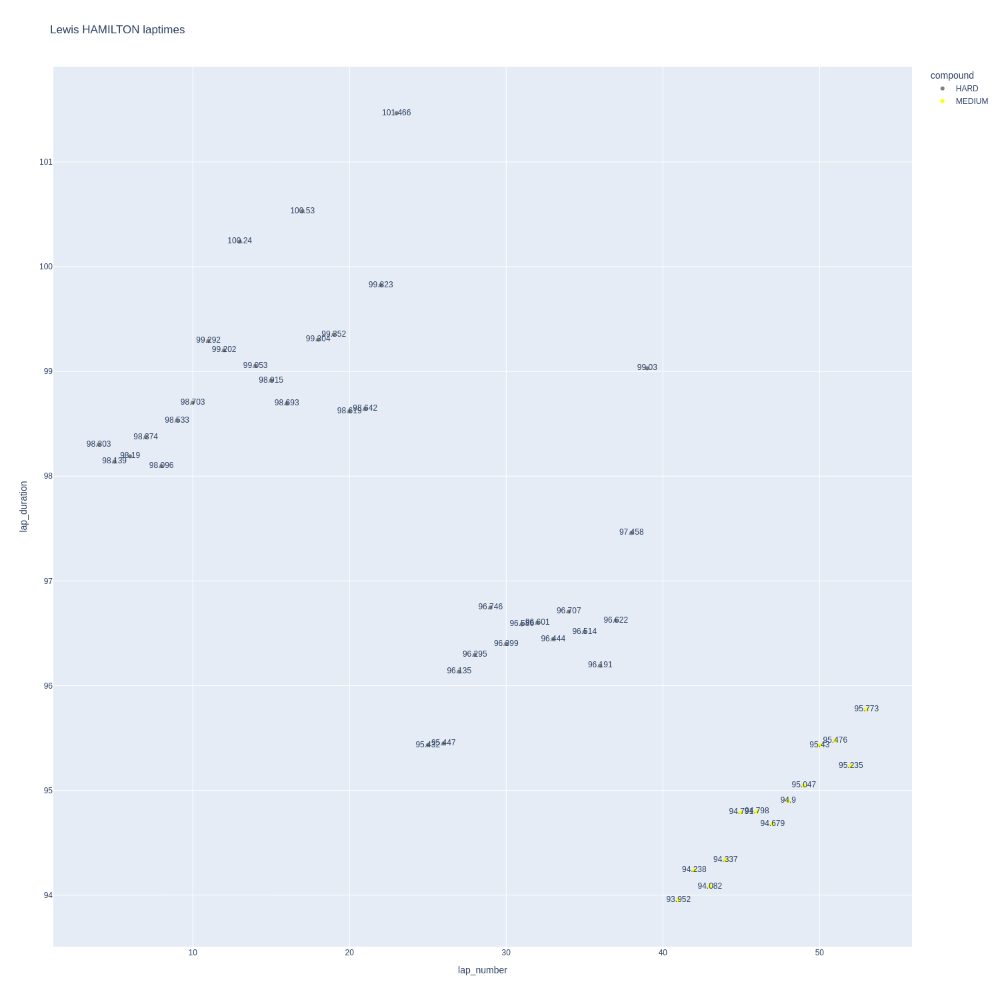

In [204]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

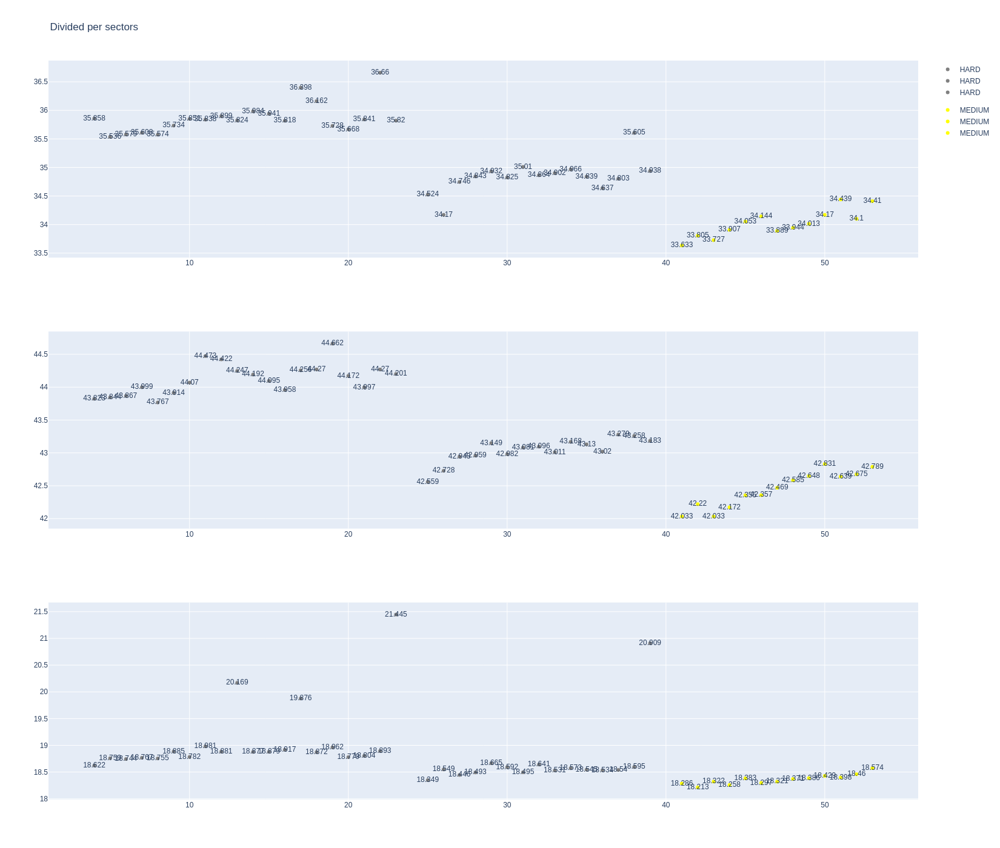

In [205]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [206]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
51,George RUSSELL,HARD,2024-04-07T05:37:23.752000+00:00,4,36.014,43.918,19.044,98.976
69,George RUSSELL,HARD,2024-04-07T05:39:02.723000+00:00,5,35.486,43.610,18.641,97.737
86,George RUSSELL,HARD,2024-04-07T05:40:40.356000+00:00,6,35.689,43.805,18.898,98.392
104,George RUSSELL,HARD,2024-04-07T05:42:18.823000+00:00,7,35.576,43.679,18.815,98.070
119,George RUSSELL,HARD,2024-04-07T05:43:56.825000+00:00,8,35.712,43.769,18.711,98.192
137,George RUSSELL,HARD,2024-04-07T05:45:35.101000+00:00,9,35.718,43.680,18.855,98.253
155,George RUSSELL,HARD,2024-04-07T05:47:13.333000+00:00,10,35.700,43.824,18.844,98.368
173,George RUSSELL,HARD,2024-04-07T05:48:51.717000+00:00,11,35.861,44.209,18.879,98.949
189,George RUSSELL,HARD,2024-04-07T05:50:30.564000+00:00,12,35.925,44.315,18.972,99.212
205,George RUSSELL,HARD,2024-04-07T05:52:09.875000+00:00,13,35.848,44.313,18.828,98.989


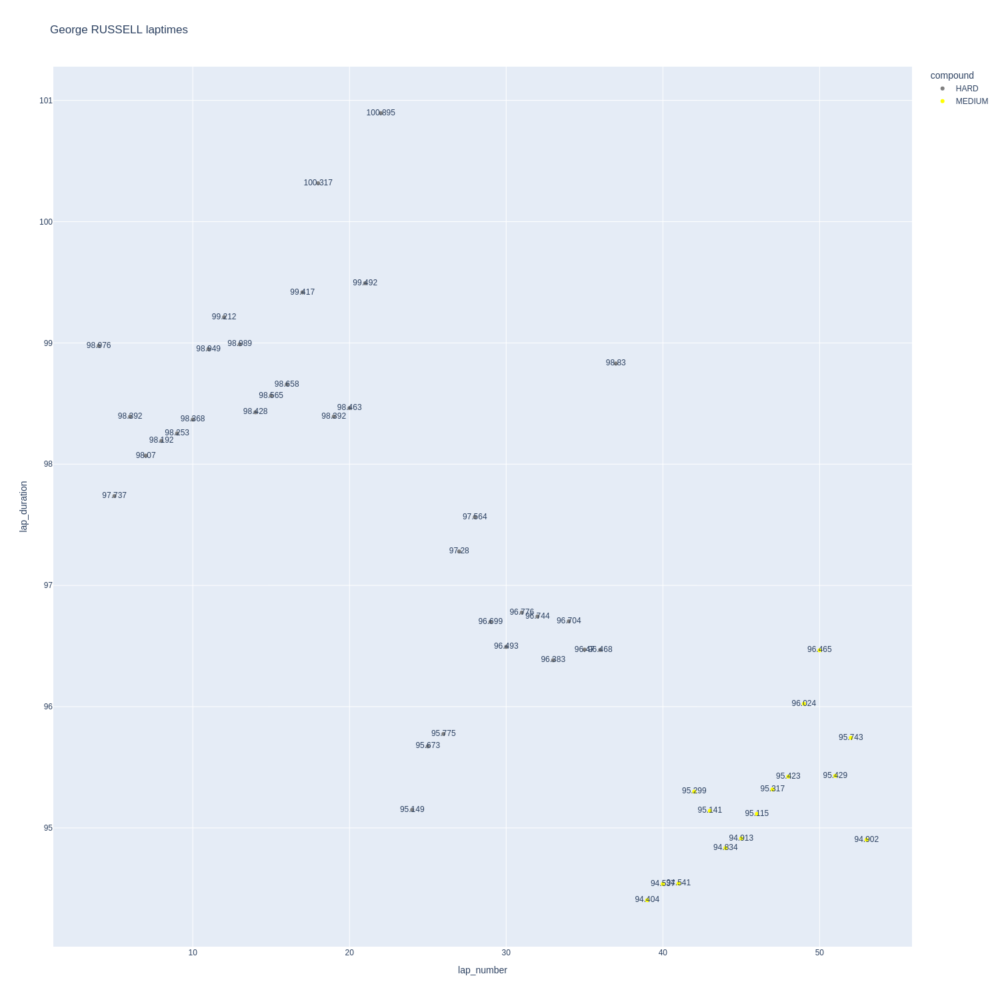

In [207]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

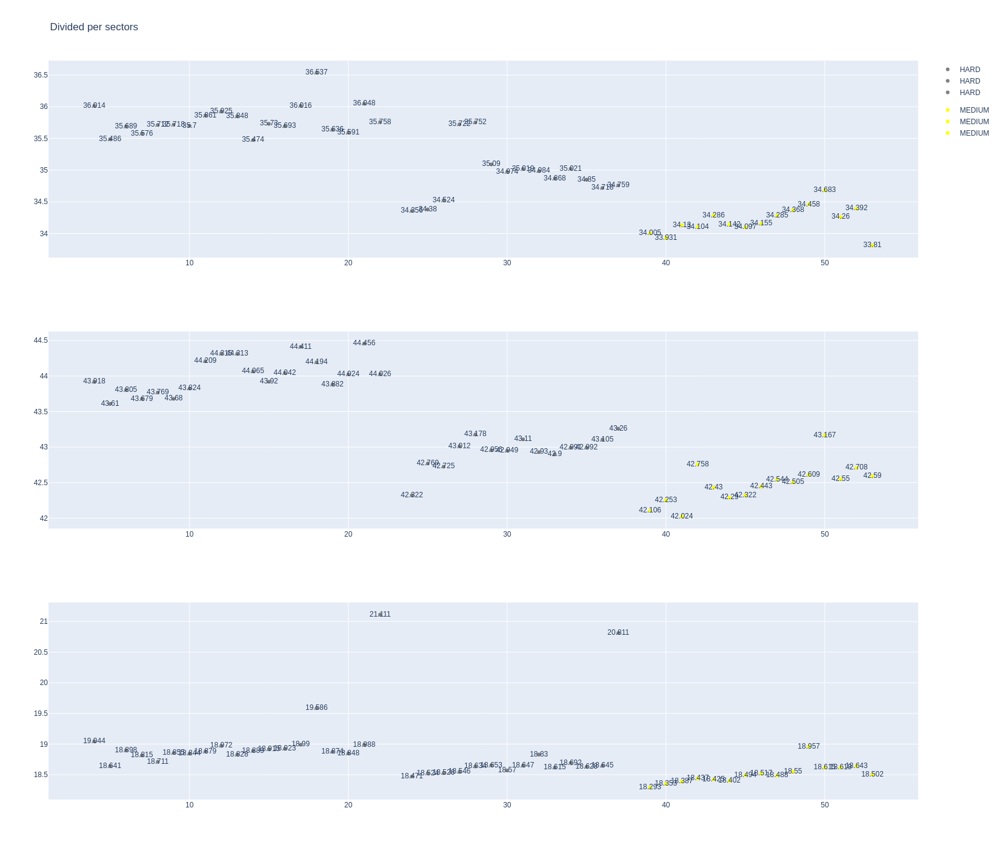

In [208]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [209]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1232,9496,1,4,1,1,MEDIUM,0
19,1232,9496,1,81,1,1,MEDIUM,0
24,1232,9496,2,4,2,11,MEDIUM,0
26,1232,9496,2,81,2,12,MEDIUM,1
43,1232,9496,3,4,12,26,HARD,0
45,1232,9496,3,81,13,32,HARD,0
59,1232,9496,4,4,27,54,HARD,0
62,1232,9496,4,81,33,54,HARD,0


In [210]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
38,Lando NORRIS,MEDIUM,2024-04-07T05:37:19.227000+00:00,4,35.062,43.181,18.610,96.853
56,Lando NORRIS,MEDIUM,2024-04-07T05:38:56.078000+00:00,5,34.856,43.348,18.656,96.860
74,Lando NORRIS,MEDIUM,2024-04-07T05:40:32.911000+00:00,6,35.298,43.753,18.849,97.900
91,Lando NORRIS,MEDIUM,2024-04-07T05:42:10.895000+00:00,7,35.209,43.702,18.831,97.742
108,Lando NORRIS,MEDIUM,2024-04-07T05:43:48.473000+00:00,8,35.208,43.748,18.868,97.824
124,Lando NORRIS,MEDIUM,2024-04-07T05:45:26.353000+00:00,9,35.354,43.680,18.929,97.963
142,Lando NORRIS,MEDIUM,2024-04-07T05:47:04.316000+00:00,10,35.536,43.791,18.831,98.158
160,Lando NORRIS,MEDIUM,2024-04-07T05:48:42.444000+00:00,11,35.613,43.963,21.184,100.760
194,Lando NORRIS,HARD,2024-04-07T05:52:18.891000+00:00,13,34.413,42.732,18.616,95.761
209,Lando NORRIS,HARD,2024-04-07T05:53:54.723000+00:00,14,34.874,43.154,18.749,96.777


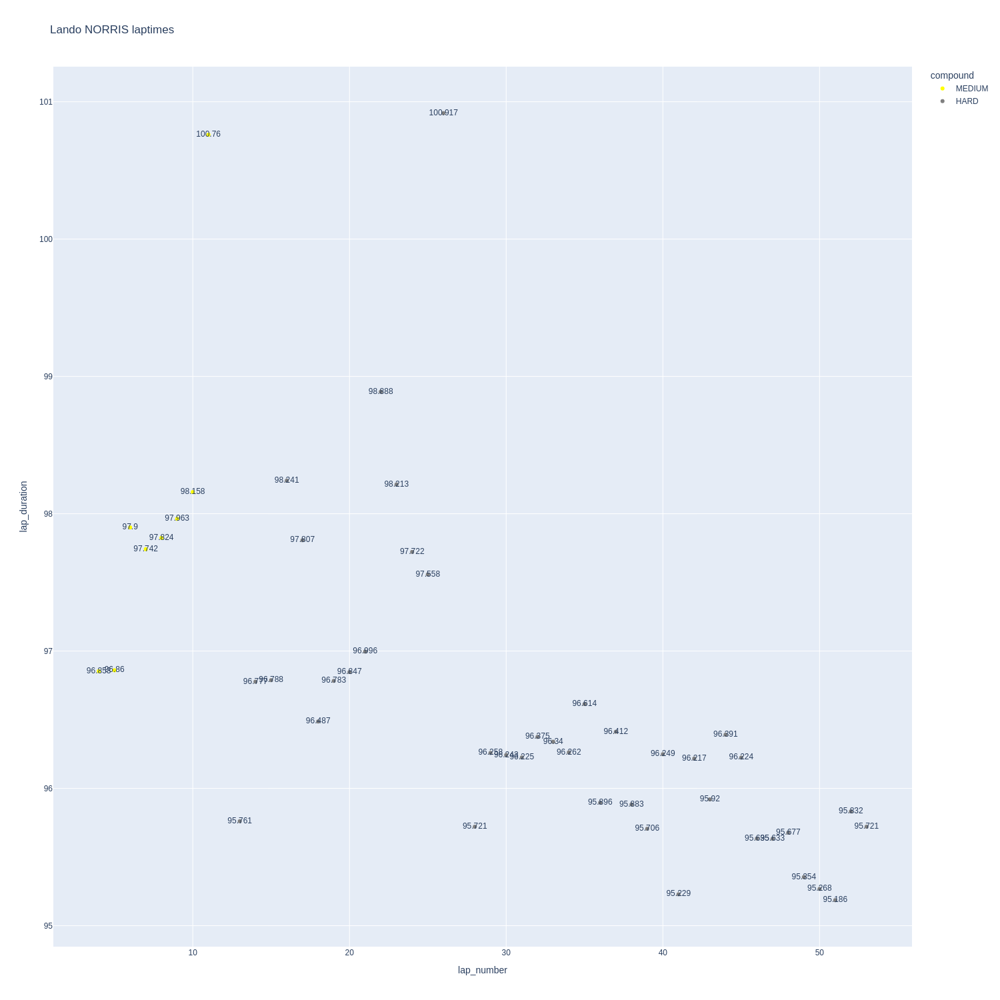

In [211]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

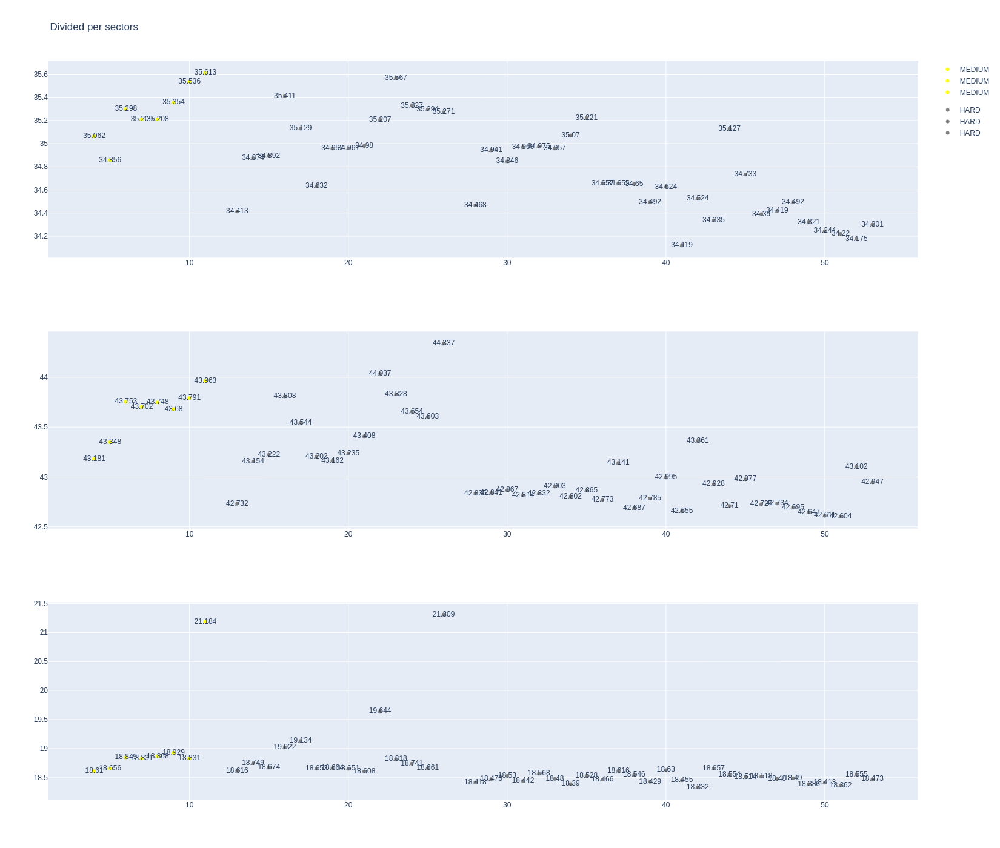

In [212]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [213]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Oscar PIASTRI,MEDIUM,2024-04-07T05:37:21.178000+00:00,4,35.541,43.643,18.550,97.734
71,Oscar PIASTRI,MEDIUM,2024-04-07T05:38:58.859000+00:00,5,35.214,43.757,18.660,97.631
88,Oscar PIASTRI,MEDIUM,2024-04-07T05:40:36.502000+00:00,6,35.443,43.893,18.805,98.141
105,Oscar PIASTRI,MEDIUM,2024-04-07T05:42:14.640000+00:00,7,35.722,43.803,18.666,98.191
121,Oscar PIASTRI,MEDIUM,2024-04-07T05:43:52.790000+00:00,8,35.648,43.759,18.815,98.222
139,Oscar PIASTRI,MEDIUM,2024-04-07T05:45:31.111000+00:00,9,35.870,43.822,18.808,98.500
157,Oscar PIASTRI,MEDIUM,2024-04-07T05:47:09.838000+00:00,10,36.082,44.023,18.906,99.011
175,Oscar PIASTRI,MEDIUM,2024-04-07T05:48:48.594000+00:00,11,36.199,44.168,18.878,99.245
191,Oscar PIASTRI,MEDIUM,2024-04-07T05:50:27.808000+00:00,12,35.769,44.144,21.170,101.083
222,Oscar PIASTRI,HARD,2024-04-07T05:54:07.534000+00:00,14,35.136,43.763,18.776,97.675


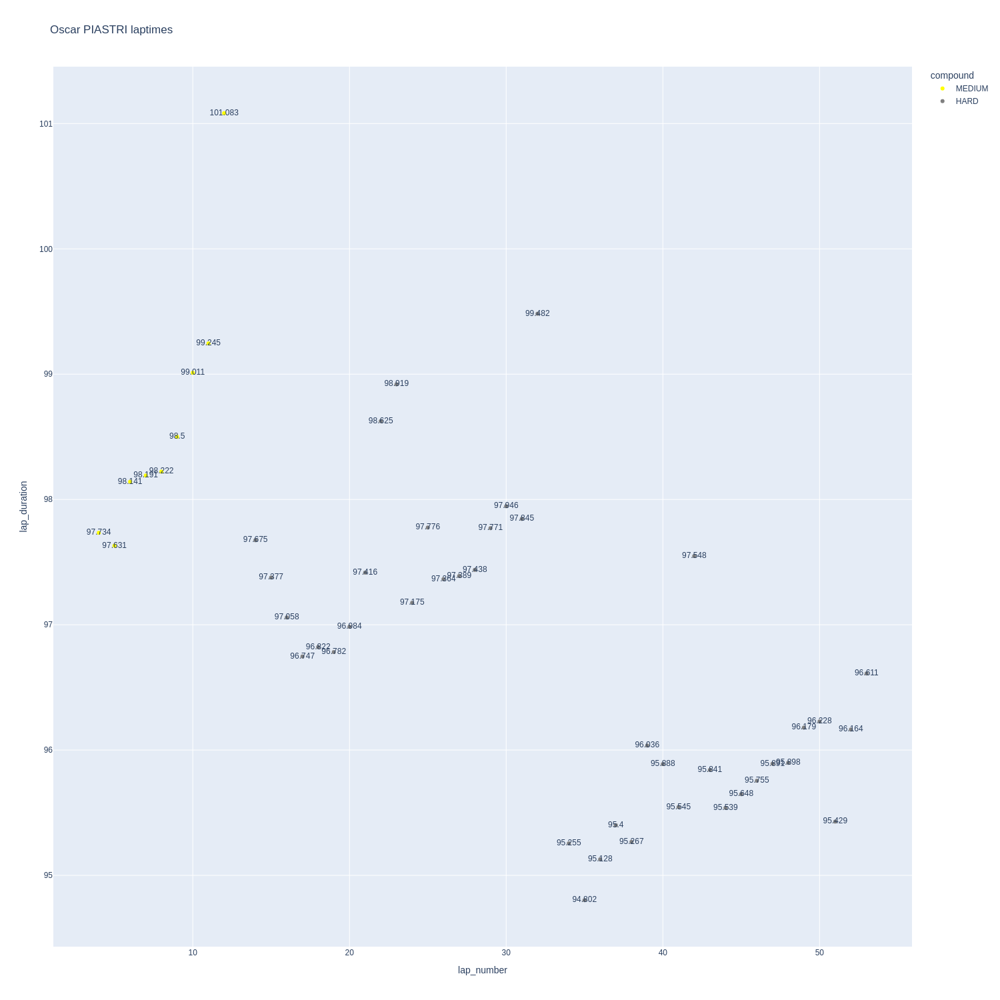

In [214]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

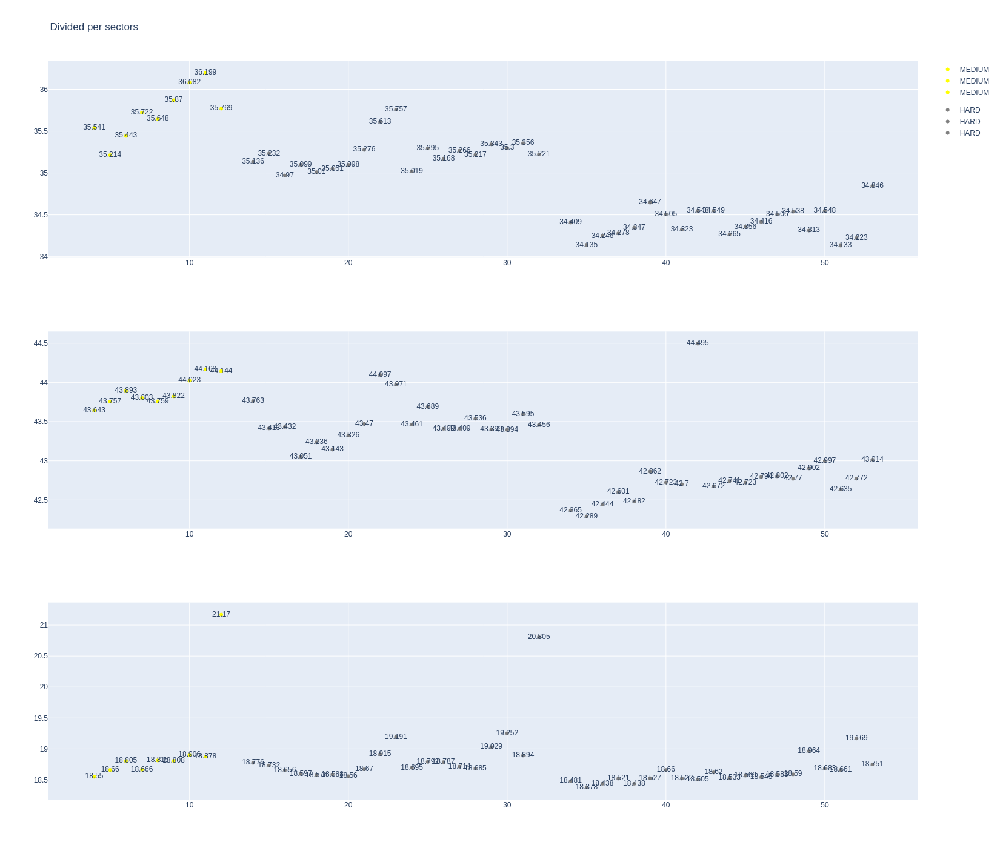

In [215]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [216]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1232,9496,1,14,1,1,SOFT,0
8,1232,9496,1,18,1,1,SOFT,0
25,1232,9496,2,18,2,12,SOFT,0
27,1232,9496,2,14,2,13,SOFT,1
44,1232,9496,3,18,13,22,MEDIUM,0
46,1232,9496,3,14,14,33,MEDIUM,0
53,1232,9496,4,18,23,34,HARD,0
66,1232,9496,4,14,34,54,HARD,0
68,1232,9496,5,18,35,53,SOFT,0


In [217]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
41,Fernando ALONSO,SOFT,2024-04-07T05:37:20.270000+00:00,4,35.510,43.299,18.644,97.453
59,Fernando ALONSO,SOFT,2024-04-07T05:38:57.721000+00:00,5,35.258,43.547,18.727,97.532
77,Fernando ALONSO,SOFT,2024-04-07T05:40:35.294000+00:00,6,35.400,43.705,18.756,97.861
94,Fernando ALONSO,SOFT,2024-04-07T05:42:13.149000+00:00,7,35.735,43.710,18.758,98.203
111,Fernando ALONSO,SOFT,2024-04-07T05:43:51.401000+00:00,8,35.782,43.705,18.974,98.461
127,Fernando ALONSO,SOFT,2024-04-07T05:45:29.677000+00:00,9,35.887,43.921,19.076,98.884
145,Fernando ALONSO,SOFT,2024-04-07T05:47:08.674000+00:00,10,35.987,43.889,18.905,98.781
163,Fernando ALONSO,SOFT,2024-04-07T05:48:47.462000+00:00,11,35.987,43.997,18.959,98.943
180,Fernando ALONSO,SOFT,2024-04-07T05:50:26.439000+00:00,12,35.830,43.982,18.932,98.744
197,Fernando ALONSO,SOFT,2024-04-07T05:52:05.020000+00:00,13,35.625,43.968,21.223,100.816


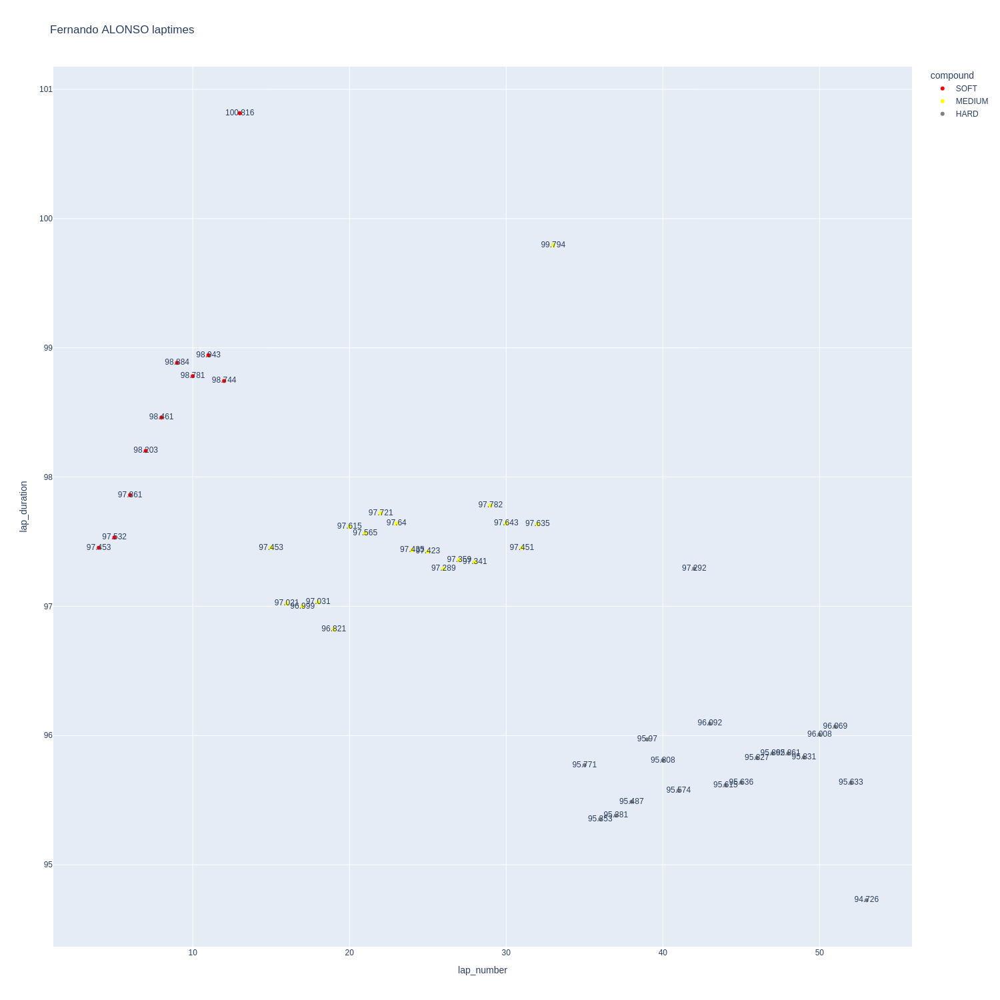

In [218]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

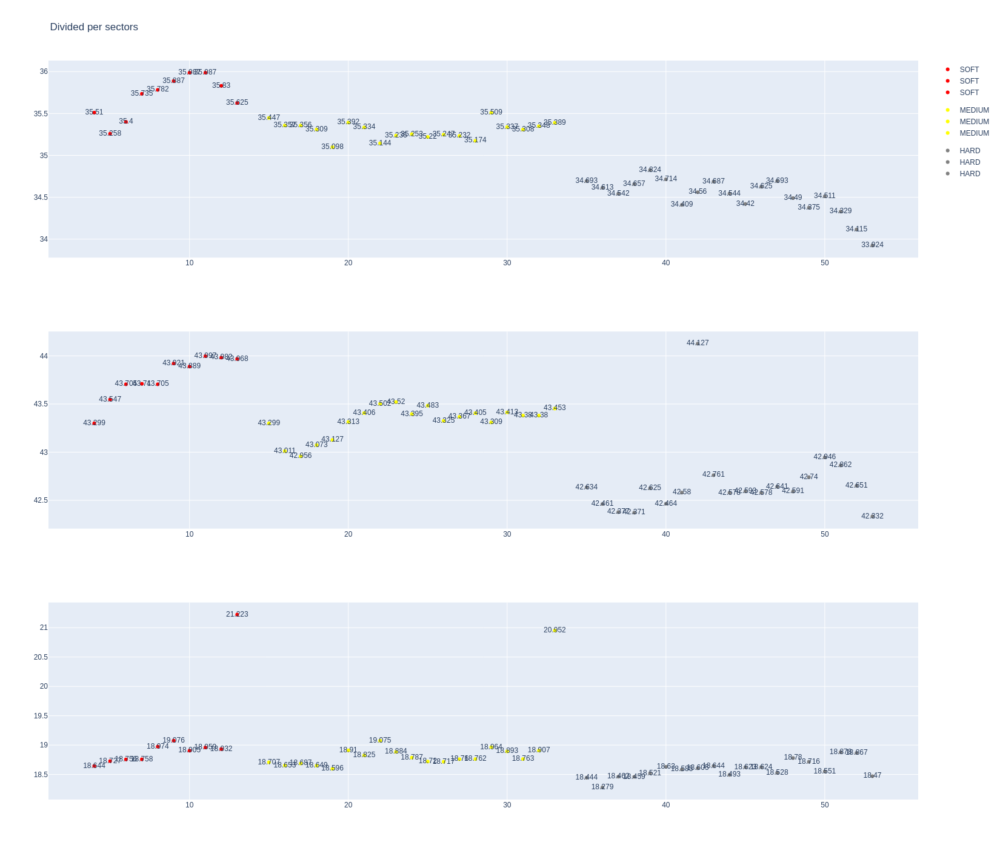

In [219]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [220]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
43,Lance STROLL,SOFT,2024-04-07T05:37:25.201000+00:00,4,36.379,44.265,18.884,99.528
61,Lance STROLL,SOFT,2024-04-07T05:39:04.803000+00:00,5,36.195,44.172,19.185,99.552
79,Lance STROLL,SOFT,2024-04-07T05:40:44.361000+00:00,6,35.622,44.199,18.925,98.746
96,Lance STROLL,SOFT,2024-04-07T05:42:23.093000+00:00,7,35.863,43.832,18.929,98.624
113,Lance STROLL,SOFT,2024-04-07T05:44:01.763000+00:00,8,35.783,43.867,18.960,98.610
129,Lance STROLL,SOFT,2024-04-07T05:45:40.246000+00:00,9,35.977,43.935,18.969,98.881
147,Lance STROLL,SOFT,2024-04-07T05:47:19.266000+00:00,10,36.006,44.041,19.005,99.052
165,Lance STROLL,SOFT,2024-04-07T05:48:58.325000+00:00,11,35.978,44.125,19.000,99.103
182,Lance STROLL,SOFT,2024-04-07T05:50:37.421000+00:00,12,36.035,44.258,21.345,101.638
213,Lance STROLL,MEDIUM,2024-04-07T05:54:15.282000+00:00,14,35.636,43.593,18.706,97.935


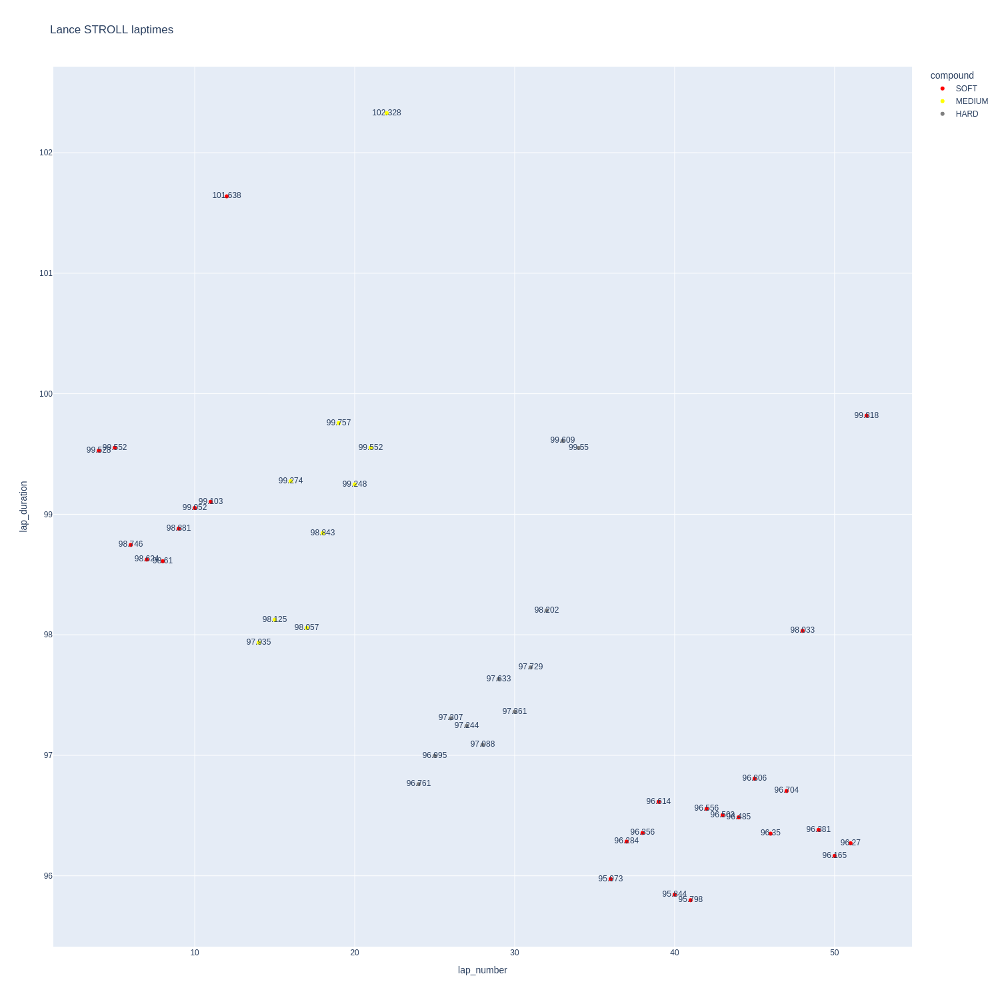

In [221]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

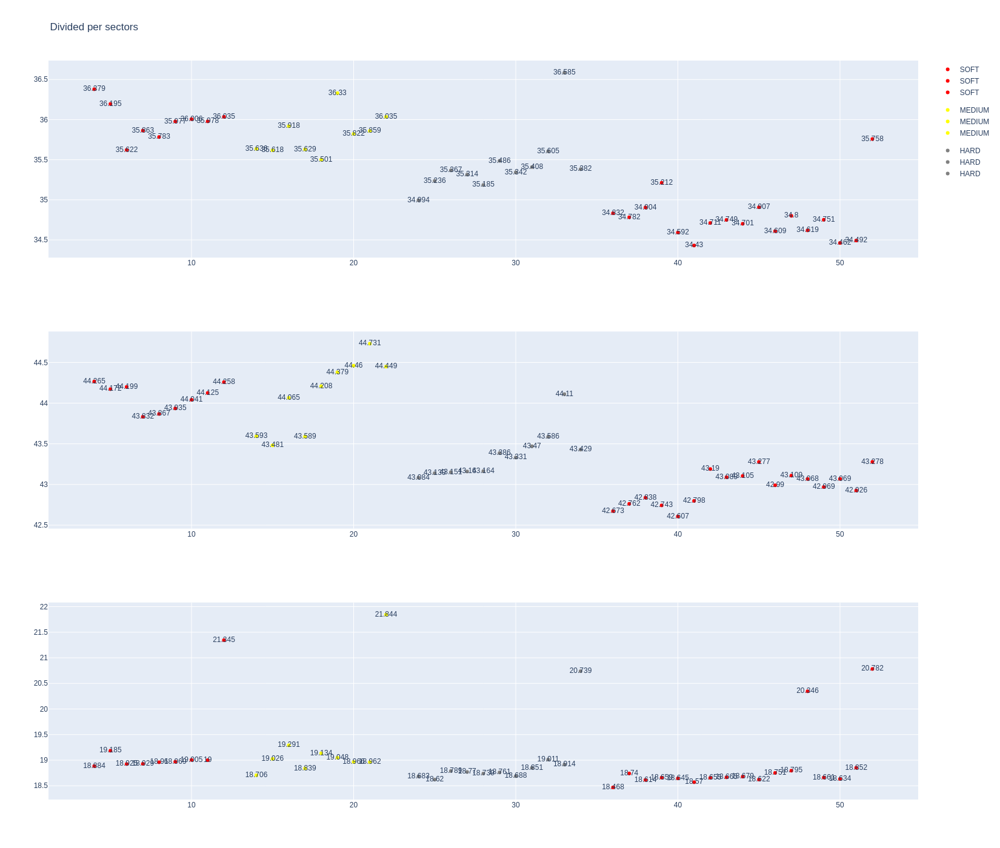

In [222]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [223]:
stintInformation.query('driver_number == 3 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1232,9496,1,3,1,1,MEDIUM,0
10,1232,9496,1,22,1,1,MEDIUM,0
22,1232,9496,2,22,2,7,SOFT,0
41,1232,9496,3,22,8,22,HARD,0
56,1232,9496,4,22,23,53,HARD,0


In [224]:
data = libraryDataF1.getinfolongruns(jointables,3,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [225]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [226]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [227]:
data = libraryDataF1.getinfolongruns(jointables,22,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
45,Yuki TSUNODA,SOFT,2024-04-07T05:37:23.327000+00:00,4,35.860,44.164,19.084,99.108
63,Yuki TSUNODA,SOFT,2024-04-07T05:39:02.309000+00:00,5,36.475,44.129,18.904,99.508
81,Yuki TSUNODA,SOFT,2024-04-07T05:40:41.840000+00:00,6,35.735,44.173,18.979,98.887
98,Yuki TSUNODA,SOFT,2024-04-07T05:42:20.742000+00:00,7,36.025,44.058,20.915,100.998
131,Yuki TSUNODA,HARD,2024-04-07T05:45:59.762000+00:00,9,35.101,43.277,18.792,97.170
149,Yuki TSUNODA,HARD,2024-04-07T05:47:36.915000+00:00,10,35.203,43.432,18.861,97.496
167,Yuki TSUNODA,HARD,2024-04-07T05:49:14.517000+00:00,11,35.353,43.739,18.803,97.895
184,Yuki TSUNODA,HARD,2024-04-07T05:50:52.310000+00:00,12,35.858,44.840,19.359,100.057
200,Yuki TSUNODA,HARD,2024-04-07T05:52:32.415000+00:00,13,36.358,43.714,18.908,98.980
215,Yuki TSUNODA,HARD,2024-04-07T05:54:11.270000+00:00,14,35.514,44.056,18.940,98.510


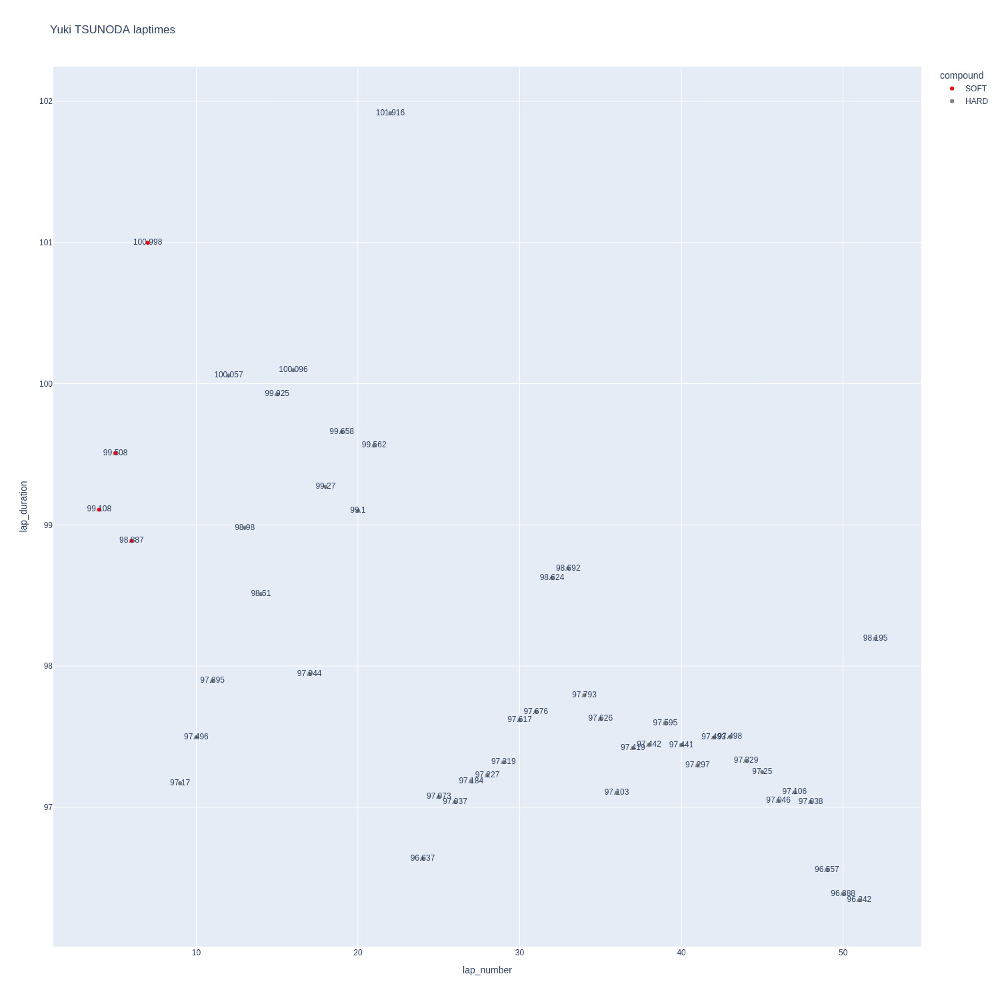

In [228]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

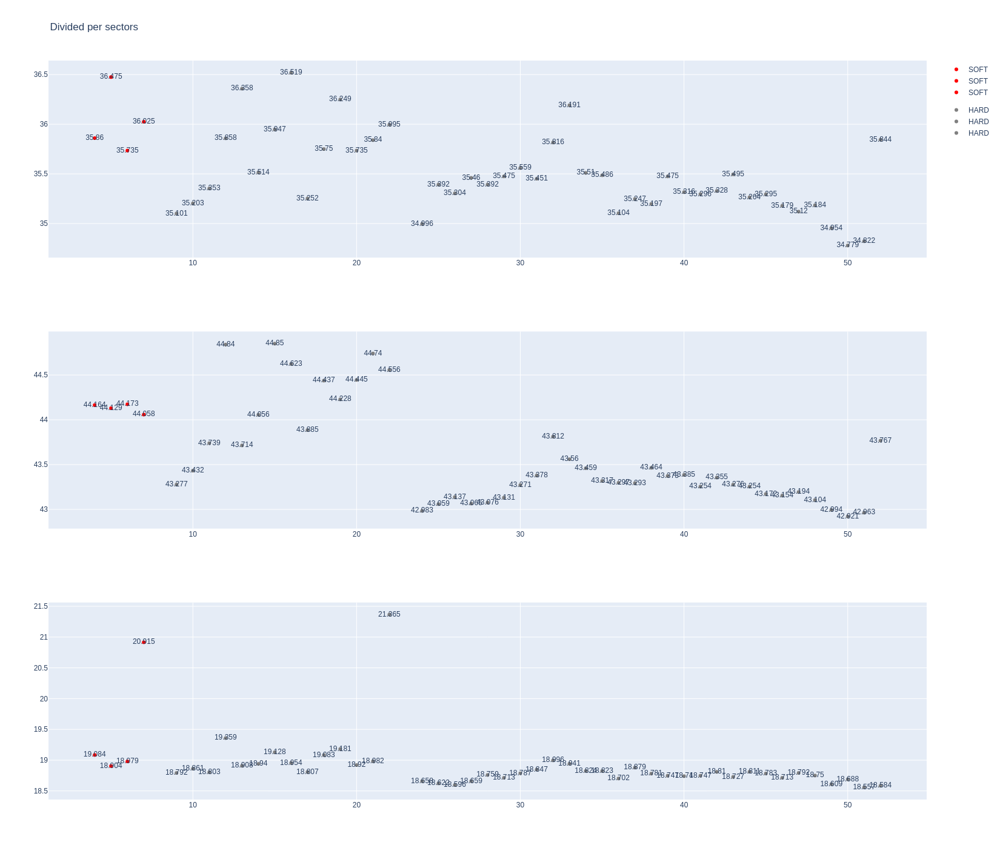

In [229]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [230]:
stintInformation.query('driver_number == 20 or driver_number == 27')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1232,9496,1,20,1,1,MEDIUM,0
13,1232,9496,1,27,1,1,SOFT,0
20,1232,9496,2,27,2,5,SOFT,1
34,1232,9496,2,20,2,22,MEDIUM,0
38,1232,9496,3,27,6,33,HARD,0
55,1232,9496,3,20,23,53,HARD,0
63,1232,9496,4,27,34,53,HARD,0


In [231]:
data = libraryDataF1.getinfolongruns(jointables,20,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
44,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:37:26.070000+00:00,4,36.735,44.554,18.814,100.103
62,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:39:06.386000+00:00,5,36.288,44.278,18.826,99.392
80,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:40:45.764000+00:00,6,36.586,44.603,18.837,100.026
97,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:42:25.716000+00:00,7,36.824,44.474,19.059,100.357
114,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:44:06.009000+00:00,8,36.395,44.266,18.940,99.601
130,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:45:45.670000+00:00,9,36.807,44.400,19.044,100.251
148,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:47:25.984000+00:00,10,36.841,44.388,18.948,100.177
166,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:49:06.191000+00:00,11,36.701,44.257,18.942,99.900
183,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:50:46.065000+00:00,12,36.607,44.569,19.084,100.260
199,Kevin MAGNUSSEN,MEDIUM,2024-04-07T05:52:26.244000+00:00,13,36.061,44.270,18.936,99.267


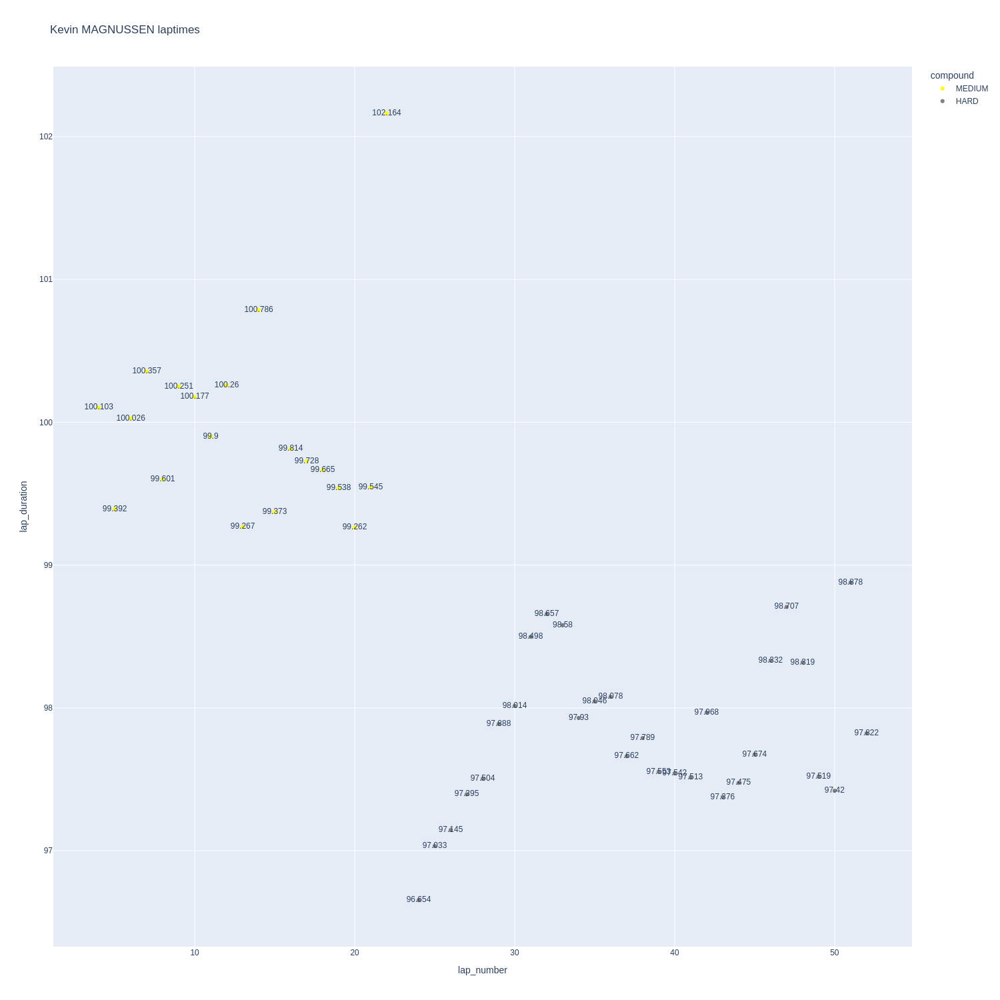

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

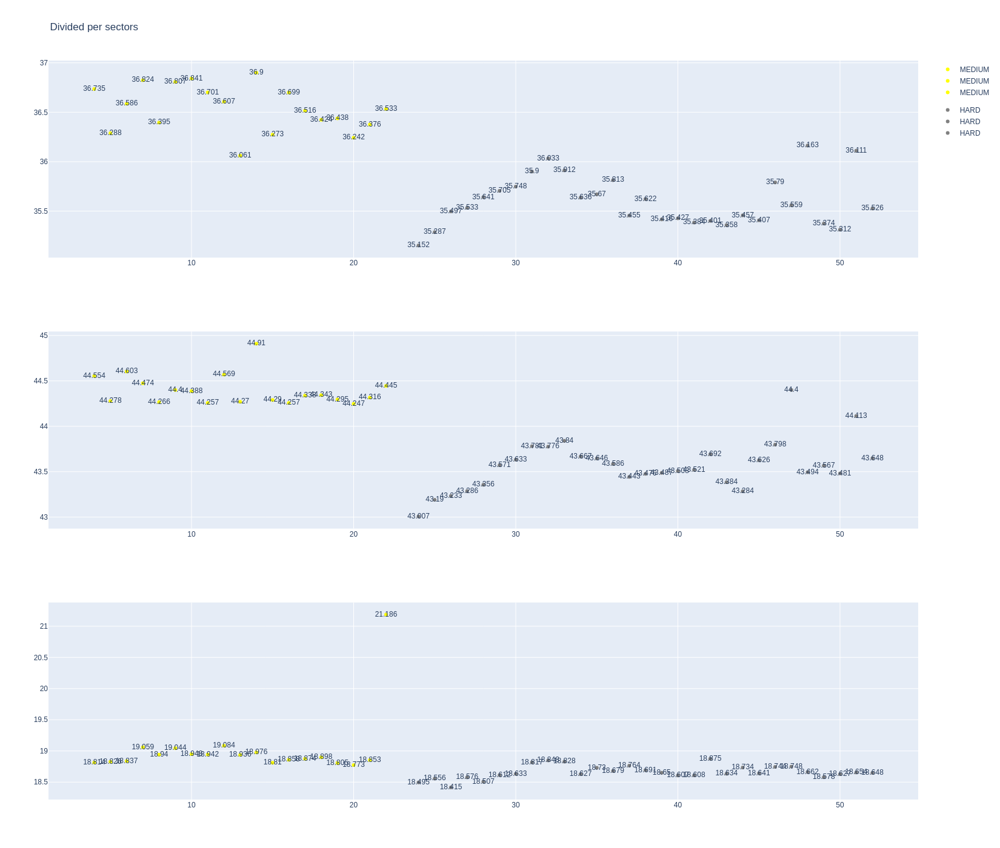

In [233]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [234]:
data = libraryDataF1.getinfolongruns(jointables,27,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
47,Nico HULKENBERG,SOFT,2024-04-07T05:37:26.971000+00:00,4,36.724,44.611,19.039,100.374
65,Nico HULKENBERG,SOFT,2024-04-07T05:39:07.327000+00:00,5,36.317,44.250,20.924,101.491
100,Nico HULKENBERG,HARD,2024-04-07T05:42:46.205000+00:00,7,35.291,43.082,18.378,96.751
115,Nico HULKENBERG,HARD,2024-04-07T05:44:22.845000+00:00,8,35.737,43.289,18.590,97.616
133,Nico HULKENBERG,HARD,2024-04-07T05:46:00.583000+00:00,9,35.759,43.606,18.533,97.898
151,Nico HULKENBERG,HARD,2024-04-07T05:47:38.320000+00:00,10,35.956,43.786,18.598,98.340
169,Nico HULKENBERG,HARD,2024-04-07T05:49:16.655000+00:00,11,35.955,43.638,18.759,98.352
185,Nico HULKENBERG,HARD,2024-04-07T05:50:54.989000+00:00,12,36.092,43.942,18.813,98.847
201,Nico HULKENBERG,HARD,2024-04-07T05:52:33.881000+00:00,13,36.471,44.415,19.416,100.302
216,Nico HULKENBERG,HARD,2024-04-07T05:54:14.290000+00:00,14,36.003,43.889,18.725,98.617


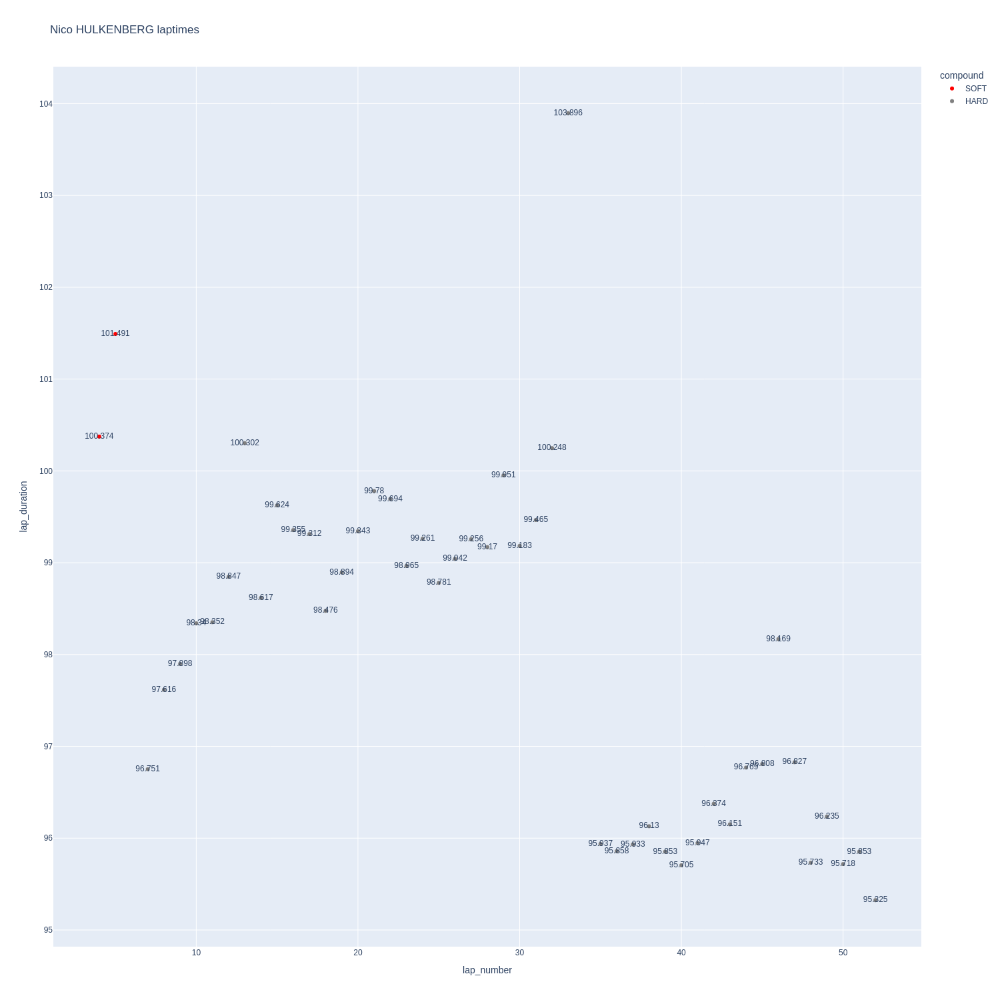

In [235]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

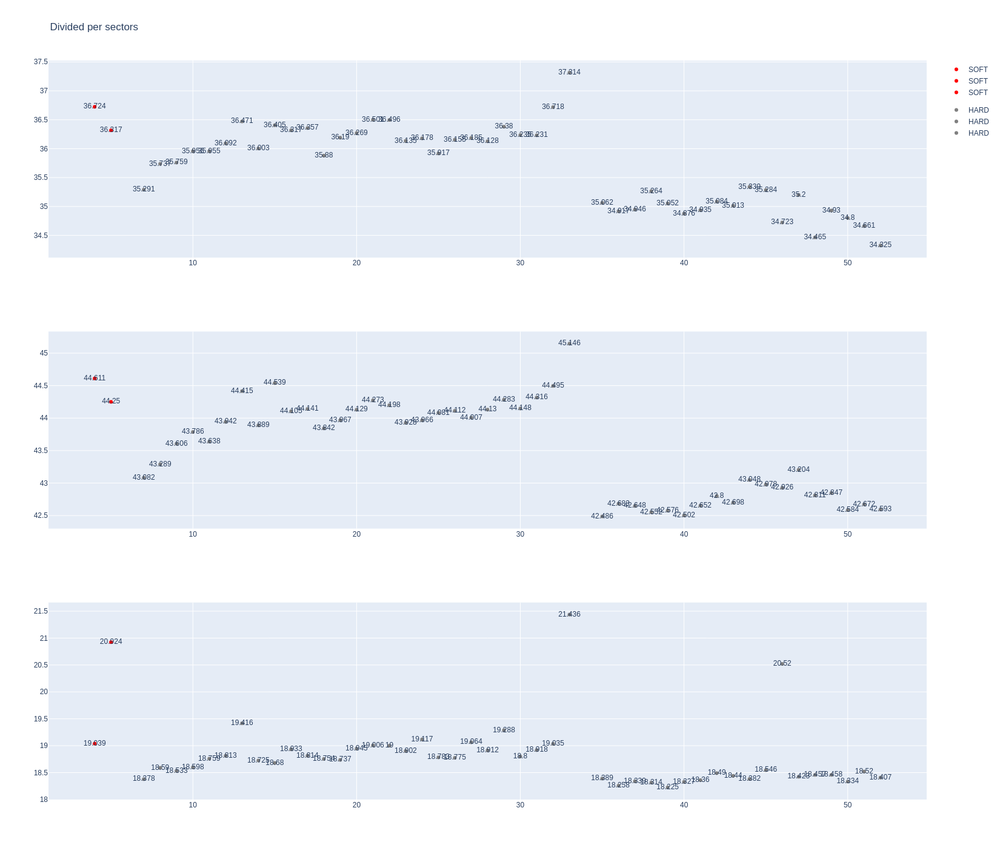

In [236]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [237]:
stintInformation.query('driver_number == 10 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1232,9496,1,10,1,1,SOFT,0
14,1232,9496,1,31,1,1,SOFT,0
31,1232,9496,2,10,2,16,HARD,0
32,1232,9496,2,31,2,19,HARD,0
49,1232,9496,3,10,17,32,MEDIUM,0
51,1232,9496,3,31,20,33,HARD,0
61,1232,9496,4,10,33,53,HARD,0
64,1232,9496,4,31,34,53,MEDIUM,0


In [238]:
data =libraryDataF1.getinfolongruns(jointables,31,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
48,Esteban OCON,HARD,2024-04-07T05:37:24.445000+00:00,4,36.369,44.208,18.964,99.541
66,Esteban OCON,HARD,2024-04-07T05:39:04.069000+00:00,5,36.454,44.473,19.154,100.081
83,Esteban OCON,HARD,2024-04-07T05:40:44.140000+00:00,6,36.780,44.623,19.093,100.496
101,Esteban OCON,HARD,2024-04-07T05:42:24.664000+00:00,7,36.288,44.462,18.994,99.744
116,Esteban OCON,HARD,2024-04-07T05:44:04.267000+00:00,8,36.225,44.638,19.146,100.009
134,Esteban OCON,HARD,2024-04-07T05:45:44.382000+00:00,9,36.268,44.745,19.281,100.294
152,Esteban OCON,HARD,2024-04-07T05:47:24.665000+00:00,10,36.333,44.822,19.160,100.315
170,Esteban OCON,HARD,2024-04-07T05:49:05.033000+00:00,11,36.426,44.729,19.216,100.371
186,Esteban OCON,HARD,2024-04-07T05:50:45.284000+00:00,12,36.536,44.765,19.259,100.560
202,Esteban OCON,HARD,2024-04-07T05:52:25.947000+00:00,13,37.253,44.865,19.223,101.341


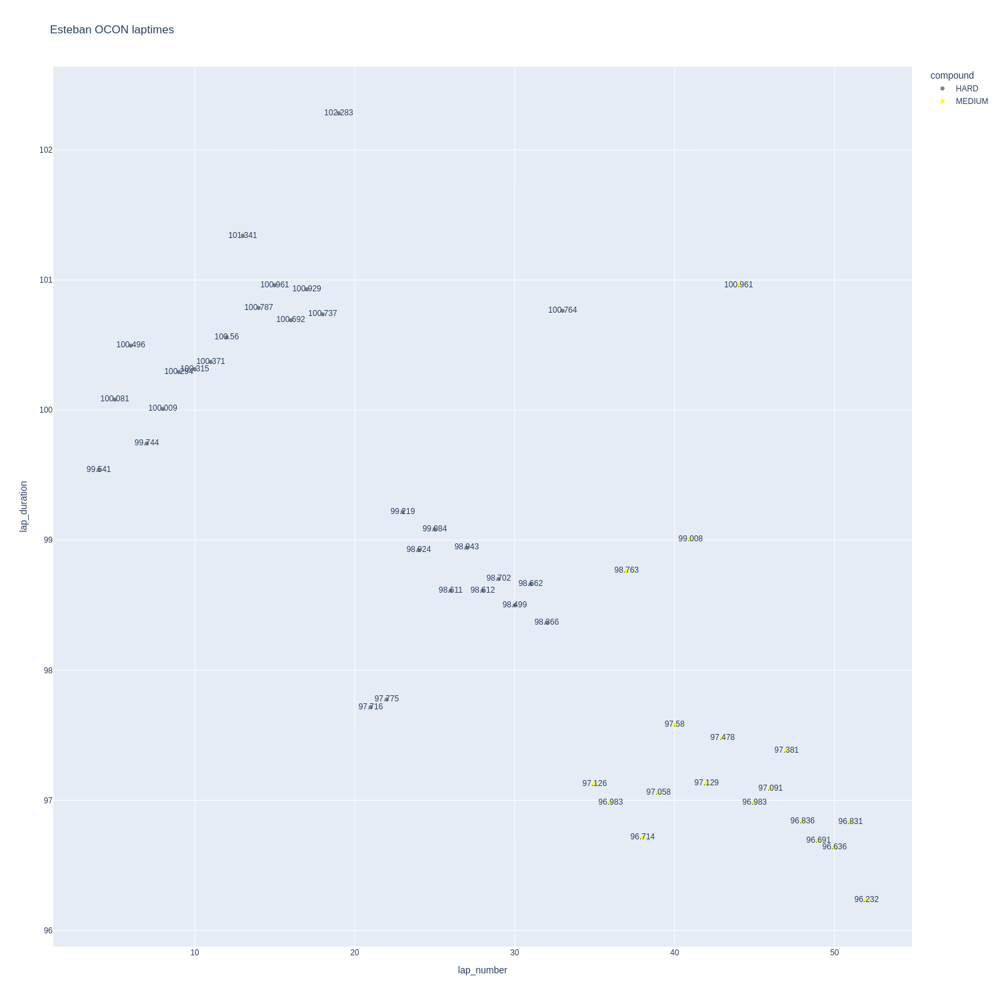

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

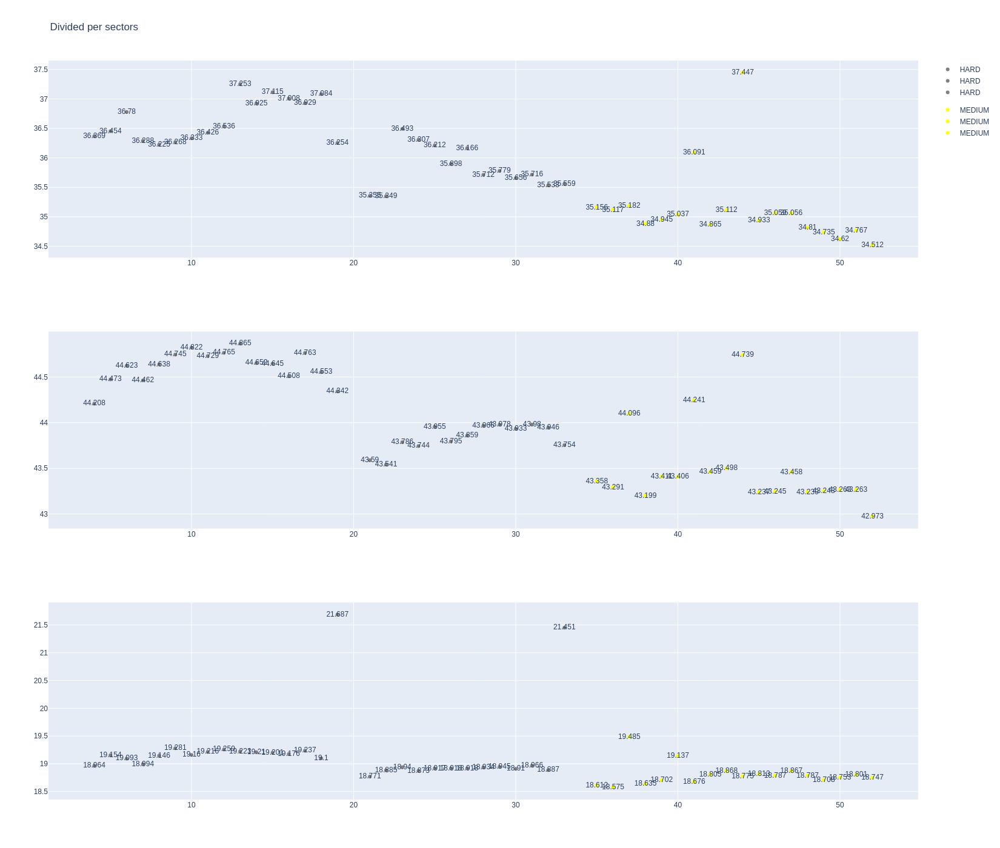

In [240]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [241]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
39,Pierre GASLY,HARD,2024-04-07T05:37:25.752000+00:00,4,36.680,44.410,18.835,99.925
57,Pierre GASLY,HARD,2024-04-07T05:39:05.766000+00:00,5,36.122,44.509,18.842,99.473
75,Pierre GASLY,HARD,2024-04-07T05:40:45.191000+00:00,6,36.667,44.516,19.074,100.257
92,Pierre GASLY,HARD,2024-04-07T05:42:25.517000+00:00,7,36.461,44.726,19.061,100.248
109,Pierre GASLY,HARD,2024-04-07T05:44:05.624000+00:00,8,37.525,44.759,19.079,101.363
125,Pierre GASLY,HARD,2024-04-07T05:45:47.078000+00:00,9,36.840,44.704,19.236,100.780
143,Pierre GASLY,HARD,2024-04-07T05:47:27.937000+00:00,10,36.846,44.878,19.393,101.117
161,Pierre GASLY,HARD,2024-04-07T05:49:08.971000+00:00,11,37.365,45.056,19.207,101.628
178,Pierre GASLY,HARD,2024-04-07T05:50:50.536000+00:00,12,36.798,45.061,19.248,101.107
195,Pierre GASLY,HARD,2024-04-07T05:52:31.666000+00:00,13,37.619,45.216,19.640,102.475


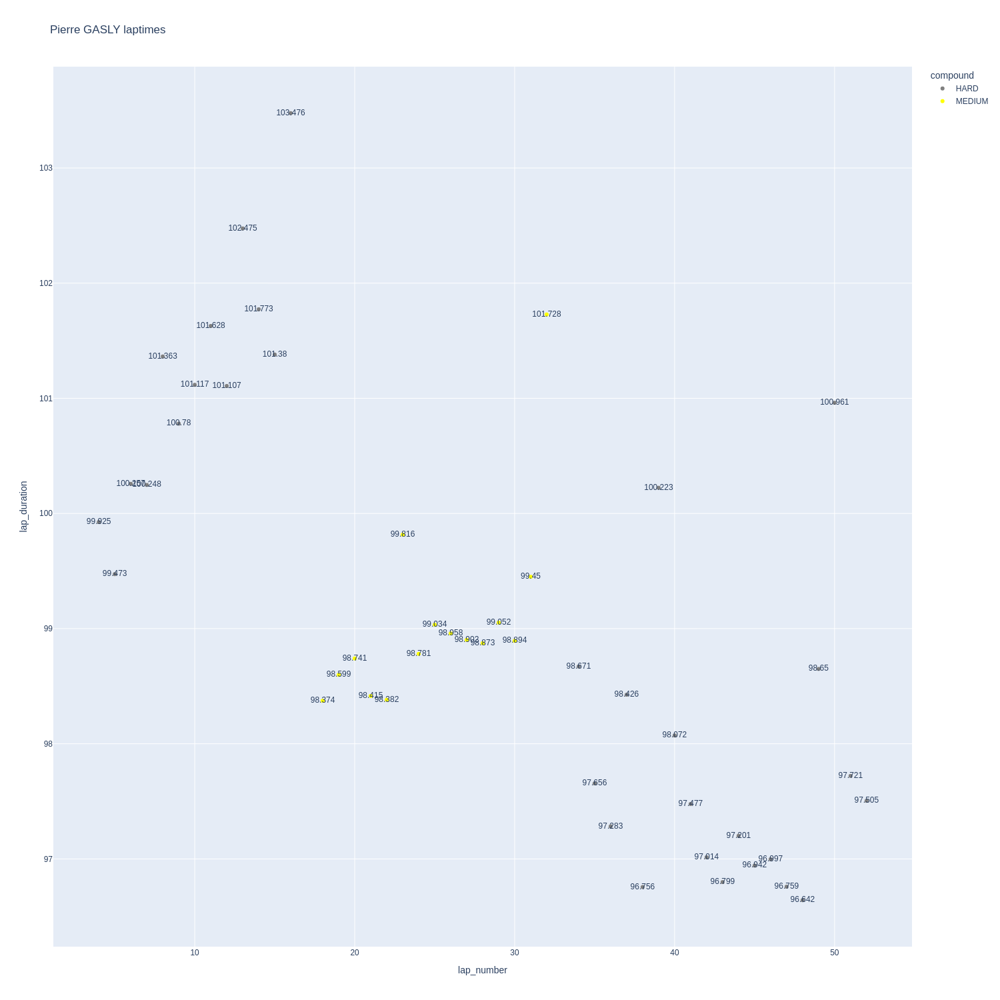

In [242]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

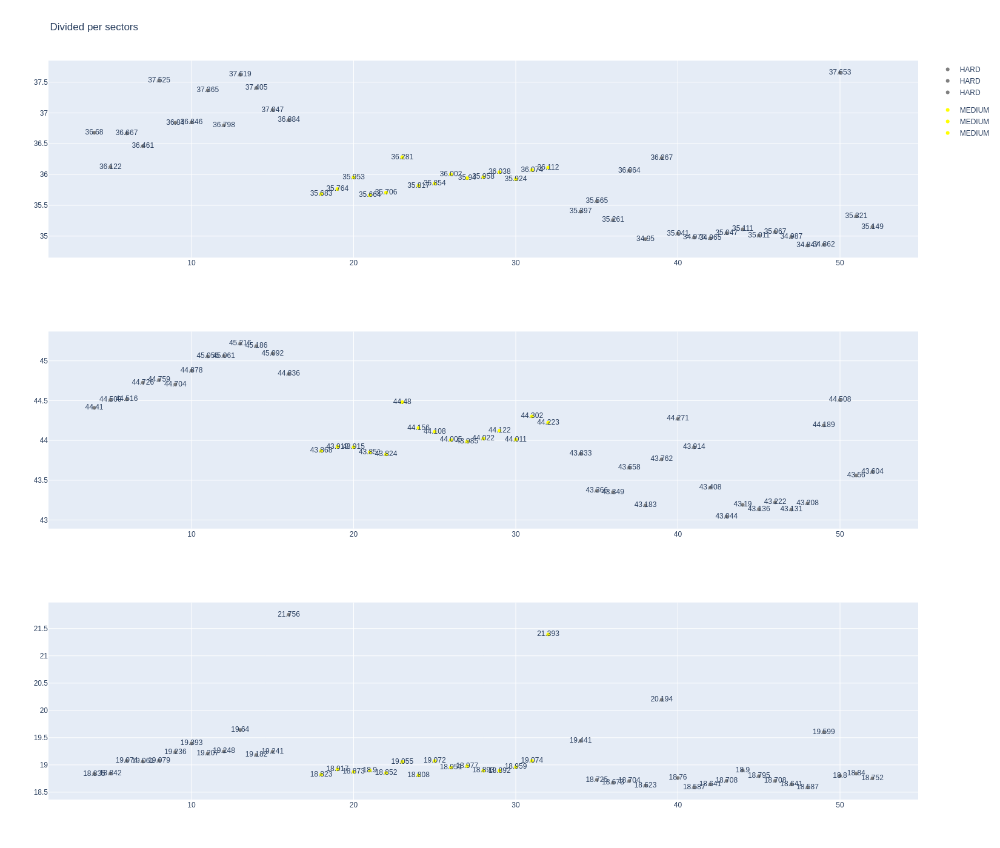

In [243]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [244]:
stintInformation.query('driver_number == 2 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1232,9496,1,2,1,1,SOFT,0
11,1232,9496,1,23,1,1,SOFT,0
33,1232,9496,2,2,2,22,HARD,0
52,1232,9496,3,2,23,34,HARD,0
67,1232,9496,4,2,35,41,MEDIUM,0
73,1232,9496,5,2,42,53,SOFT,0


In [245]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [247]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [248]:
data= libraryDataF1.getinfolongruns(jointables,2,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,Logan SARGEANT,HARD,2024-04-07T05:37:28.176000+00:00,4,36.434,44.774,19.216,100.424
55,Logan SARGEANT,HARD,2024-04-07T05:39:08.449000+00:00,5,36.207,44.330,19.131,99.668
73,Logan SARGEANT,HARD,2024-04-07T05:40:48.052000+00:00,6,36.092,44.349,19.141,99.582
90,Logan SARGEANT,HARD,2024-04-07T05:42:27.739000+00:00,7,36.282,44.698,19.075,100.055
107,Logan SARGEANT,HARD,2024-04-07T05:44:07.852000+00:00,8,36.250,44.365,19.040,99.655
123,Logan SARGEANT,HARD,2024-04-07T05:45:47.405000+00:00,9,36.826,44.553,19.492,100.871
141,Logan SARGEANT,HARD,2024-04-07T05:47:28.397000+00:00,10,36.700,44.669,19.547,100.916
159,Logan SARGEANT,HARD,2024-04-07T05:49:09.195000+00:00,11,35.793,44.379,19.176,99.348
177,Logan SARGEANT,HARD,2024-04-07T05:50:48.549000+00:00,12,36.178,44.696,19.037,99.911
193,Logan SARGEANT,HARD,2024-04-07T05:52:28.449000+00:00,13,36.308,44.799,19.090,100.197


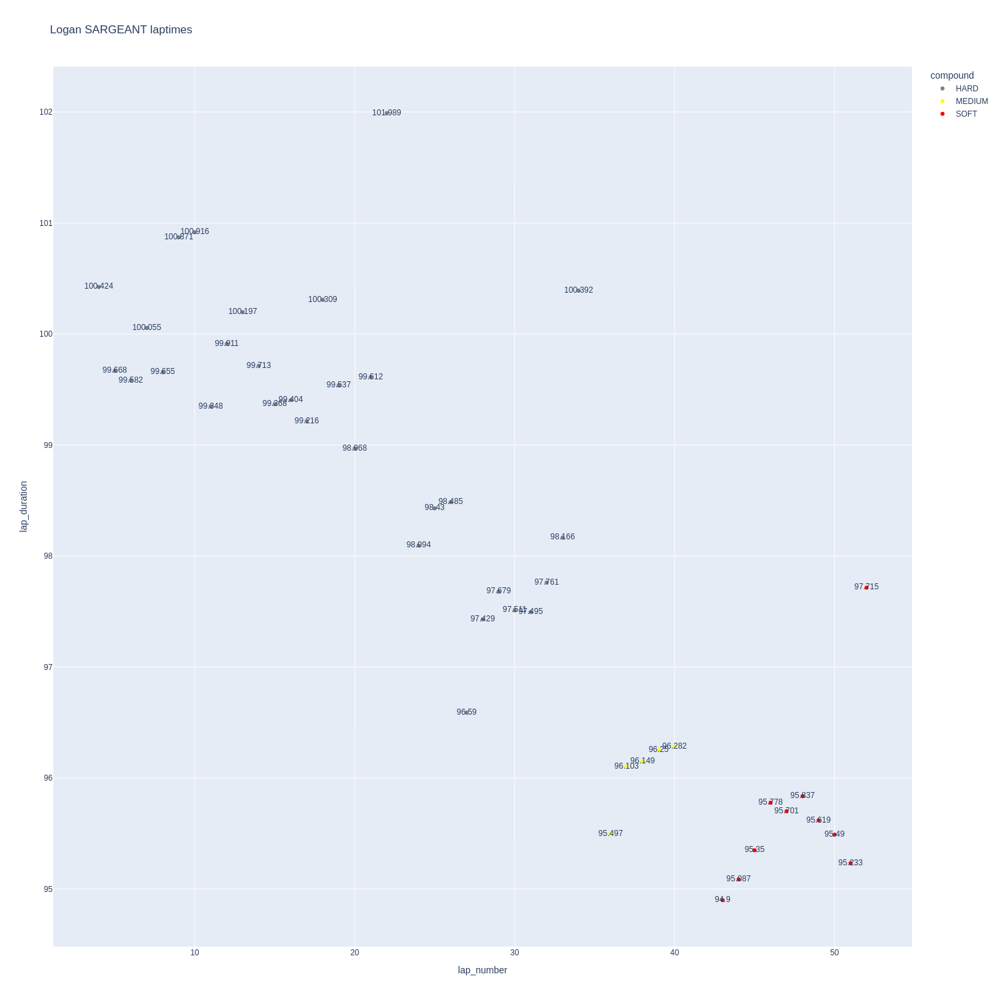

In [249]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

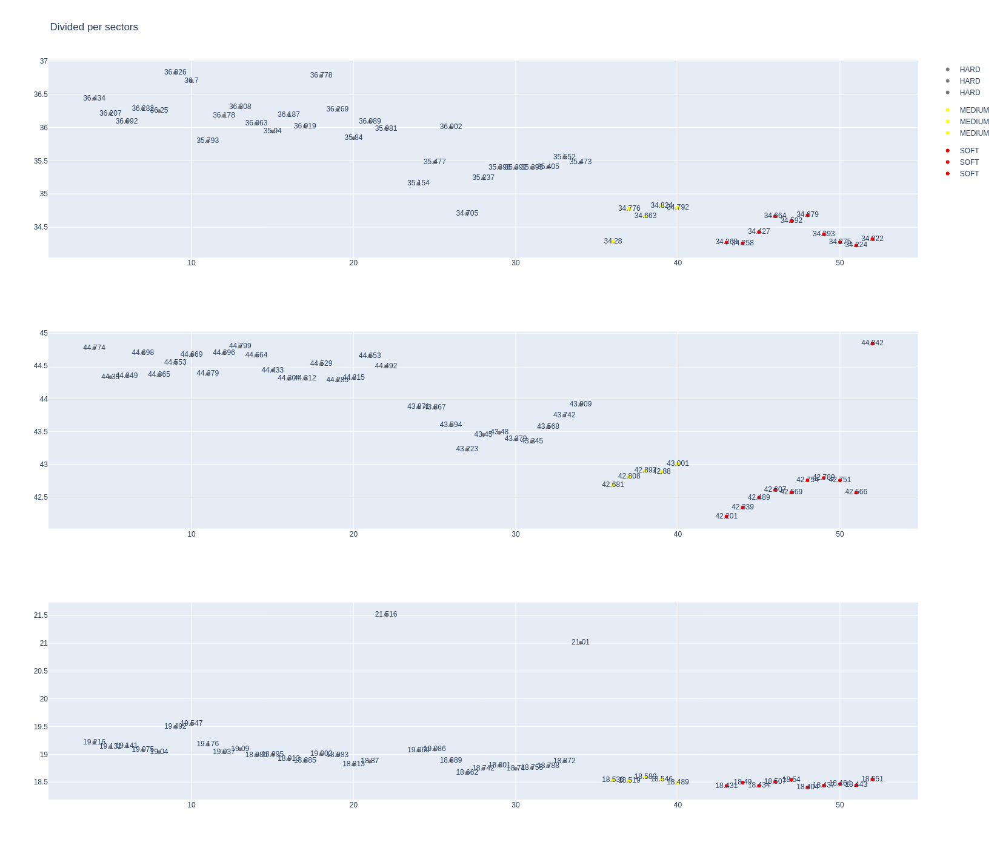

In [250]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [251]:
stintInformation.query('driver_number == 24 or driver_number == 77')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1232,9496,1,24,1,1,MEDIUM,0
18,1232,9496,1,77,1,1,SOFT,0
21,1232,9496,2,77,2,6,SOFT,0
23,1232,9496,2,24,2,7,SOFT,0
39,1232,9496,3,77,7,22,HARD,0
40,1232,9496,3,24,8,11,HARD,0
42,1232,9496,4,24,12,13,HARD,4
57,1232,9496,4,77,23,53,HARD,0


In [252]:
data = libraryDataF1.getinfolongruns(jointables,24,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
46,ZHOU Guanyu,SOFT,2024-04-07T05:37:26.365000+00:00,4,36.656,44.602,18.970,100.228
64,ZHOU Guanyu,SOFT,2024-04-07T05:39:06.629000+00:00,5,36.238,44.522,18.837,99.597
82,ZHOU Guanyu,SOFT,2024-04-07T05:40:46.211000+00:00,6,36.364,44.705,18.922,99.991
99,ZHOU Guanyu,SOFT,2024-04-07T05:42:26.288000+00:00,7,36.610,44.661,21.603,102.874
132,ZHOU Guanyu,HARD,2024-04-07T05:46:07.516000+00:00,9,35.194,43.257,18.709,97.160
150,ZHOU Guanyu,HARD,2024-04-07T05:47:44.696000+00:00,10,35.186,43.455,18.859,97.500
168,ZHOU Guanyu,HARD,2024-04-07T05:49:22.182000+00:00,11,35.334,43.688,22.095,101.117


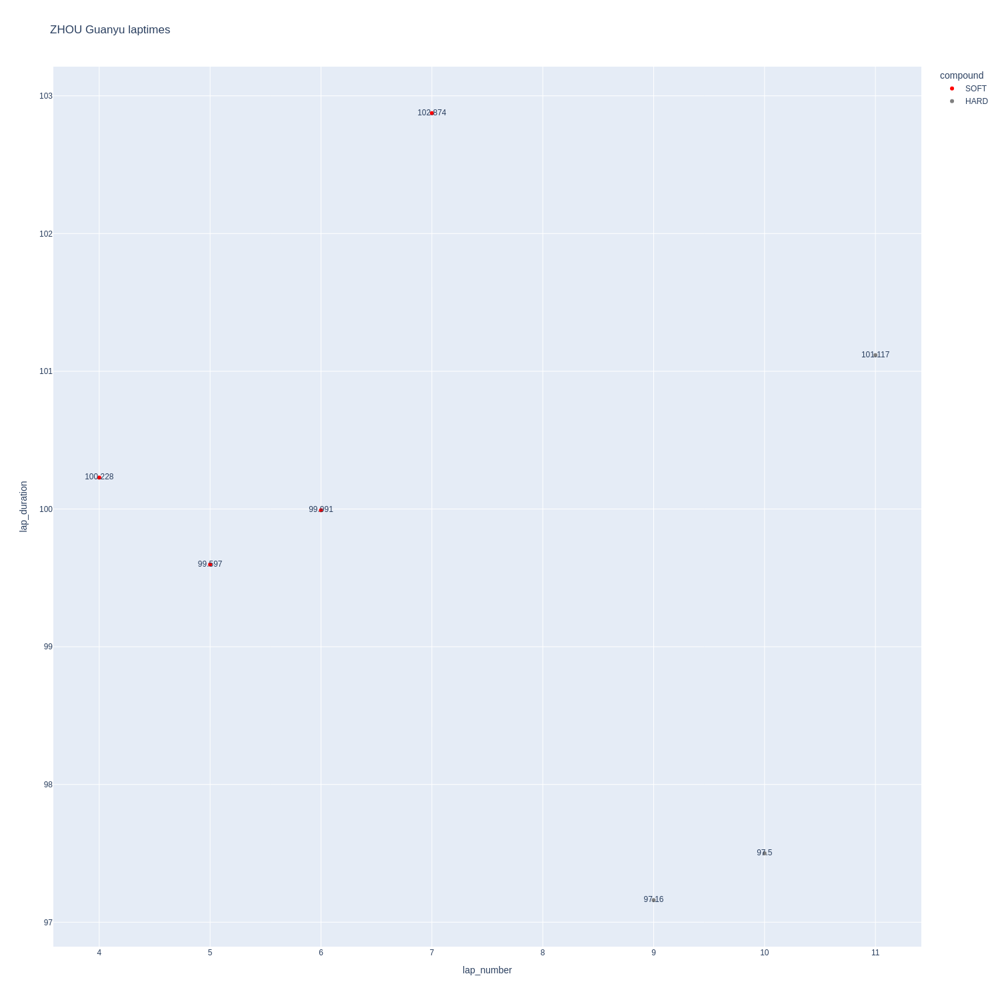

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

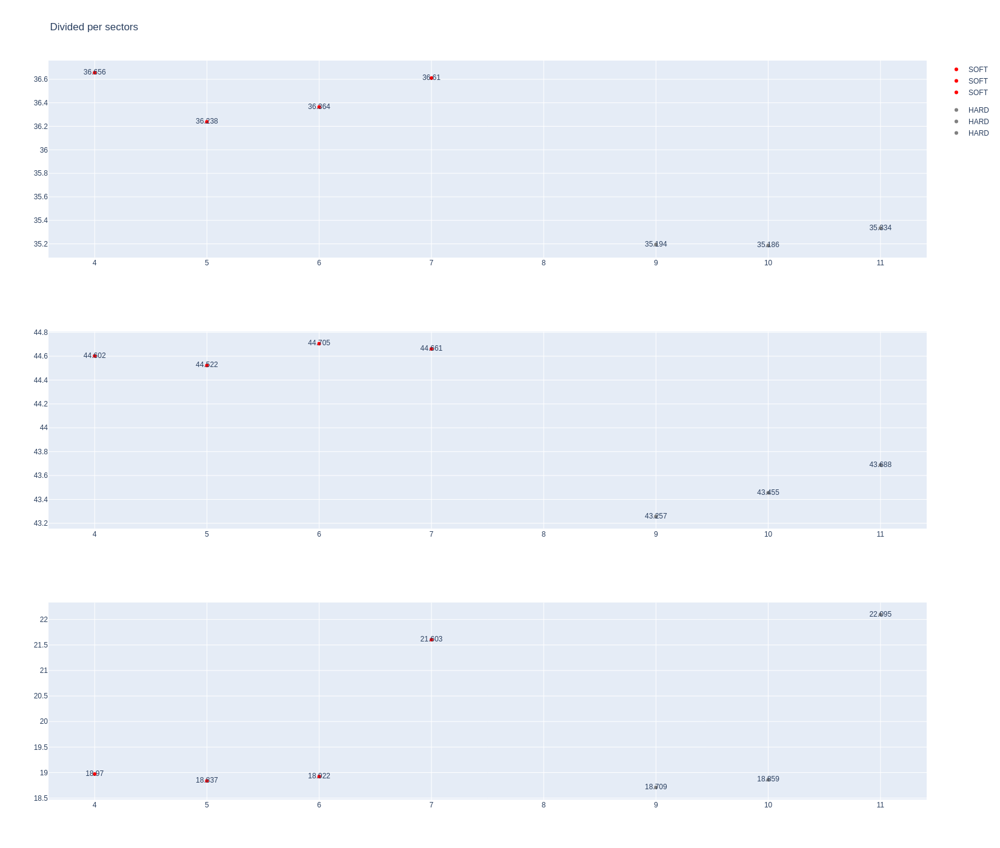

In [254]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [255]:
data = libraryDataF1.getinfolongruns(jointables,77,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
52,Valtteri BOTTAS,SOFT,2024-04-07T05:37:24.899000+00:00,4,36.346,44.258,18.858,99.462
70,Valtteri BOTTAS,SOFT,2024-04-07T05:39:04.266000+00:00,5,35.077,44.436,18.766,98.279
87,Valtteri BOTTAS,SOFT,2024-04-07T05:40:42.575000+00:00,6,35.946,44.383,20.959,101.288
120,Valtteri BOTTAS,HARD,2024-04-07T05:44:21.338000+00:00,8,34.647,43.282,18.777,96.706
138,Valtteri BOTTAS,HARD,2024-04-07T05:45:57.922000+00:00,9,35.119,43.512,18.775,97.406
156,Valtteri BOTTAS,HARD,2024-04-07T05:47:35.397000+00:00,10,35.294,43.417,18.740,97.451
174,Valtteri BOTTAS,HARD,2024-04-07T05:49:12.859000+00:00,11,35.641,43.995,18.796,98.432
190,Valtteri BOTTAS,HARD,2024-04-07T05:50:51.356000+00:00,12,36.340,44.964,19.387,100.691
206,Valtteri BOTTAS,HARD,2024-04-07T05:52:31.909000+00:00,13,35.372,43.985,18.925,98.282
221,Valtteri BOTTAS,HARD,2024-04-07T05:54:10.116000+00:00,14,35.551,44.191,18.975,98.717


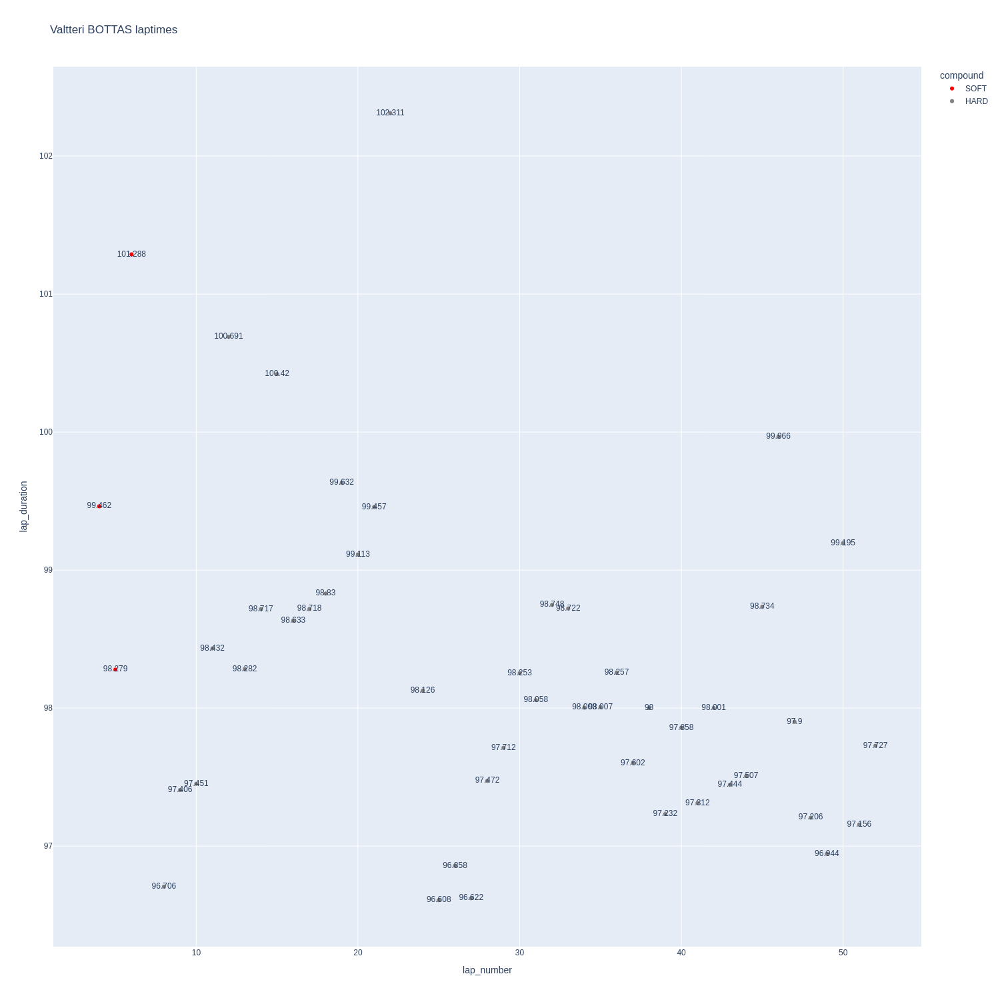

In [256]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

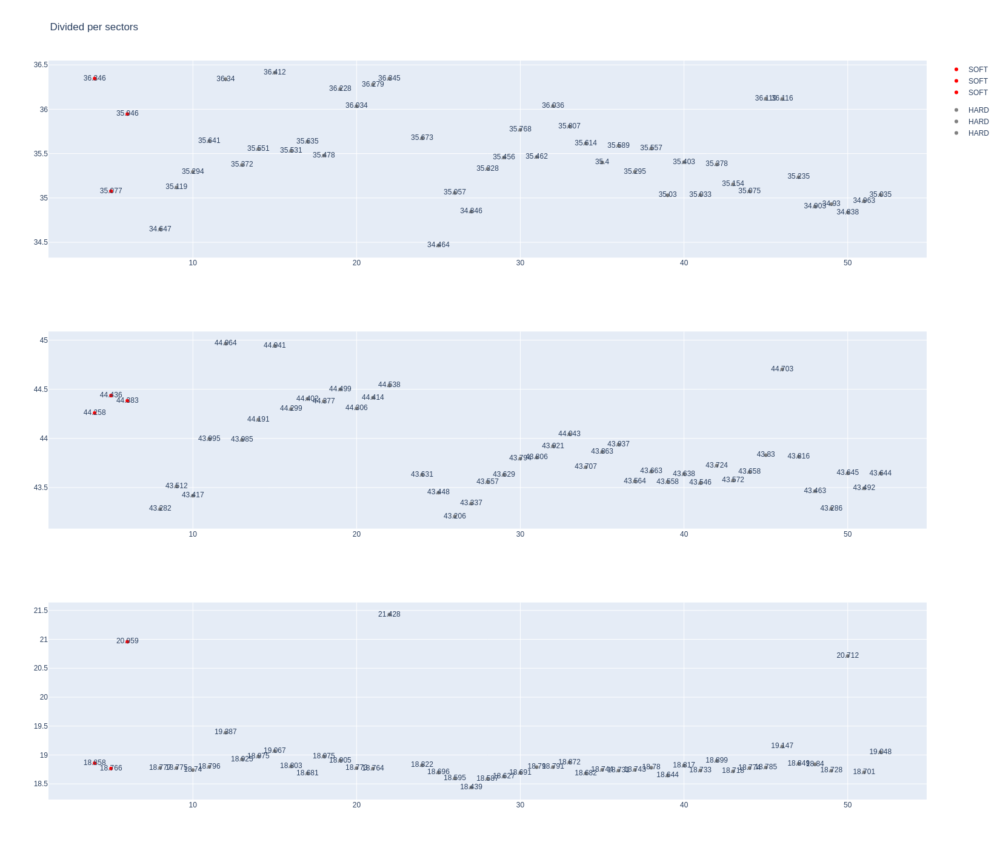

In [257]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [258]:
pit = libraryDataF1.obtain_information('pit',session_key=9496)

In [259]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Red Bull Racing,23.025000
Aston Martin,23.080000
McLaren,23.100000
Ferrari,23.266667
RB,23.350000
Mercedes,23.400000
Alpine,23.575000
Williams,24.300000
Haas F1 Team,24.533333
